In [1]:
# Non-monotonic testing for paper writing short version——2025.06.26
import tensorflow.compat.v1 as tf
tf.compat.v1.disable_eager_execution()
#import tensorflow as tf
import os
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt # plt 用于显示图片
import matplotlib.patches as mpatches
#import seaborn as sns
from PIL import Image,ImageFont,ImageDraw
from matplotlib.pyplot import MultipleLocator
from matplotlib import font_manager
import time
#import h5py
import cv2
from pylab import *
from numpy import *
import cv2
from skimage import data, io, transform, color, measure, segmentation, morphology, feature, filters # Gabor
from skimage.feature import greycomatrix, greycoprops, local_binary_pattern # GLCM
from sklearn.metrics import confusion_matrix # Confusion_matrix
import pandas as pd # for excel
from openpyxl import Workbook
print('loading complete')

loading complete


loading complete


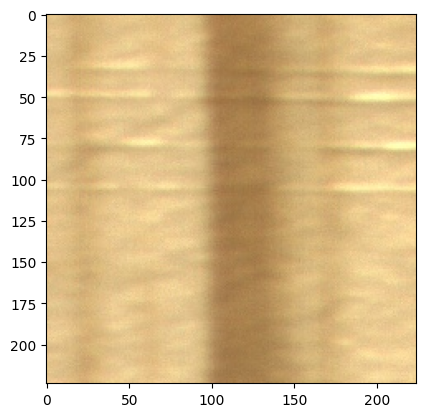

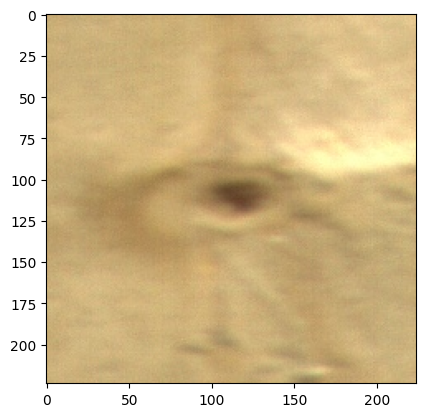

x_train_224: (2016, 224, 224, 3)
y_train.shape: (2016, 1, 1, 7)
x_test_224: (504, 224, 224, 3)
y_test.shape: (504, 1, 1, 7)
y_train:
 [[[[0. 0. 0. 0. 0. 1. 0.]]]


 [[[0. 0. 0. 0. 0. 1. 0.]]]


 [[[0. 0. 0. 0. 0. 0. 1.]]]


 [[[0. 0. 0. 0. 0. 0. 1.]]]]
y_test:
 [[[[0. 0. 0. 0. 0. 1. 0.]]]


 [[[0. 0. 0. 0. 0. 1. 0.]]]


 [[[0. 0. 0. 0. 0. 0. 1.]]]


 [[[0. 0. 0. 0. 0. 0. 1.]]]]


'Sat Feb 14 10:03:41 2026'

In [2]:
# data load(7 classes 2016p) 2026.02.10
Path = 'D:/pythonworkspace/'
x_train_224 = np.load(Path + 'x_train_224_7classes_2016p.npy') # 
y_train = np.load(Path + 'y_train_7classes_2016p.npy') # 
x_test_224 = np.load(Path + 'x_test_224_7classes_504p.npy') # 
y_test = np.load(Path + 'y_test_7classes_504p.npy') # 2016
print('loading complete')
n = 90
plt.imshow(x_train_224[n], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_224[n], cmap = 'Greys_r') # sample image display
plt.show()
print('x_train_224:', x_train_224.shape)
print('y_train.shape:', y_train.shape)
print('x_test_224:', x_test_224.shape)
print('y_test.shape:', y_test.shape)
print('y_train:\n', y_train[286 + 288 * 5:290 + 288 * 5])
print('y_test:\n', y_test[70 + 72 * 5:74 + 72 * 5])
time.asctime()

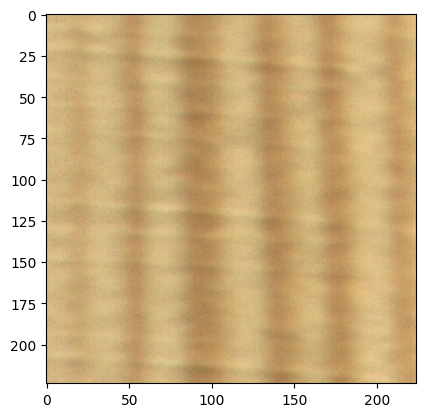

In [165]:
# 图像保存（论文）-2026.02.10
t = x_test_224[72 * 6 + 5]
plt.imshow(t, cmap = 'Greys_r') # sample image display
plt.show()
mpimg.imsave('E:/工作/European Journal of Wood and Wood Products/pictures/s7_2.jpg', t)

loading complete


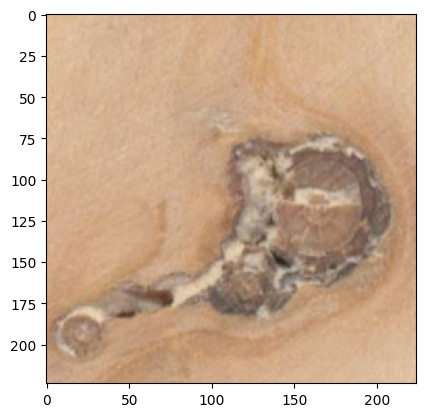

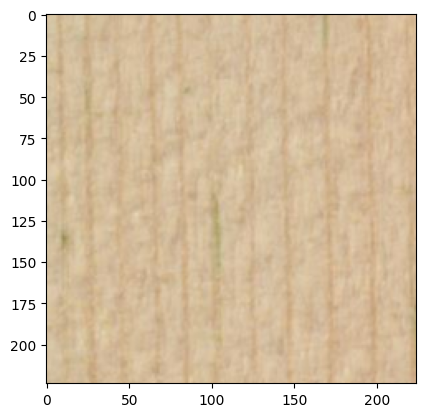

x_train_224: (2880, 224, 224, 3)
y_train: (2880, 1, 1, 4)
x_test_224: (120, 224, 224, 3)
y_test: (120, 1, 1, 4)


'Tue Feb 10 14:41:09 2026'

In [74]:
# data load(4 classes 2880p) 2026.01.28
Path = 'D:/pythonworkspace/'
x_train_224 = np.load(Path + 'x_train_224_4classes_2880p.npy') # 
y_train = np.load(Path + 'y_train_4classes_2880p.npy') # 
x_test_224 = np.load(Path + 'x_test_224_4classes_120p.npy') # 
y_test = np.load(Path + 'y_test_4classes_120p.npy') # 1728
print('loading complete')
n = 90
plt.imshow(x_train_224[n], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_224[n], cmap = 'Greys_r') # sample image display
plt.show()
print('x_train_224:', x_train_224.shape)
print('y_train:', y_train.shape)
print('x_test_224:', x_test_224.shape)
print('y_test:', y_test.shape)
time.asctime()

In [5]:
for i in range(x_test_224.shape[0]):
    print('i:', i + 1)
    print('label:', y_test[i, 0, 0])
    #plt.imshow(x_test_224[i], cmap = 'Greys_r') # sample image display
    #plt.show()

i: 1
label: [1. 0. 0. 0.]
i: 2
label: [1. 0. 0. 0.]
i: 3
label: [1. 0. 0. 0.]
i: 4
label: [1. 0. 0. 0.]
i: 5
label: [1. 0. 0. 0.]
i: 6
label: [1. 0. 0. 0.]
i: 7
label: [1. 0. 0. 0.]
i: 8
label: [1. 0. 0. 0.]
i: 9
label: [1. 0. 0. 0.]
i: 10
label: [1. 0. 0. 0.]
i: 11
label: [1. 0. 0. 0.]
i: 12
label: [1. 0. 0. 0.]
i: 13
label: [1. 0. 0. 0.]
i: 14
label: [1. 0. 0. 0.]
i: 15
label: [1. 0. 0. 0.]
i: 16
label: [1. 0. 0. 0.]
i: 17
label: [1. 0. 0. 0.]
i: 18
label: [1. 0. 0. 0.]
i: 19
label: [1. 0. 0. 0.]
i: 20
label: [1. 0. 0. 0.]
i: 21
label: [1. 0. 0. 0.]
i: 22
label: [1. 0. 0. 0.]
i: 23
label: [1. 0. 0. 0.]
i: 24
label: [1. 0. 0. 0.]
i: 25
label: [1. 0. 0. 0.]
i: 26
label: [1. 0. 0. 0.]
i: 27
label: [1. 0. 0. 0.]
i: 28
label: [1. 0. 0. 0.]
i: 29
label: [1. 0. 0. 0.]
i: 30
label: [1. 0. 0. 0.]
i: 31
label: [0. 1. 0. 0.]
i: 32
label: [0. 1. 0. 0.]
i: 33
label: [0. 1. 0. 0.]
i: 34
label: [0. 1. 0. 0.]
i: 35
label: [0. 1. 0. 0.]
i: 36
label: [0. 1. 0. 0.]
i: 37
label: [0. 1. 0. 0.]
i: 38
labe

loading complete


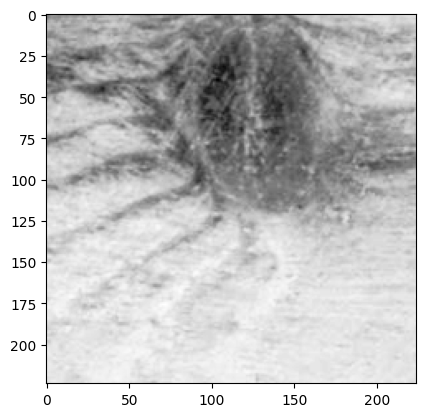

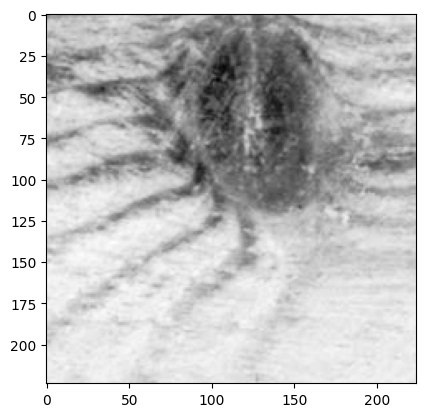

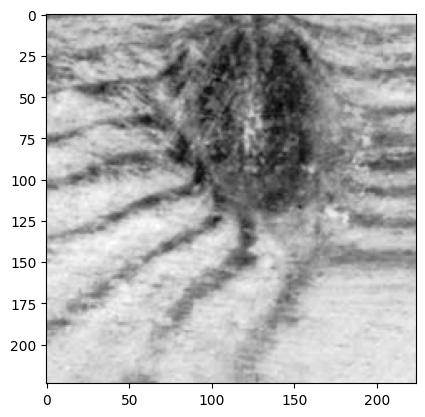

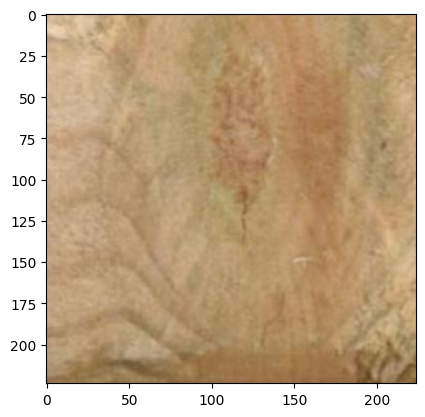

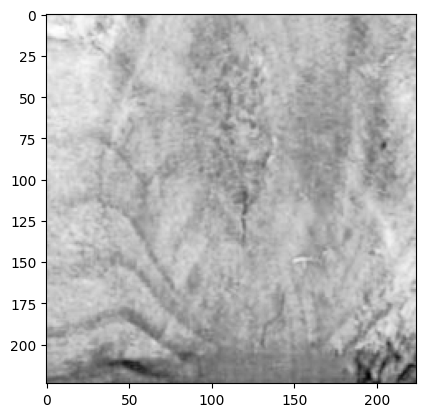

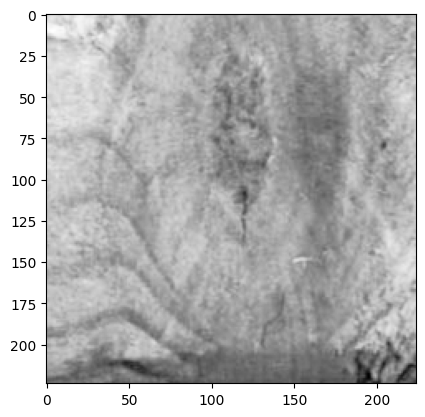

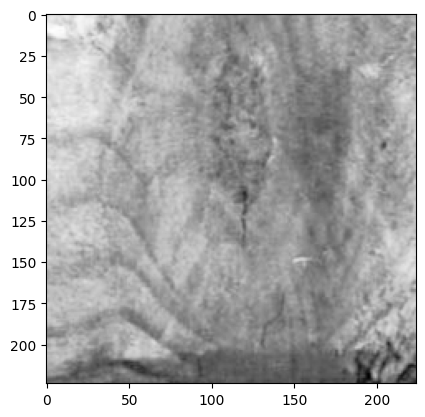

x_train_224: (1440, 224, 224, 3)
y_train: (1440, 1, 1, 4)
x_test_224: (1440, 224, 224, 3)
y_test: (1440, 1, 1, 4)


'Thu Jan 29 11:34:43 2026'

In [46]:
# data load(4 classes 1440p)
Path = 'D:/pythonworkspace/'
x_train_224 = np.load(Path + 'x_train_224_4classes_1440p.npy') # 
y_train = np.load(Path + 'y_train_4classes_1440p.npy') # 
x_test_224 = np.load(Path + 'x_test_224_4classes_1440p.npy') # 
y_test = np.load(Path + 'y_test_4classes_1440p.npy') # 
print('loading complete')
n = 1070
plt.imshow(x_train_224[n, :, :, 0], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_train_224[n, :, :, 1], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_train_224[n, :, :, 2], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_224[n], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_224[n, :, :, 0], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_224[n, :, :, 1], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_224[n, :, :, 2], cmap = 'Greys_r') # sample image display
plt.show()
print('x_train_224:', x_train_224.shape)
print('y_train:', y_train.shape)
print('x_test_224:', x_test_224.shape)
print('y_test:', y_test.shape)
matplotlib.image.imsave('live4.jpg', x_train_224[762, :, :, :])
time.asctime()

x_test_224: (1440, 224, 224, 3)
x_test_224new: (240, 224, 224, 3)
y_testnew: (240, 1, 1, 4)
i: 1


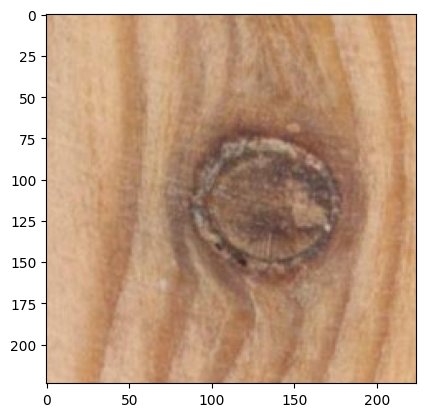

i: 2


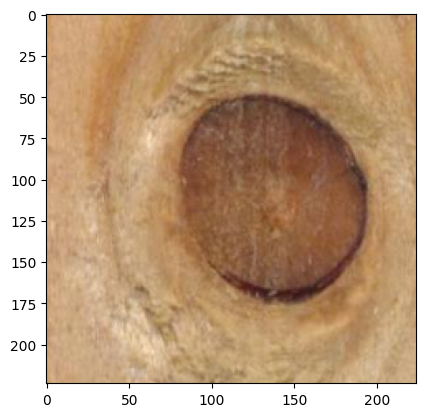

i: 3


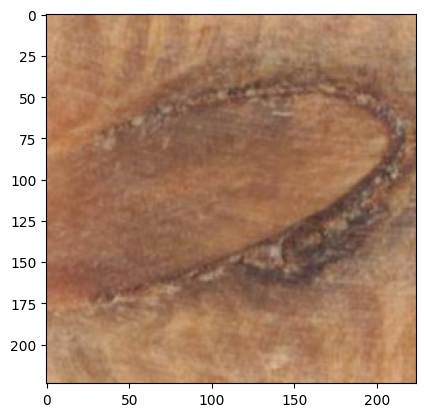

i: 4


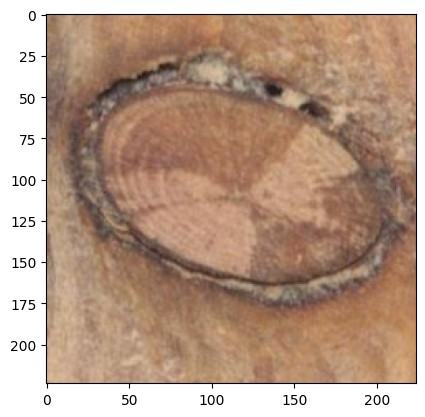

i: 5


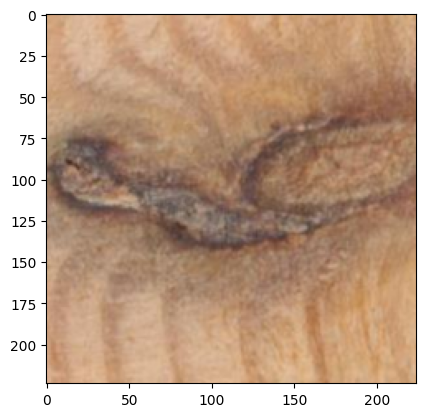

i: 6


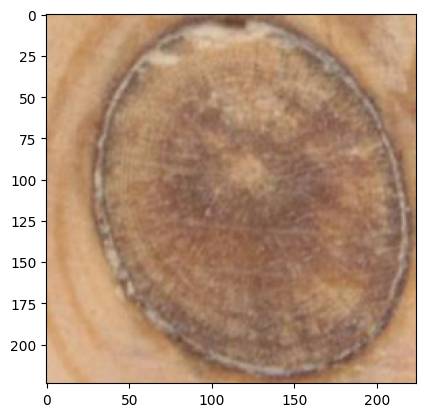

i: 7


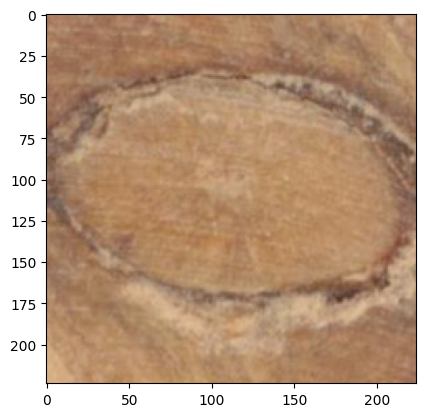

i: 8


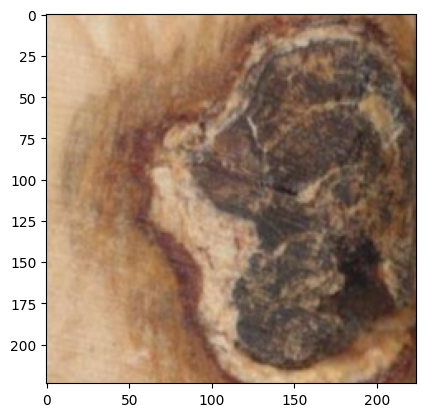

i: 9


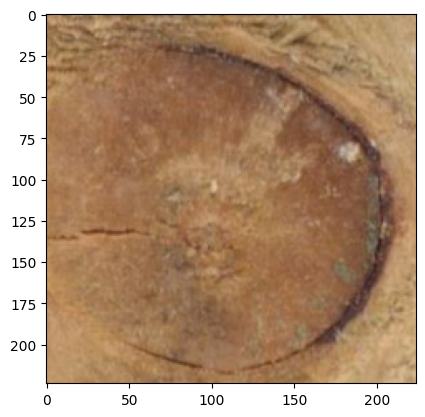

i: 10


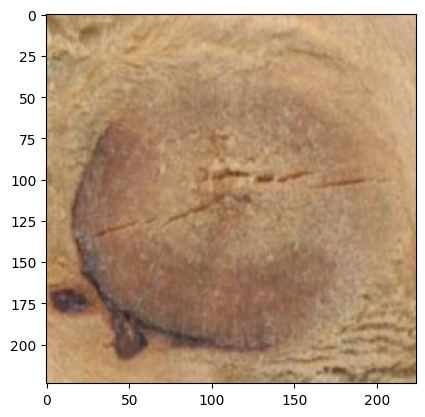

i: 11


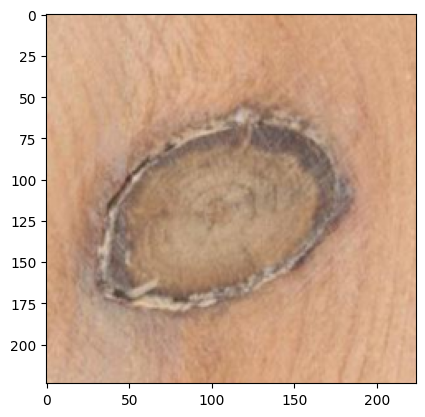

i: 12


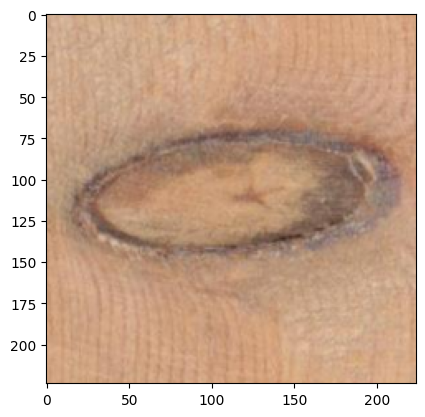

i: 13


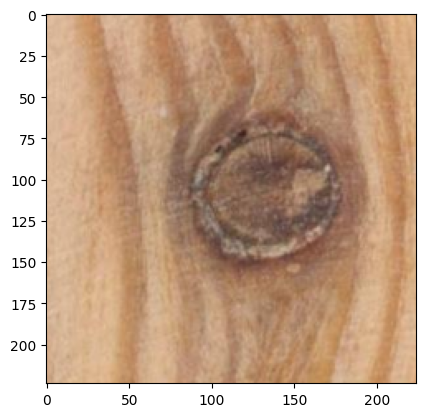

i: 14


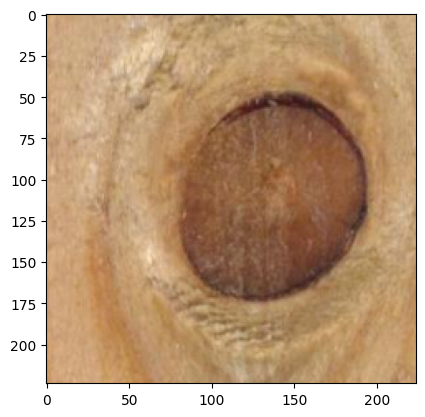

i: 15


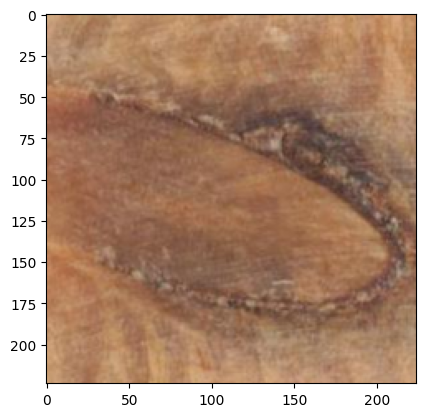

i: 16


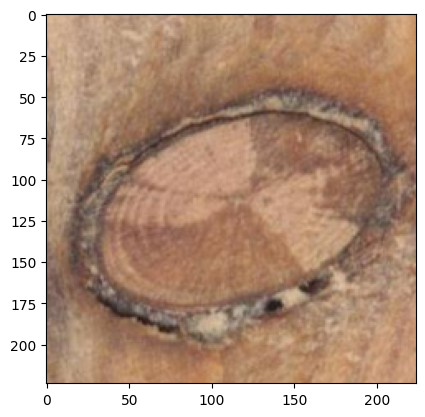

i: 17


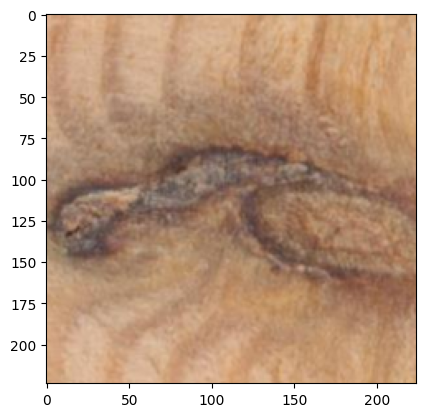

i: 18


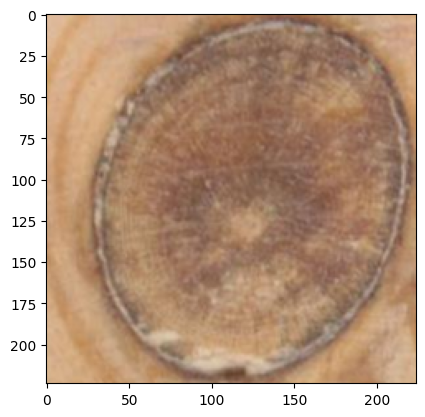

i: 19


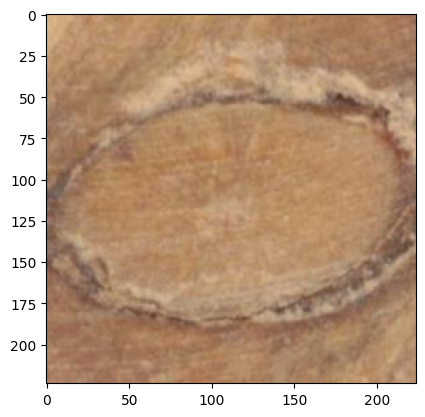

i: 20


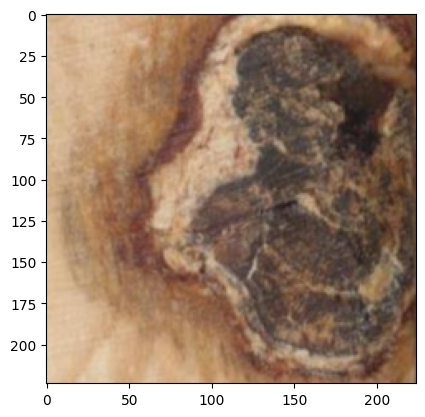

In [61]:
ind = np.arange(0, 1440, 6)
x_test_224new = x_test_224[ind]
y_testnew = y_test[ind]

print('x_test_224:', x_test_224.shape)
print('x_test_224new:', x_test_224new.shape)
print('y_testnew:', y_testnew.shape)
for i in range(20):
    print('i:', i + 1)
    t = x_test_224new[i]
    plt.imshow(t, cmap = 'Greys_r') # sample image display
    plt.show()

loading complete


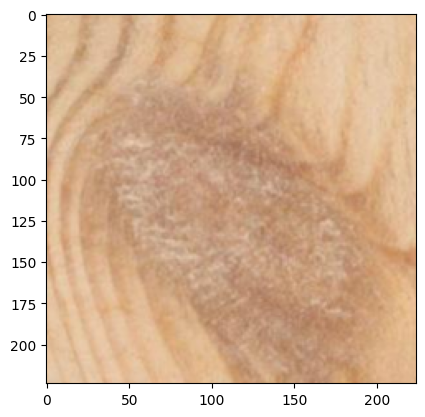

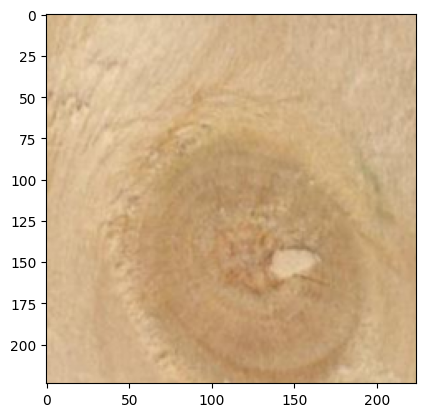

x_train_224: (1920, 224, 224, 3)
y_train: (1920, 1, 1, 4)
x_test_224: (1920, 224, 224, 3)
y_test: (1920, 1, 1, 4)


'Fri Jun  6 16:30:14 2025'

In [2]:
# data load(4 classes 1920p)
Path = 'D:/pythonworkspace/'
x_train_224 = np.load(Path + 'x_train_224_4classes_1920p.npy') # 
y_train = np.load(Path + 'y_train_4classes_1920p.npy') # 
x_test_224 = np.load(Path + 'x_test_224_4classes_1920p.npy') # 
y_test = np.load(Path + 'y_test_4classes_1920p.npy') # 
print('loading complete')
n = 1070
plt.imshow(x_train_224[n], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_224[n], cmap = 'Greys_r') # sample image display
plt.show()
print('x_train_224:', x_train_224.shape)
print('y_train:', y_train.shape)
print('x_test_224:', x_test_224.shape)
print('y_test:', y_test.shape)
time.asctime()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


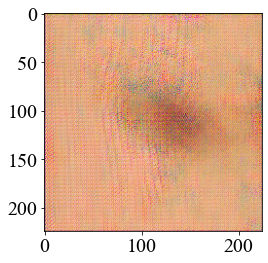

x_train_224: (360, 224, 224, 3)


In [101]:
# data load(Simulation)
Path = 'E:/pythonworkspace/image generation/'
x_train_1 = np.load(Path + 'samples11_224x224.npy') # 
x_train_2 = np.load(Path + 'samples7_224x224.npy') # 
x_train_3 = np.load(Path + 'samples6_224x224.npy') # 
x_train_4 = np.load(Path + 'samples12_224x224.npy') # 
x_train_224 = np.concatenate((x_train_1[0:90], x_train_2[0:90], x_train_3[0:90], x_train_4[0:90]), 0)
plt.imshow(x_train_224[120], cmap = 'Greys_r') # sample image display
plt.show()
print('x_train_224:', x_train_224.shape)

(1440, 56, 56, 3)


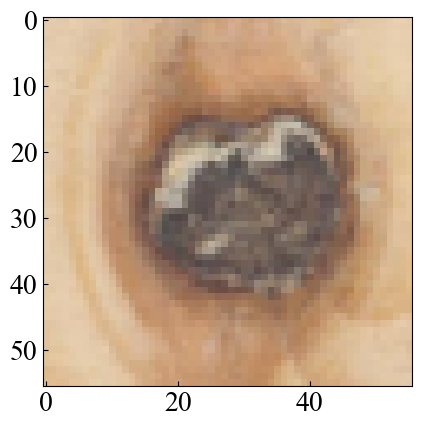

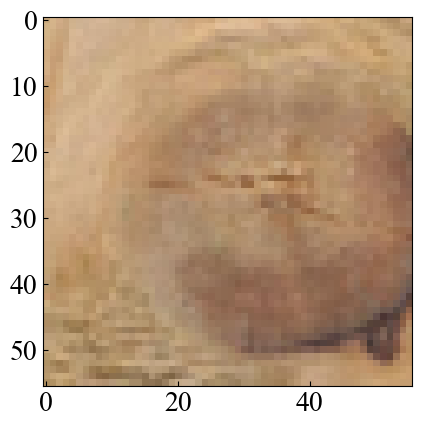

In [77]:
def Resize(x, S):
# used for batch of images resizing
# x—images
# S—size needed
    n = x.shape[0]
    for i in range(n):
        I = x[i]
        I2 = Image.fromarray((I * 255).astype('uint8'))
        I3 = I2.resize(S)
        I4 = np.array(I3, dtype = float32) / 255
        I5 = np.reshape(I4, [1, S[0], -1, 3])
        if i == 0:
            r = I5
        if i > 0:
            r = np.concatenate((r, I5), 0)
    y = r
    return y
x_train_56 = Resize(x_train_224, [56, 56])
x_test_56 = Resize(x_test_224, [56, 56])
print(x_train_56.shape)
plt.imshow(x_train_56[0], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_56[200], cmap = 'Greys_r') # sample image display
plt.show()

val: (2016, 224, 224, 3)
val2: (504, 224, 224, 3)
number: 2016
X_dim: 3
Y_dim: 7


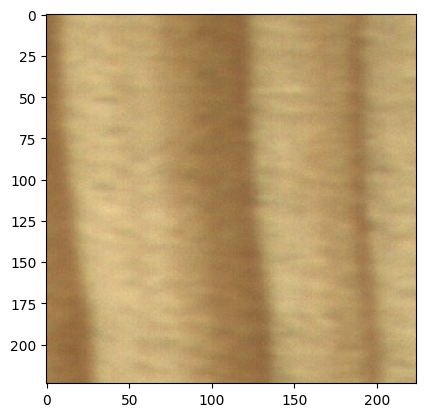

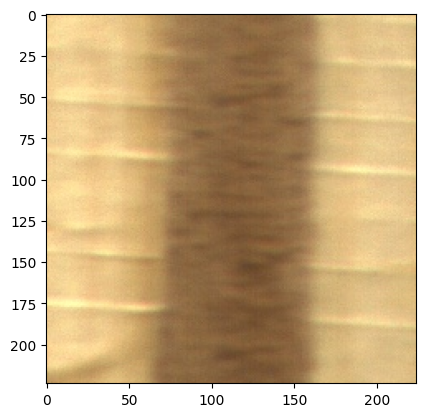

'Sat Feb 14 10:03:51 2026'

In [3]:
n = 30
x_train = x_train_224
x_test = x_test_224
val = x_train.shape
X_dim = val[3]
Y_dim = y_train.shape[3]
print('val:', val)
print('val2:', x_test.shape)
print('number:', val[0])
print('X_dim:', X_dim)
print('Y_dim:', Y_dim)
plt.imshow(x_train_224[n * 5], cmap = 'Greys_r') # sample image display
plt.show()
plt.imshow(x_test_224[n], cmap = 'Greys_r') # sample image display
plt.show()
time.asctime()

In [5]:
##### Variables create (VGG-16) ######## 2024.04.11
X = tf.placeholder(tf.float32, shape = [None, val[1], val[2], X_dim], name = 'X')
print(X)
Y = tf.placeholder(tf.float32, shape = [None, 1, 1, Y_dim], name = 'Y') # Y
print(Y)
keep_prob = tf.placeholder(tf.float32, name = 'keep_prob')
print(keep_prob)
c1 = 3
c2 = 7
deep1 = 32
deep2 = int(deep1 * 2)
deep3 = int(deep2 * 2)
deep4 = int(deep3 * 2)
deep5 = int(deep4 * 2)
deep6 = int(deep5 * 2)
eps = 1e-7
print('deep1', deep1)
print('deep4', deep4)

lp = np.zeros(16)
fp = np.zeros(16)
## network construction ##
## Discriminator ##
print('Discriminator layer 1:')
t, lp[0], f = convolutional_single(X_dim, deep1, 3, 3) # 224
D1 = t
fp[0] = f * 224**2
print(len(D1))
print('Discriminator layer 2:')
t, lp[1], f = convolutional_single(deep1, deep1, 3, 3) # 224
D2 = t
fp[1] = f * 224**2
print(len(D2))
print('Pooling layer 1:')

print('Discriminator layer 3:')
t, lp[2], f = convolutional_single(deep1, deep2, 3, 3) # 112
D3 = t
fp[2] = f * 112**2
print(len(D3))
print('Discriminator layer 4:')
t, lp[3], f = convolutional_single(deep2, deep2, 3, 3) # 112
D4 = t
fp[3] = f * 112**2
print(len(D4))
print('Discriminator layer 5:')
t, lp[4], f = convolutional_single(deep2, deep3, 3, 3) # 56
D5 = t
fp[4] = f * 56**2
print(len(D5))
print('Discriminator layer 6:')
t, lp[5], f = convolutional_single(deep3, deep3, 3, 3) # 56
D6 = t
fp[5] = f * 56**2
print(len(D6))
print('Discriminator layer 7:')
t, lp[6], f = convolutional_single(deep3, deep3, 3, 3) # 56
D7 = t
fp[6] = f * 56**2
print(len(D7))
print('Discriminator layer 8:')
t, lp[7], f = convolutional_single(deep3, deep4, 3, 3) # 28
D8 = t
fp[7] = f * 28**2
print(len(D8))
print('Discriminator layer 9:')
t, lp[8], f = convolutional_single(deep4, deep4, 3, 3) # 28
D9 = t
fp[8] = f * 28**2
print(len(D9))
print('Discriminator layer 10:')
t, lp[9], f = convolutional_single(deep4, deep4, 3, 3) # 28
D10 = t
fp[9] = f * 28**2
print(len(D10))
print('Discriminator layer 11:')
t, lp[10], f = convolutional_single(deep4, deep4, 3, 3) # 14
D11 = t
fp[10] = f * 14**2
print(len(D11))
print('Discriminator layer 12:')
t, lp[11], f = convolutional_single(deep4, deep4, 3, 3) # 14
D12 = t
fp[11] = f * 14**2
print(len(D12))
print('Discriminator layer 13:')
t, lp[12], f = convolutional_single(deep4, deep4, 3, 3) # 14
D13 = t
fp[12] = f * 14**2
print(len(D13))
print('Discriminator layer 14:')
t, lp[13], f = convolutional_single(deep4, 4096, 7, 7) # 1
D14 = t
fp[13] = f * 1**2
print(len(D14))
print('Discriminator layer 15:')
t, lp[14], f = convolutional_single(4096, 4096, 1, 1) # 1
D15 = t
fp[14] = f * 1**2
print(len(D15))
print('Discriminator layer 16:')
t, lp[15], f = convolutional_single(4096, Y_dim, 1, 1) # 1
D16 = t
fp[15] = f * 1**2
print(len(D16))

update = D1 + D2 + D3 + D4 + D5 + D6 + D7 + D8 + D9 + D10 + D11 + D12 + D13 + D14 + D15 + D16
print('total varibles:', len(update))
print('total parameters(MB):', np.sum(lp) / 1000**2)
print('FLOPs(MB):', np.sum(fp) / 10**6)
print('val', val)
time.asctime()

Tensor("X:0", shape=(None, 224, 224, 3), dtype=float32)
Tensor("Y:0", shape=(None, 1, 1, 4), dtype=float32)
Tensor("keep_prob:0", dtype=float32)
deep1 32
deep4 256
Discriminator layer 1:
convolutional unit data: 864
1
Discriminator layer 2:
convolutional unit data: 9216
1
Pooling layer 1:
Discriminator layer 3:
convolutional unit data: 18432
1
Discriminator layer 4:
convolutional unit data: 36864
1
Discriminator layer 5:
convolutional unit data: 73728
1
Discriminator layer 6:
convolutional unit data: 147456
1
Discriminator layer 7:
convolutional unit data: 147456
1
Discriminator layer 8:
convolutional unit data: 294912
1
Discriminator layer 9:
convolutional unit data: 589824
1
Discriminator layer 10:
convolutional unit data: 589824
1
Discriminator layer 11:
convolutional unit data: 589824
1
Discriminator layer 12:
convolutional unit data: 589824
1
Discriminator layer 13:
convolutional unit data: 589824
1
Discriminator layer 14:
convolutional unit data: 51380224
1
Discriminator layer 15

'Sun Jan  5 12:06:06 2025'

In [66]:
##### Variables create (VGG-16) shorten ######## 2024.07.16 
X = tf.placeholder(tf.float32, shape = [None, val[1], val[2], X_dim], name = 'X')
print(X)
Y = tf.placeholder(tf.float32, shape = [None, 1, 1, Y_dim], name = 'Y') # Y
print(Y)
keep_prob = tf.placeholder(tf.float32, name = 'keep_prob')
print(keep_prob)
c1 = 3
c2 = 7
deep1 = 16
deep2 = int(deep1 * 2)
deep3 = int(deep2 * 2)
deep4 = int(deep3 * 2)
deep5 = int(deep4 * 2)
deep6 = int(deep5 * 2)
eps = 1e-7
print('deep1', deep1)
print('deep4', deep4)

lp = np.zeros(13)
fp = np.zeros(13)
## network construction ##
## Discriminator ##
print('Discriminator layer 1:')
t, lp[0], f = convolutional_single(X_dim, deep1, 3, 3) # 112
D1 = t
fp[0] = f * 112**2
print(len(D1))
print('Discriminator layer 2:')
t, lp[1], f = convolutional_single(deep1, deep2, 3, 3) # 56
D2 = t
fp[1] = f * 56**2
print(len(D2))
print('Discriminator layer 3:')
t, lp[2], f = convolutional_single(deep2, deep3, 3, 3) # 28
D3 = t
fp[2] = f * 28**2
print(len(D3))
print('Discriminator layer 4:')
t, lp[3], f = convolutional_single(deep3, deep4, 3, 3) # 14
D4 = t
fp[3] = f * 14**2
print(len(D4))
print('Discriminator layer 5:')
t, lp[4], f = convolutional_single(deep4, deep5, 7, 7) # 1
D5 = t
fp[4] = f * 1**2
print(len(D5))
print('Discriminator layer 6:')
t, lp[5], f = convolutional_single(deep5, deep5, 1, 1) # 1
D6 = t
fp[5] = f * 1**2
print(len(D6))
print('Discriminator layer 7:')
t, lp[6], f = convolutional_single(deep5, Y_dim, 1, 1) # 1
D7 = t
fp[6] = f * 1**2
print(len(D7))

cons = 0.1
n = 5
print('Discriminator parameter 8:')
#t, lp[7], f = cons_single(n, deep1, 112, 112)
t, lp[7], f = cons_single(n, deep1, 1, 1, cons)
D8 = t
fp[7] = f
print(len(D8))
print('Discriminator parameter 9:')
t, lp[8], f = cons_single(n, deep2, 1, 1, cons)
D9 = t
fp[8] = f
print(len(D9))
print('Discriminator parameter 10:')
t, lp[9], f = cons_single(n, deep3, 1, 1, cons)
D10 = t
fp[9] = f
print(len(D10))
print('Discriminator parameter 11:')
t, lp[10], f = cons_single(n, deep4, 1, 1, cons)
D11 = t
fp[10] = f
print(len(D11))
print('Discriminator parameter 12:')
t, lp[11], f = cons_single(n, deep5, 1, 1, cons)
D12 = t
fp[11] = f
print(len(D12))
print('Discriminator parameter 13:')
t, lp[12], f = cons_single(n, deep5, 1, 1, cons)
D13 = t
fp[12] = f
print(len(D13))
update = D1 + D2 + D3 + D4 + D5 + D6 + D7 + D8 + D9 + D10 + D11 + D12 + D13
update1 = D1 + D2 + D3 + D4 + D5 + D6 + D7
update2 = D8 + D9 + D10 + D11 + D12 + D13
#update = D1 + D2 + D3 + D4 + D5 + D6 + D7 + D8
print('total varibles:', len(update))
print('total parameters(MB):', np.sum(lp) / 1000**2)
print('FLOPs(MB):', np.sum(fp) / 10**6)
print('val', val)
time.asctime()

Tensor("X_20:0", shape=(None, 224, 224, 3), dtype=float32)
Tensor("Y_107:0", shape=(None, 1, 1, 4), dtype=float32)
Tensor("keep_prob_2:0", dtype=float32)
deep1 16
deep4 128
Discriminator layer 1:
convolutional unit data: 432
1
Discriminator layer 2:
convolutional unit data: 4608
1
Discriminator layer 3:
convolutional unit data: 18432
1
Discriminator layer 4:
convolutional unit data: 73728
1
Discriminator layer 5:
convolutional unit data: 1605632
1
Discriminator layer 6:
convolutional unit data: 65536
1
Discriminator layer 7:
convolutional unit data: 1024
1
Discriminator parameter 8:
convolutional unit data: 80
1
Discriminator parameter 9:
convolutional unit data: 160
1
Discriminator parameter 10:
convolutional unit data: 320
1
Discriminator parameter 11:
convolutional unit data: 640
1
Discriminator parameter 12:
convolutional unit data: 1280
1
Discriminator parameter 13:
convolutional unit data: 1280
1
total varibles: 13
total parameters(MB): 1.773152
FLOPs(MB): 100.513452
val (360, 22

'Tue Dec 31 12:23:24 2024'

In [5]:
##### Variables create (VGG-16) shorten2 ######## 2025.01.03
X = tf.placeholder(tf.float32, shape = [None, val[1], val[2], X_dim], name = 'X')
print(X)
Y = tf.placeholder(tf.float32, shape = [None, 1, 1, Y_dim], name = 'Y') # Y
print(Y)
keep_prob = tf.placeholder(tf.float32, name = 'keep_prob')
print(keep_prob)
c1 = 3
c2 = 7
deep1 = 32
deep2 = int(deep1 * 2)
deep3 = int(deep2 * 2)
deep4 = int(deep3 * 2)
deep5 = int(deep4 * 2)
deep6 = int(deep5 * 2)
eps = 1e-7
print('deep1', deep1)
print('deep4', deep4)

lp = np.zeros(13)
fp = np.zeros(13)
## network construction ##
## Discriminator ##
print('Discriminator layer 1:')
t, lp[0], f = convolutional_single(X_dim, deep1, 3, 3) # 112
D1 = t
fp[0] = f * 112**2
print(len(D1))
print('Discriminator layer 2:')
t, lp[1], f = convolutional_single(deep1, deep2, 3, 3) # 56
D2 = t
fp[1] = f * 56**2
print(len(D2))
print('Discriminator layer 3:')
t, lp[2], f = convolutional_single(deep2, deep3, 3, 3) # 28
D3 = t
fp[2] = f * 28**2
print(len(D3))
print('Discriminator layer 4:')
t, lp[3], f = convolutional_single(deep3, deep4, 3, 3) # 14
D4 = t
fp[3] = f * 14**2
print(len(D4))
print('Discriminator layer 5:')
t, lp[4], f = convolutional_single(deep4, deep5, 7, 7) # 1
D5 = t
fp[4] = f * 1**2
print(len(D5))
print('Discriminator layer 6:')
t, lp[5], f = convolutional_single(deep5, deep5, 1, 1) # 1
D6 = t
fp[5] = f * 1**2
print(len(D6))
print('Discriminator layer 7:')
t, lp[6], f = convolutional_single(deep5, Y_dim, 1, 1) # 1
D7 = t
fp[6] = f * 1**2
print(len(D7))

cons = 0.01
n = 5
print('Discriminator parameter 8:')
t, lp[7], f = cons_single2(n, deep1, 1, 1, cons)
D8 = t
fp[7] = f
print(len(D8))
print('Discriminator parameter 9:')
t, lp[8], f = cons_single2(n, deep2, 1, 1, cons)
D9 = t
fp[8] = f
print(len(D9))
print('Discriminator parameter 10:')
t, lp[9], f = cons_single2(n, deep3, 1, 1, cons)
D10 = t
fp[9] = f
print(len(D10))
print('Discriminator parameter 11:')
t, lp[10], f = cons_single2(n, deep4, 1, 1, cons)
D11 = t
fp[10] = f
print(len(D11))
print('Discriminator parameter 12:')
t, lp[11], f = cons_single2(n, deep5, 1, 1, cons)
D12 = t
fp[11] = f
print(len(D12))
print('Discriminator parameter 13:')
t, lp[12], f = cons_single2(n, deep5, 1, 1, cons)
D13 = t
fp[12] = f
print(len(D13))
update = D1 + D2 + D3 + D4 + D5 + D6 + D7 + D8 + D9 + D10 + D11 + D12 + D13
update1 = D1 + D2 + D3 + D4 + D5 + D6 + D7
update2 = D8 + D9 + D10 + D11 + D12 + D13
#update = D1 + D2 + D3 + D4 + D5 + D6 + D7 + D8
print('total varibles:', len(update))
print('total parameters(MB):', np.sum(lp) / 1000**2)
print('FLOPs(MB):', np.sum(fp) / 10**6)
print('val', val)
time.asctime()

Tensor("X:0", shape=(None, 224, 224, 3), dtype=float32)
Tensor("Y:0", shape=(None, 1, 1, 4), dtype=float32)
Tensor("keep_prob:0", dtype=float32)
deep1 64
deep4 512
Discriminator layer 1:
convolutional unit data: 1728
1
Discriminator layer 2:
convolutional unit data: 73728
1
Discriminator layer 3:
convolutional unit data: 294912
1
Discriminator layer 4:
convolutional unit data: 1179648
1
Discriminator layer 5:
convolutional unit data: 25690112
1
Discriminator layer 6:
convolutional unit data: 1048576
1
Discriminator layer 7:
convolutional unit data: 4096
1
Discriminator parameter 8:
convolutional unit data: 320
5
Discriminator parameter 9:
convolutional unit data: 640
5
Discriminator parameter 10:
convolutional unit data: 1280
5
Discriminator parameter 11:
convolutional unit data: 2560
5
Discriminator parameter 12:
convolutional unit data: 5120
5
Discriminator parameter 13:
convolutional unit data: 5120
5
total varibles: 37
total parameters(MB): 28.30784
FLOPs(MB): 1482.611388
val (360,

'Thu Jan  9 22:28:44 2025'

In [20]:
##### Variables create scaled network ######## 2024.07.16 
tf.reset_default_graph()
X = tf.placeholder(tf.float32, shape = [None, val[1], val[2], X_dim], name = 'X')
print(X)
Y = tf.placeholder(tf.float32, shape = [None, 1, 1, Y_dim], name = 'Y') # Y
print(Y)
keep_prob = tf.placeholder(tf.float32, name = 'keep_prob')
print(keep_prob)
c1 = 3
c2 = 7
deep1 = 16
deep2 = int(deep1 * 2)
deep3 = int(deep2 * 2)
deep4 = int(deep3 * 2)
deep5 = int(deep4 * 2)
deep6 = int(deep5 * 2)
deep7 = int(deep6 * 2)
eps = 1e-5
print('deep1', deep1)
print('deep4', deep4)

lp = np.zeros(21)
fp = np.zeros(21)
## network construction ##
## Discriminator ##
print('Discriminator layer 1:')
t, lp[0], f = convolutional_single(X_dim, deep1, c1, c1) # 112
D1 = t
fp[0] = f * 112**2
print(len(D1))
print('Discriminator layer 1_2:')
t, lp[1], f = convolutional_single(deep1, deep1, c1, c1) # 112
D1_2 = t
fp[1] = f * 112**2
print(len(D1_2))
print('Discriminator layer 2:')
t, lp[2], f = convolutional_single(deep1, deep2, c1, c1) # 56
D2 = t
fp[2] = f * 56**2
print(len(D2))
print('Discriminator layer 2_2:')
t, lp[3], f = convolutional_single(deep2, deep2, c1, c1) # 56
D2_2 = t
fp[3] = f * 56**2
print(len(D2_2))
print('Discriminator layer 3:')
t, lp[4], f = convolutional_single(deep2, deep3, c1, c1) # 28
D3 = t
fp[4] = f * 28**2
print(len(D3))
print('Discriminator layer 3_2:')
t, lp[5], f = convolutional_single(deep3, deep3, c1, c1) # 28
D3_2 = t
fp[5] = f * 28**2
print(len(D3_2))
print('Discriminator layer 4:')
t, lp[6], f = convolutional_single(deep3, deep4, c1, c1) # 14
D4 = t
fp[6] = f * 14**2
print(len(D4))
print('Discriminator layer 4_2:')
t, lp[7], f = convolutional_single(deep4, deep4, c1, c1) # 14
D4_2 = t
fp[7] = f * 14**2
print(len(D4_2))
########
## FC ##
print('Discriminator layer 5:')
t, lp[8], f = convolutional_single(deep4, deep4, 7, 7) # 1
D5 = t
fp[8] = f * 1**2
print(len(D5))
print('Discriminator layer 6:')
t, lp[9], f = convolutional_single(deep4, deep4, 1, 1) # 1
D6 = t
fp[9] = f * 1**2
print(len(D6))
print('Discriminator layer 7:')
t, lp[10], f = convolutional_single(deep4, Y_dim, 1, 1) # 1
D7 = t
fp[10] = f * 1**2
print(len(D7))

cons = 1e-2
n = 0
print('Discriminator parameter 8:')
#t, lp[11], f = cons_single2(n, 1, 1, 1, cons) # on feature map
t, lp[11], f = cons_single2(n, deep1, 1, 1, cons) # on channel
#t, lp[11], f = cons_single2(n, deep1, 112, 112, cons) # on node
D8 = t
fp[11] = f * 112**2
print(len(D8))
print('Discriminator parameter 8_2:')
#t, lp[12], f = cons_single2(n, 1, 1, 1, cons) # on feature map
t, lp[12], f = cons_single2(n, deep1, 1, 1, cons) # on feature map
#t, lp[12], f = cons_single2(n, deep1, 112, 112, cons) # on node
D8_2 = t
fp[12] = f * 112**2
print(len(D8_2))
print('Discriminator parameter 9:')
#t, lp[13], f = cons_single2(n, 1, 1, 1, cons)
t, lp[13], f = cons_single2(n, deep2, 1, 1, cons)
#t, lp[13], f = cons_single2(n, deep2, 56, 56, cons)
D9 = t
fp[13] = f * 56**2
print(len(D9))
print('Discriminator parameter 9_2:')
#t, lp[14], f = cons_single2(n, 1, 1, 1, cons)
t, lp[14], f = cons_single2(n, deep2, 1, 1, cons)
#t, lp[14], f = cons_single2(n, deep2, 56, 56, cons)
D9_2 = t
fp[14] = f * 56**2
print(len(D9_2))
print('Discriminator parameter 10:')
#t, lp[15], f = cons_single2(n, 1, 1, 1, cons)
t, lp[15], f = cons_single2(n, deep3, 1, 1, cons)
#t, lp[15], f = cons_single2(n, deep3, 28, 28, cons)
D10 = t
fp[15] = f * 28**2
print(len(D10))
print('Discriminator parameter 10_2:')
#t, lp[16], f = cons_single2(n, 1, 1, 1, cons)
t, lp[16], f = cons_single2(n, deep3, 1, 1, cons)
#t, lp[16], f = cons_single2(n, deep3, 28, 28, cons)
D10_2 = t
fp[16] = f * 28**2
print(len(D10_2))
print('Discriminator parameter 11:')
#t, lp[17], f = cons_single2(n, 1, 1, 1, cons)
t, lp[17], f = cons_single2(n, deep4, 1, 1, cons)
#t, lp[17], f = cons_single2(n, deep4, 14, 14, cons)
D11 = t
fp[17] = f * 14**2
print(len(D11))
print('Discriminator parameter 11_2:')
#t, lp[18], f = cons_single2(n, deep1, 1, 1, cons)
t, lp[18], f = cons_single2(n, deep4, 1, 1, cons)
#t, lp[18], f = cons_single2(n, deep4, 14, 14, cons)
D11_2 = t
fp[18] = f * 14**2
print(len(D11_2))
print('Discriminator parameter 12:')
#t, lp[19], f = cons_single2(n, 1, 1, 1, cons)
t, lp[19], f = cons_single2(n, deep4, 1, 1, cons)
D12 = t
fp[19] = f * 1**2
print(len(D12))
print('Discriminator parameter 13:')
#t, lp[20], f = cons_single2(n, 1, 1, 1, cons)
t, lp[20], f = cons_single2(n, deep4, 1, 1, cons)
D13 = t
fp[20] = f * 1**2
print(len(D13))
update = D1 + D1_2 + D2 + D2_2 + D3 + D3_2 + D4 + D4_2 + D5 + D6 + D7 + D8 + D8_2 + D9 + D9_2 + D10 + D10_2 + D11 + D11_2 + D12 + D13
#update = D1 + D2 + D3 + D4 + D5 + D6 + D7 + D8
print('total varibles:', len(update))
print('total parameters(MB):', np.sum(lp) / 1000**2)
print('FLOPs(MB):', np.sum(fp) / 10**6)
print('val', val)
time.asctime()

Tensor("X:0", shape=(None, 224, 224, 3), dtype=float32)
Tensor("Y:0", shape=(None, 1, 1, 4), dtype=float32)
Tensor("keep_prob:0", dtype=float32)
deep1 16
deep4 128
Discriminator layer 1:
convolutional unit data: 432
1
Discriminator layer 1_2:
convolutional unit data: 2304
1
Discriminator layer 2:
convolutional unit data: 4608
1
Discriminator layer 2_2:
convolutional unit data: 9216
1
Discriminator layer 3:
convolutional unit data: 18432
1
Discriminator layer 3_2:
convolutional unit data: 36864
1
Discriminator layer 4:
convolutional unit data: 73728
1
Discriminator layer 4_2:
convolutional unit data: 147456
1
Discriminator layer 5:
convolutional unit data: 802816
1
Discriminator layer 6:
convolutional unit data: 16384
1
Discriminator layer 7:
convolutional unit data: 512
1
Discriminator parameter 8:
convolutional unit data: 0
1
Discriminator parameter 8_2:
convolutional unit data: 0
1
Discriminator parameter 9:
convolutional unit data: 0
1
Discriminator parameter 9_2:
convolutional unit

'Sat Sep 13 20:47:26 2025'

In [22]:
##### Variables create scaled network 2 ######## 2025.06.17
tf.reset_default_graph()
X = tf.placeholder(tf.float32, shape = [None, val[1], val[2], X_dim], name = 'X')
print(X)
Y = tf.placeholder(tf.float32, shape = [None, 1, 1, Y_dim], name = 'Y') # Y
print(Y)
keep_prob = tf.placeholder(tf.float32, name = 'keep_prob')
print(keep_prob)
c1 = 3
c2 = 7
deep1 = 16
deep2 = int(deep1 * 2)
deep3 = int(deep2 * 2)
deep4 = int(deep3 * 2)
deep5 = int(deep4 * 2)
deep6 = int(deep5 * 2)
deep7 = int(deep6 * 2)
eps = 1e-5
print('deep1', deep1)
print('deep4', deep4)

lp = np.zeros(21)
fp = np.zeros(21)
## network construction ##
## Discriminator ##
print('Discriminator layer 1:')
t, lp[0], f = convolutional_single(X_dim, deep1, c1, c1) # 112
D1 = t
fp[0] = f * 112**2
print(len(D1))
print('Discriminator layer 1_2:')
t, lp[1], f = convolutional_single(deep1, deep1, c1, c1) # 112
D1_2 = t
lp[1] = 0
fp[1] = f * 112**2
print(len(D1_2))
print('Discriminator layer 2:')
t, lp[2], f = convolutional_single(deep1, deep2, c1, c1) # 56
D2 = t
fp[2] = f * 56**2
print(len(D2))
print('Discriminator layer 2_2:')
t, lp[3], f = convolutional_single(deep2, deep2, c1, c1) # 56
D2_2 = t
lp[3] = 0
fp[3] = f * 56**2
print(len(D2_2))
print('Discriminator layer 3:')
t, lp[4], f = convolutional_single(deep2, deep3, c1, c1) # 28
D3 = t
fp[4] = f * 28**2
print(len(D3))
print('Discriminator layer 3_2:')
t, lp[5], f = convolutional_single(deep3, deep3, c1, c1) # 28
D3_2 = t
#lp[5] = 0
fp[5] = f * 28**2
print(len(D3_2))
print('Discriminator layer 4:')
t, lp[6], f = convolutional_single(deep3, deep4, c1, c1) # 14
D4 = t
fp[6] = f * 14**2
print(len(D4))
print('Discriminator layer 4_2:')
t, lp[7], f = convolutional_single(deep4, deep4, c1, c1) # 14
D4_2 = t
#lp[7] = 0
fp[7] = f * 14**2
print(len(D4_2))
########
## FC ##
print('Discriminator layer 5:')
t, lp[8], f = convolutional_single(deep4, deep4, 7, 7) # 1
D5 = t
fp[8] = f * 1**2
print(len(D5))
print('Discriminator layer 6:')
t, lp[9], f = convolutional_single(deep4, deep4, 1, 1) # 1
D6 = t
fp[9] = f * 1**2
print(len(D6))
print('Discriminator layer 7:')
t, lp[10], f = convolutional_single(deep4, Y_dim, 1, 1) # 1
D7 = t
fp[10] = f * 1**2
print(len(D7))

cons = 1e-2
n = 0
print('Discriminator parameter 8:')
#t, lp[11], f = cons_single2(n, 1, 1, 1, cons) # on feature map
t, lp[11], f = cons_single2(n, deep1, 1, 1, cons) # on channel
#t, lp[11], f = cons_single2(n, deep1, 112, 112, cons) # on node
D8 = t
fp[11] = f * 112**2
print(len(D8))
print('Discriminator parameter 8_2:')
#t, lp[12], f = cons_single2(n, 1, 1, 1, cons) # on feature map
t, lp[12], f = cons_single2(n, deep1, 1, 1, cons) # on feature map
#t, lp[12], f = cons_single2(n, deep1, 112, 112, cons) # on node
D8_2 = t
lp[12] = 0
fp[12] = f * 112**2
print(len(D8_2))
print('Discriminator parameter 9:')
#t, lp[13], f = cons_single2(n, 1, 1, 1, cons)
t, lp[13], f = cons_single2(n, deep2, 1, 1, cons)
#t, lp[13], f = cons_single2(n, deep2, 56, 56, cons)
D9 = t
fp[13] = f * 56**2
print(len(D9))
print('Discriminator parameter 9_2:')
#t, lp[14], f = cons_single2(n, 1, 1, 1, cons)
t, lp[14], f = cons_single2(n, deep2, 1, 1, cons)
#t, lp[14], f = cons_single2(n, deep2, 56, 56, cons)
D9_2 = t
lp[14] = 0
fp[14] = f * 56**2
print(len(D9_2))
print('Discriminator parameter 10:')
#t, lp[15], f = cons_single2(n, 1, 1, 1, cons)
t, lp[15], f = cons_single2(n, deep3, 1, 1, cons)
#t, lp[15], f = cons_single2(n, deep3, 28, 28, cons)
D10 = t
fp[15] = f * 28**2
print(len(D10))
print('Discriminator parameter 10_2:')
#t, lp[16], f = cons_single2(n, 1, 1, 1, cons)
t, lp[16], f = cons_single2(n, deep3, 1, 1, cons)
#t, lp[16], f = cons_single2(n, deep3, 28, 28, cons)
D10_2 = t
#lp[16] = 0
fp[16] = f * 28**2
print(len(D10_2))
print('Discriminator parameter 11:')
#t, lp[17], f = cons_single2(n, 1, 1, 1, cons)
t, lp[17], f = cons_single2(n, deep4, 1, 1, cons)
#t, lp[17], f = cons_single2(n, deep4, 14, 14, cons)
D11 = t
fp[17] = f * 14**2
print(len(D11))
print('Discriminator parameter 11_2:')
#t, lp[18], f = cons_single2(n, deep1, 1, 1, cons)
t, lp[18], f = cons_single2(n, deep4, 1, 1, cons)
#t, lp[18], f = cons_single2(n, deep4, 14, 14, cons)
D11_2 = t
#lp[18] = 0
fp[18] = f * 14**2
print(len(D11_2))
print('Discriminator parameter 12:')
#t, lp[19], f = cons_single2(n, 1, 1, 1, cons)
t, lp[19], f = cons_single2(n, deep4, 1, 1, cons)
D12 = t
fp[19] = f * 1**2
print(len(D12))
print('Discriminator parameter 13:')
#t, lp[20], f = cons_single2(n, 1, 1, 1, cons)
t, lp[20], f = cons_single2(n, deep4, 1, 1, cons)
D13 = t
fp[20] = f * 1**2
print(len(D13))
update = D1 + D1_2 + D2 + D2_2 + D3 + D3_2 + D4 + D4_2 + D5 + D6 + D7 + D8 + D8_2 + D9 + D9_2 + D10 + D10_2 + D11 + D11_2 + D12 + D13
#update = D1 + D2 + D3 + D4 + D5 + D6 + D7 + D8
print('total varibles:', len(update))
print('total parameters(MB):', np.sum(lp) / 1000**2)
print('FLOPs(MB):', np.sum(fp) / 10**6)
print('val', val)
time.asctime()

Tensor("X:0", shape=(None, 224, 224, 3), dtype=float32)
Tensor("Y:0", shape=(None, 1, 1, 4), dtype=float32)
Tensor("keep_prob:0", dtype=float32)
deep1 16
deep4 128
Discriminator layer 1:
convolutional unit data: 432
1
Discriminator layer 1_2:
convolutional unit data: 2304
1
Discriminator layer 2:
convolutional unit data: 4608
1
Discriminator layer 2_2:
convolutional unit data: 9216
1
Discriminator layer 3:
convolutional unit data: 18432
1
Discriminator layer 3_2:
convolutional unit data: 36864
1
Discriminator layer 4:
convolutional unit data: 73728
1
Discriminator layer 4_2:
convolutional unit data: 147456
1
Discriminator layer 5:
convolutional unit data: 802816
1
Discriminator layer 6:
convolutional unit data: 16384
1
Discriminator layer 7:
convolutional unit data: 512
1
Discriminator parameter 8:
convolutional unit data: 0
1
Discriminator parameter 8_2:
convolutional unit data: 0
1
Discriminator parameter 9:
convolutional unit data: 0
1
Discriminator parameter 9_2:
convolutional unit

'Sat Sep 13 20:48:21 2025'

In [4]:
# parameter determination 2025.06.26
%run parameters.py
#Y_dim = 8
update, X, Y = scalenet(val, X_dim, Y_dim, 8)
#update, X, Y = MobileNet(val, X_dim, Y_dim, 2)
#update, X, Y = ResNet(val, X_dim, Y_dim, 2)
#update, X, Y = GoogleNet(val, X_dim, Y_dim, 0)
print('total varibles:', len(update))
print('X:', X)
print('Y:', Y)
keep_prob = tf.placeholder(tf.float32, name = 'keep_prob')
print(keep_prob)
eps = 1e-5
time.asctime()

Tensor("X:0", shape=(None, 224, 224, 3), dtype=float32)
Tensor("Y:0", shape=(None, 1, 1, 7), dtype=float32)
Tensor("keep_prob:0", dtype=float32)
deep1 32
deep4 256
Discriminator layer 1:
convolutional unit data: 864
1
Discriminator layer 1_2:
convolutional unit data: 9216
1
Discriminator layer 2:
convolutional unit data: 18432
1
Discriminator layer 2_2:
convolutional unit data: 36864
1
Discriminator layer 3:
convolutional unit data: 73728
1
Discriminator layer 3_2:
convolutional unit data: 147456
1
Discriminator layer 4:
convolutional unit data: 294912
1
Discriminator layer 4_2:
convolutional unit data: 589824
1
Discriminator layer 5:
convolutional unit data: 3211264
1
Discriminator layer 6:
convolutional unit data: 65536
1
Discriminator layer 7:
convolutional unit data: 1792
1
Discriminator parameter 8:
convolutional unit data: 256
1
Discriminator parameter 8_2:
convolutional unit data: 256
1
Discriminator parameter 9:
convolutional unit data: 512
1
Discriminator parameter 9_2:
convol

'Sat Feb 14 10:04:03 2026'

In [10]:
def Soomth(x): # 以index为依据重新分配x的元素
    B1 = tf.less(tf.abs(x), 1)
    B2 = tf.greater_equal(tf.abs(x), 1)
    C1 = tf.to_float(B1) * 1
    C2 = tf.to_float(B2) * 1
    D = C1 * 0.5 * tf.pow(x, 2) + C2 * (tf.abs(x) - 0.5)
    y = tf.reduce_sum(D, reduction_indices = [3])
    return y
def Positive_judge(x, n):
    x_o = tf.less(tf.argmax(x, 3, output_type = tf.int32), n - 1)
    y = tf.to_float(x_o)
    return y
def Acc_computation(x, y, interval, total):
    n = x.shape[0]
    #print('n:', n)
    i = 0
    a2 = 0
    while a2 < n:
        a1 = i * interval # start point
        a2 = np.min([a1 + interval, total]) # end point
        X_mb = x[a1:a2]
        y_mb = y[a1:a2]
        #print(X_mb.shape)
        #print(y_mb.shape)
        result = sess.run([Acc, pre, rel, pre_s], feed_dict = {X: X_mb, Y:y_mb, keep_prob:1}) # discriminator训练
        acc = result[0]
        if i == 0:
            count = acc * (a2 - a1) # number of correct results
            Pre = result[1]
            Rel = result[2]
            Pre_s = result[3]
        if i > 0:
            count = count + acc * (a2 - a1)
            Pre = np.concatenate((Pre, result[1]), 0)
            Rel = np.concatenate((Rel, result[2]), 0)
            Pre_s = np.concatenate((Pre_s, result[3]), 0)
        i = i + 1
        #print('No.', i, 'Interval:', a1, a2, acc[0])
    return count / n, Pre, Rel, Pre_s

def Acc_computation2(x, y, interval, total):
    n = x.shape[0]
    #print('n:', n)
    i = 0
    a2 = 0
    while a2 < n:
        a1 = i * interval # start point
        a2 = np.min([a1 + interval, total]) # end point
        X_mb = x[a1:a2]
        y_mb = y[a1:a2]
        #print(X_mb.shape)
        #print(y_mb.shape)
        result = sess.run([number_1, number_2, number_3, number_4, C], feed_dict = {X: X_mb, Y:y_mb, keep_prob:1}) # discriminator训练
        if i == 0:
            count1 = result[0] # number of correct results
            count2 = result[1] # number of correct results
            count3 = result[2] # number of correct results
            count4 = result[3] # number of correct results
            num = result[4] # number of correct results
        if i > 0:
            count1 = count1 + result[0]
            count2 = count2 + result[1]
            count3 = count3 + result[2]
            count4 = count4 + result[3]
            num = num + result[4]
        i = i + 1
        #print('No.', i, 'Interval:', a1, a2, acc[0])
    p1 = count1 / num[0]
    p2 = count2 / num[1]
    p3 = count3 / num[2]
    p4 = count4 / num[3]
    p5 = (count1 + count2 + count3 + count4) / (num[0] + num[1] + num[2] + num[3])
    print('count1:', type(count1))
    print('num[0]:', type(num[0]))
    return p1, p2, p3, p4, p5

def Acc_computation3(x, y, interval):
    n = x.shape[0]
    sc = np.array([.25, .5, .75, 1.0])
    sc2 = np.reshape(sc, [-1, 1])
    D_red = tf.reduce_sum(D_cls, reduction_indices = [1, 2])
    Y_red = tf.reduce_sum(Y, reduction_indices = [1, 2])
    D_mul = tf.matmul(D_red, sc2)
    Y_mul = tf.matmul(Y_red, sc2)
    pre_arg = tf.argmin(tf.abs(D_mul - sc), 1)
    rel_arg = tf.argmin(tf.abs(Y_mul - sc), 1)
    cpd = tf.equal(pre_arg, rel_arg)
    correct = tf.reduce_sum(tf.cast(cpd, tf.float32), reduction_indices = [0], name = 'number') #
    i = 0
    a2 = 0
    while a2 < n:
        a1 = i * interval # start point
        a2 = np.min([a1 + interval, val[0]]) # end point
        X_mb = x[a1:a2]
        y_mb = y[a1:a2]
        #print(X_mb.shape)
        #print(y_mb.shape)
        result = sess.run([correct, C], feed_dict = {X: X_mb, Y:y_mb, keep_prob:1}) # discriminator训练
        if i == 0:
            num = result[0] # number of correct results
        if i > 0:
            num = num + result[0]
        i = i + 1
    p1 = num / n
    return p1

def Acc_computation4(x, y, interval):
    # 用于新损失函数
    n = x.shape[0]
    i = 0
    a2 = 0
    while a2 < n:
        a1 = i * interval # start point
        a2 = np.min([a1 + interval, n]) # end point
        X_mb = x[a1:a2]
        y_mb = y[a1:a2]
        result = sess.run(correct, feed_dict = {X: X_mb, Y:y_mb, keep_prob:1}) # discriminator训练
        if i == 0:
            num = result # number of correct results
        if i > 0:
            num = num + result
        i = i + 1
    p1 = num / n
    return p1

def F1_score_computation(x1, x2):
    y_pre = x1
    y_real = x2
    y_pre = y_pre.reshape(y_pre.shape[0])
    y_real = y_real.reshape(y_real.shape[0])
    cm = confusion_matrix(y_real, y_pre)
    y = cm.reshape(1, cm.shape[0], -1)
    cm1 = np.sum(cm, axis = 0) # TP + FP
    cm2 = np.sum(cm, axis = 1) # TP + FN
    dia = np.diagonal(cm)
    F1_mean = np.mean(dia * 2 / (cm1 + cm2))
    return y, F1_mean

def distribution_variance():
    sc = np.array([.25, .5, .75, 1.0])
    sc2 = np.reshape(sc, [-1, 1])
    s1 = np.reshape(np.array([1.0, 0, 0, 0]), [-1, 1])
    s2 = np.reshape(np.array([0, 1.0, 0, 0]), [-1, 1])
    s3 = np.reshape(np.array([0, 0, 1.0, 0]), [-1, 1])
    s4 = np.reshape(np.array([0, 0, 0, 1.0]), [-1, 1])
    D_red = tf.reduce_sum(D_cls, reduction_indices = [1, 2])
    Y_red = tf.reduce_sum(Y, reduction_indices = [1, 2])
    D_mul = tf.matmul(D_red, sc2)
    Y_1 = tf.matmul(Y_red, s1) * D_mul
    Y_2 = tf.matmul(Y_red, s2) * D_mul
    Y_3 = tf.matmul(Y_red, s3) * D_mul
    Y_4 = tf.matmul(Y_red, s4) * D_mul
    condition = tf.not_equal(Y_1, 0)
    Y_1_rel = tf.boolean_mask(Y_1, condition)
    condition = tf.not_equal(Y_2, 0)
    Y_2_rel = tf.boolean_mask(Y_2, condition)
    condition = tf.not_equal(Y_3, 0)
    Y_3_rel = tf.boolean_mask(Y_3, condition)
    condition = tf.not_equal(Y_4, 0)
    Y_4_rel = tf.boolean_mask(Y_4, condition)
    var_1 = tf.math.reduce_variance(Y_1_rel)
    var_2 = tf.math.reduce_variance(Y_2_rel)
    var_3 = tf.math.reduce_variance(Y_3_rel)
    var_4 = tf.math.reduce_variance(Y_4_rel)
    y = var_1 + var_2 + var_3 + var_4
    return y

def distribution_variance2():
    s1 = np.reshape(np.array([1.0, 0, 0, 0]), [-1, 1])
    s2 = np.reshape(np.array([0, 1.0, 0, 0]), [-1, 1])
    s3 = np.reshape(np.array([0, 0, 1.0, 0]), [-1, 1])
    s4 = np.reshape(np.array([0, 0, 0, 1.0]), [-1, 1])

    Y_1 = tf.matmul(Y_red, s1) * D_red
    Y_2 = tf.matmul(Y_red, s2) * D_red
    Y_3 = tf.matmul(Y_red, s3) * D_red
    Y_4 = tf.matmul(Y_red, s4) * D_red
    condition = tf.not_equal(Y_1, 0)
    Y_1_rel = tf.boolean_mask(Y_1, condition)
    condition = tf.not_equal(Y_2, 0)
    Y_2_rel = tf.boolean_mask(Y_2, condition)
    condition = tf.not_equal(Y_3, 0)
    Y_3_rel = tf.boolean_mask(Y_3, condition)
    condition = tf.not_equal(Y_4, 0)
    Y_4_rel = tf.boolean_mask(Y_4, condition)
    var_1 = tf.math.reduce_variance(Y_1_rel)
    var_2 = tf.math.reduce_variance(Y_2_rel)
    var_3 = tf.math.reduce_variance(Y_3_rel)
    var_4 = tf.math.reduce_variance(Y_4_rel)
    y = var_1 + var_2 + var_3 + var_4
    return y

In [33]:
keep_prob = tf.placeholder(tf.float32, name = 'keep_prob')
print(keep_prob)

Tensor("keep_prob_2:0", dtype=float32)


In [15]:
%run networks.py
## loss function for GoogleNet, ResNet, VGG ##
#mb_size = 40
rate = 1 * 1e-3

#D_cls, p1, p2, p3, p4, p5, Test_x1, Test_y1, Test_x2, Test_y2 = discriminator_VGG(X, update)
#D_cls, p1, p2, p3, p4, Test_x1, Test_y1, Test_x2, Test_y2 = discriminator_VGG_short(X, update)
#D_cls, p1, p2, p3, p4, Test_x1, Test_y1, Test_x2, Test_y2 = discriminator_VGG_short2(X, update)
D_cls, p, Test_x1, Test_y1, Test_x2, Test_y2, yp = discriminator_scale(X, update, 1, rate, 7, 7)
#D_cls, p = discriminator_MobileNet(X, update, rate, 0, 0)
#D_cls, p = discriminator_GoogleNet(X, update, keep_prob, rate, 7, 7)
#D_cls, p = discriminator_ResNet(X, update, rate, 7, 7)
#D_cls, p, Test_x1, Test_y1 = discriminator_scale(X, update)
#D_cls, p1, p2, Test_x1, Test_y1, Test_x2, Test_y2 = discriminator_56(X, update)

print('D_cls:', D_cls)
#discriminator

rel = tf.argmax(Y, 3)
pre = tf.argmax(D_cls, 3)
pre_s = tf.reduce_sum(D_cls * Y, reduction_indices = [3]) # 2023.11.16
pre_s = tf.reshape(pre_s, [-1, 1])
var = tf.math.reduce_variance(pre_s)
print('rel:', rel)
print('pre:', pre)
print('pre_s:', pre_s)
print('var:', var)
correct_prediction = tf.equal(pre, rel) # comparison between pre and real
print('correct_prediction:', correct_prediction)
correct_number = tf.reduce_sum(tf.cast(correct_prediction, tf.float32), reduction_indices = [0, 1, 2], name = 'number') #
print('correct_number:', correct_number)
C = tf.reduce_sum(Y, reduction_indices = [0], name = 'L') #
C = tf.reshape(C, [Y_dim])
print('C:', C)

number_1 = tf.reduce_sum(tf.cast(tf.equal(rel, 0), tf.float32) * tf.cast(correct_prediction, tf.float32)) # comparison between pre and real
number_2 = tf.reduce_sum(tf.cast(tf.equal(rel, 1), tf.float32) * tf.cast(correct_prediction, tf.float32)) # comparison between pre and real
number_3 = tf.reduce_sum(tf.cast(tf.equal(rel, 2), tf.float32) * tf.cast(correct_prediction, tf.float32)) # comparison between pre and real
number_4 = tf.reduce_sum(tf.cast(tf.equal(rel, 3), tf.float32) * tf.cast(correct_prediction, tf.float32)) # comparison between pre and real
print('number_1:', number_1)

correct_prediction_1 = tf.cast(tf.equal(rel, 0), tf.float32) * tf.cast(correct_prediction, tf.float32) # comparison between pre and real
Acc_1 = tf.reduce_sum(correct_prediction_1) / C[0] #
correct_prediction_2 = tf.cast(tf.equal(rel, 1), tf.float32) * tf.cast(correct_prediction, tf.float32) # comparison between pre and real
Acc_2 = tf.reduce_sum(correct_prediction_2) / C[1] #
correct_prediction_3 = tf.cast(tf.equal(rel, 2), tf.float32) * tf.cast(correct_prediction, tf.float32) # comparison between pre and real
Acc_3 = tf.reduce_sum(correct_prediction_3) / C[2] #
correct_prediction_4 = tf.cast(tf.equal(rel, 3), tf.float32) * tf.cast(correct_prediction, tf.float32) # comparison between pre and real
Acc_4 = tf.reduce_sum(correct_prediction_4) / C[3] #

print('Acc_1:', Acc_1)
print('correct_prediction_1:', correct_prediction_1)
Acc = tf.reduce_mean(tf.cast(correct_prediction, tf.float32)) # accuracy calculation
print('Acc', Acc)
D1 = -Y * tf.log(D_cls) # CE
print('D1:', D1)

L = tf.reduce_sum(D1, reduction_indices = [0], name = 'L') #
print('L:', L)
L = tf.reshape(L, [Y_dim])
print('L:', L)

M = L / C # mean loss of each class(positive)
print('M:', M)
scr = tf.reduce_sum(D_cls * Y, reduction_indices = [0, 1, 2]) / C # mean score of each class
print('scr:', scr)
S = tf.reduce_sum(M, reduction_indices = [0], name = 'S') #
print('S:', S)
cons = M / S
print('cons:', cons)

a = np.array([1.0, 1.0, 1.7, 1.7], dtype = float32)
print('a:', a.shape)
q = L * cons
print('q:', q)

mea = tf.reduce_mean(tf.reduce_sum(D1, reduction_indices = [3]), name = 'L_cls_0') #
#mea = tf.reduce_mean(dfc, name = 'L_cls_0') #
L_cls = mea
print('mea:', mea)
#D_solver1 = tf.train.MomentumOptimizer(1 * 1e-5, 0.9).minimize(L_cls, var_list = update)

#rate = 1 * 1e-3
#D_solver = tf.train.AdamOptimizer(learning_rate = rate, beta1 = 0.9, beta2 = 0.999, epsilon = 1e-8).minimize(L_cls, var_list = update)
#D_solver = tf.train.GradientDescentOptimizer(rate).minimize(L_cls, var_list = update)
#tf.reset_default_graph()

D_solver = tf.train.AdamOptimizer(rate).minimize(L_cls, var_list = update)
time.asctime()

This is GoogleNet, AF1 number: 7
AF2 number: 7
learning rate: 0.001
W: 21
t: Tensor("strided_slice_59:0", shape=(8, 1, 1, 1), dtype=float32)
d: Tensor("add_60:0", shape=(None, 56, 56, 32), dtype=float32)
d: Tensor("add_67:0", shape=(None, 28, 28, 64), dtype=float32)
d: Tensor("add_74:0", shape=(None, 14, 14, 128), dtype=float32)
d: Tensor("add_81:0", shape=(None, 7, 7, 256), dtype=float32)
d: Tensor("add_88:0", shape=(None, 1, 1, 256), dtype=float32)
d: Tensor("add_95:0", shape=(None, 1, 1, 256), dtype=float32)
d0: Tensor("cls0_1:0", shape=(None, 1, 1, 7), dtype=float32)
D_cls: Tensor("cls0_1:0", shape=(None, 1, 1, 7), dtype=float32)
rel: Tensor("ArgMax_2:0", shape=(None, 1, 1), dtype=int64)
pre: Tensor("ArgMax_3:0", shape=(None, 1, 1), dtype=int64)
pre_s: Tensor("Reshape_3:0", shape=(None, 1), dtype=float32)
var: Tensor("reduce_variance_1/Mean_1:0", shape=(), dtype=float32)
correct_prediction: Tensor("Equal_9:0", shape=(None, 1, 1), dtype=bool)
correct_number: Tensor("number_1:0", sha

'Sat Feb 14 14:47:57 2026'

VAL: (504, 224, 224, 3)
mx.shape: (60, 224, 224, 3)
img1.shape: (60, 50, 50, 32)


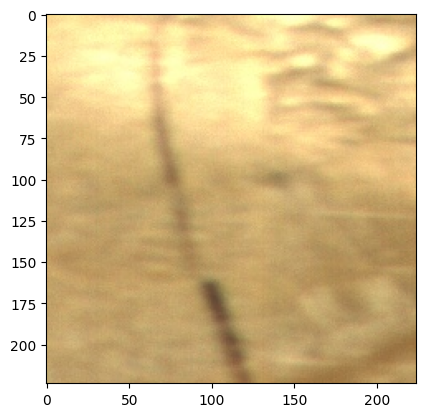

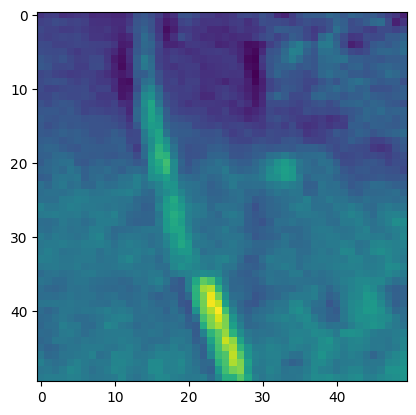

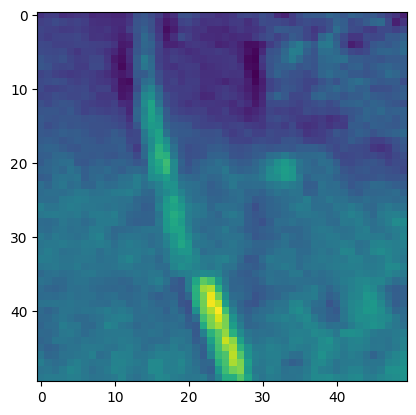

feature: (60, 50, 50, 32)
fea: (50, 50, 32)
m: (32,)
v: (32,)
max: 0.73712546
min: -0.8401283
mean map: (32,)
feature map: (50, 50, 32)
var: 0.08963867
1
max t: 1.0
min t: 0.0


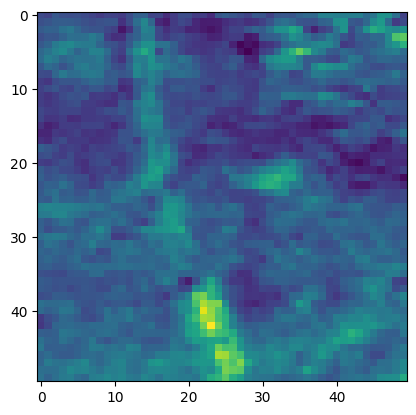

2
max t: 1.0
min t: 0.0


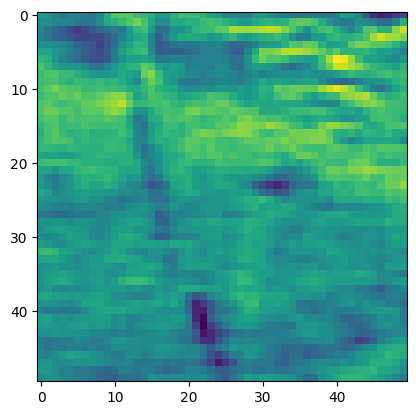

3
max t: 1.0
min t: 0.0


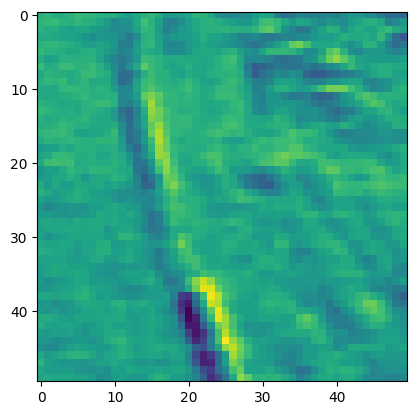

4
max t: 1.0
min t: 0.0


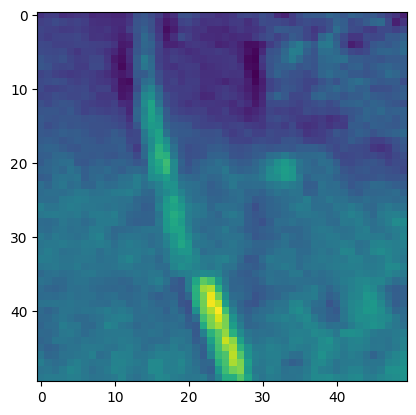

5
max t: 1.0
min t: 0.0


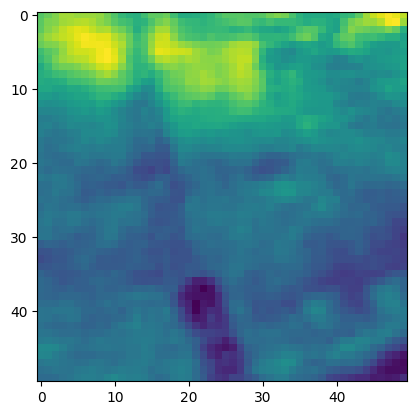

In [332]:
x_Test = x_test_224
y_Test = y_test
VAL = x_Test.shape
arr = rand_array(0, VAL[0] - 1, VAL[0]) # 生成随机数

print('VAL:', VAL)
#a1 = 16
a1 = 72 * 5 # 360 images for one class 0, 2, 5
interv = 60
a2 = a1 + interv
#nn = 0 # 8, 1, 20, 1
nn = 1 # 0, 0, 1 #oa
j = 3
mx = x_Test[a1:a2]
my = y_Test[a1:a2]
print('mx.shape:', mx.shape)
y_pre = sess.run(p, feed_dict = {X: mx, Y: my, keep_prob:1}) # discriminator训练
#img1 = y_pre[0][:, 2:110, 2:110, :]
#img2 = y_pre[1][:, 2:110, 2:110, :]
img1 = y_pre[2][:, 3:53, 3:53, :]
img2 = y_pre[3][:, 3:53, 3:53, :]
#img1 = y_pre[4][nn, 4:24, 4:24, :]
#img2 = y_pre[5][nn, 4:24, 4:24, :]
#img1 = y_pre[6][nn, 5:9, 5:9, :]
#img2 = y_pre[7][nn, 5:9, 5:9, :]
print('img1.shape:', img1.shape)

plt.imshow(mx[nn], cmap = 'Greys_r') # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
plt.imshow(img1[nn, :, :, j]) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
plt.imshow(img2[nn, :, :, j]) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
#img = y_pre[i + 3][nn, 4:24, 4:24, 1 * j + ofd]
#img = y_pre[i + 5][nn, 2:12, 2:12, 4 * j + ofd]
 
feature = img2
print('feature:', feature.shape)
fea = img2[nn]
print('fea:', fea.shape)
m = np.mean(fea, (0, 1))
v = np.std(fea, (0, 1))
print('m:', m.shape)
print('v:', v.shape)
fea2 = (fea - m) / (v + 1e-7)
var = np.var(fea)
print('max:', np.max(fea[0]))
print('min:', np.min(fea[0]))

print('mean map:', np.std(fea, (0, 1)).shape)
print('feature map:', fea2.shape)
print('var:', var)
tem = fea[:, :, j]

np.save('oa_ReLU_3', tem)
#np.save('oa_Taylor2_3', tem)
#np.save('oa_Taylor4_3', tem)
#np.save('oa_Taylor6_1', tem)
#np.save('oa_Taylor8_3', tem)

#mpimg.imsave('E:/工作/European Journal of Wood and Wood Products/pictures/oa3.jpg', mx[nn]) # 2026.02.13 用于OA数据集
#mpimg.imsave('E:/工作/European Journal of Wood and Wood Products/pictures/oa_ReLU_3.jpg', tem) # 2026.02.13 用于OA数据集
#mpimg.imsave('E:/工作/European Journal of Wood and Wood Products/pictures/oa_Taylor8_3.jpg', tem) # 2026.02.13 用于OA数据集
#mpimg.imsave('E:/工作/Industrial Crops and Products/pictures2/ReLU_1.jpg', tem)         
#mpimg.imsave('E:/工作/Industrial Crops and Products/pictures2/Taylor_2_4.jpg', tem) # 2025.09.23
for i in range(5):
    print(i + 1)
    img = fea[:, :, i] # 2025.02.25
    t = (img - np.min(img)) / (np.max(img) - np.min(img))
    print('max t:', np.max(t))
    print('min t:', np.min(t))
    t2 = img * (img > 0.5)
    #t2 = t * (t > 0.5)
    #plt.imshow(img, cmap = 'Greys_r') # feature map display
    plt.imshow(img) # feature map display
    #plt.imshow(t) # feature map display
    #plt.axis('off') # 不显示坐标轴
    plt.show()

In [264]:
i_Taylor = feature
print(feature.shape)

(60, 50, 50, 32)


In [257]:
i_ReLU = feature
print(feature.shape)

(60, 50, 50, 32)


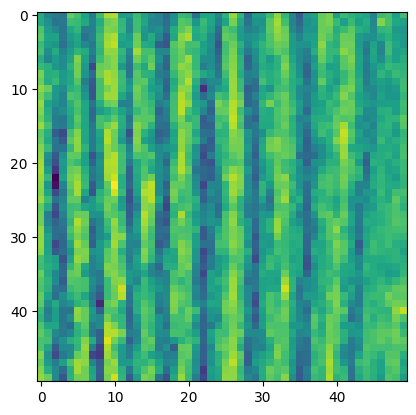

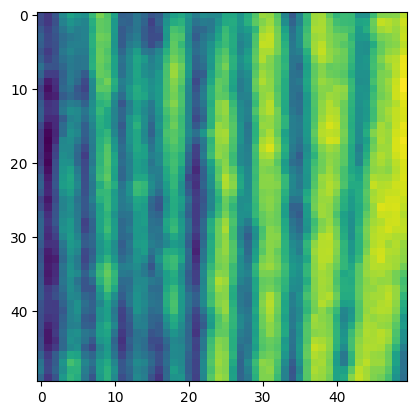

0.16070056
-0.24571107
2.013506
-2.6999407
2.7007475
-1.9786376
std1: 0.062362563
std2: 1.0


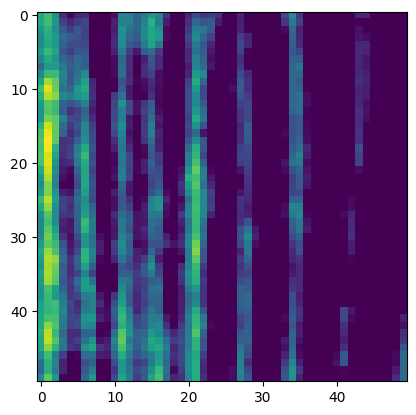

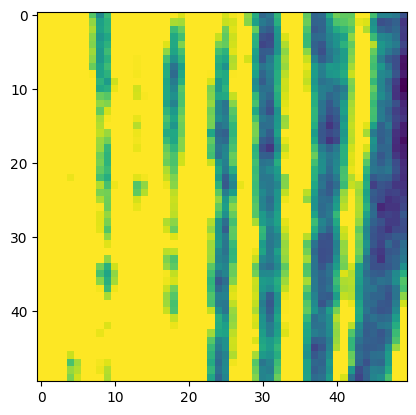

In [265]:
nn = 6 * 0
j = 7
ph = i_Taylor[nn, :, :, j]
mea = np.mean(ph)
#std = np.std(ph)
I1 = (ph - mea) / std
I1 = ph - mea
ph = i_ReLU[nn, :, :, j]
mea = np.mean(ph)
std = np.std(ph)
#I2 = ph - mea
I2 = (ph - mea) / std

plt.imshow(I1) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
plt.imshow(I2) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
ab = I1 - I2 * 1.0
mm1 = ab * 1.0
mm1 = (ab > 0) * ab
mm2 = (ab < 0) * ab
std1 = np.std(I1)
std2 = np.std(I2)
print(np.max(I1))
print(np.min(I1))
print(np.max(I2))
print(np.min(I2))
print(np.max(ab))
print(np.min(ab))
print('std1:', std1)
print('std2:', std2)
plt.imshow(mm1) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
plt.imshow(mm2) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
t = mm1
t = (t - np.min(t)) / (np.max(t) - np.min(t))
mpimg.imsave('E:/工作/Advanced Engineering Informatics/pictures/o4.jpg', mx[nn])
mpimg.imsave('E:/工作/Advanced Engineering Informatics/pictures/I_T4.jpg', I1)
mpimg.imsave('E:/工作/Advanced Engineering Informatics/pictures/I_R4.jpg', I2)
mpimg.imsave('E:/工作/Advanced Engineering Informatics/pictures/dif4.jpg', t)

np.max(data1) 0.14415193
np.min(data1) -0.070954114
np.mean(data1) 1.8692017e-08
np.max(data2) 0.24265048
np.min(data2) -0.08498782
np.mean(data2) -1.0299683e-08


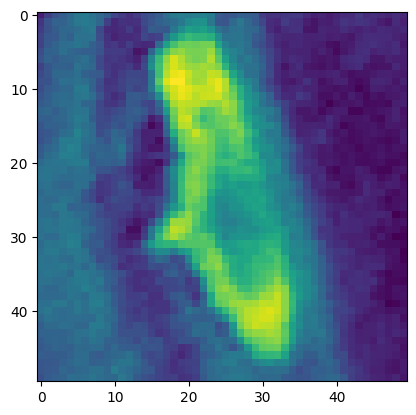

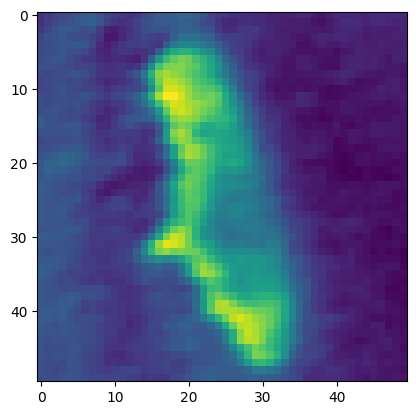

0.9
0.0


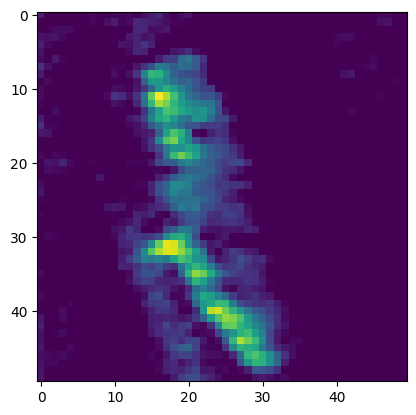

In [336]:
# image reading
img = Image.open('E:/工作/Journal of Nondestructive Evaluation/pictures/ReLU_1.jpg')
data1 = np.array(img, dtype = 'float32') / 255.
img = Image.open('E:/工作/Journal of Nondestructive Evaluation/pictures/Taylor_2_1.jpg')
data2 = np.array(img, dtype = 'float32') / 255.
img = Image.open('E:/工作/Journal of Nondestructive Evaluation/pictures/Taylor_4_1.jpg')
data3 = np.array(img, dtype = 'float32') / 255.
img = Image.open('E:/工作/Journal of Nondestructive Evaluation/pictures/Taylor_6_1.jpg')
data4 = np.array(img, dtype = 'float32') / 255.
img = Image.open('E:/工作/Journal of Nondestructive Evaluation/pictures/Taylor_8_1.jpg')
data5 = np.array(img, dtype = 'float32') / 255.

img = Image.open('E:/工作/European Journal of Wood and Wood Products/pictures/oa_ReLU_1.jpg')
data1 = np.array(img, dtype = 'float32') / 1.
img = Image.open('E:/工作/European Journal of Wood and Wood Products/pictures/oa_Taylor8_1.jpg')
data2 = np.array(img, dtype = 'float32') / 1.

data1 = np.load('oa_ReLU_2.npy')
data2 = np.load('oa_Taylor8_2.npy')

data1 = data1 - np.mean(data1)
data2 = data2 - np.mean(data2)

#img2 = img.resize((r, c), Image.LANCZOS)
print('np.max(data1)', np.max(data1))
print('np.min(data1)', np.min(data1))
print('np.mean(data1)', np.mean(data1))
print('np.max(data2)', np.max(data2))
print('np.min(data2)', np.min(data2))
print('np.mean(data2)', np.mean(data2))
plt.imshow(data1) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
plt.imshow(data2) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()
dif = data2 - data1 * 1.0
t = (dif > 0) * dif
#t = dif
t = (t - np.min(t)) / (np.max(t) - np.min(t)) * 0.9
print(np.max(t))
print(np.min(t))

#plt.imshow(t, cmap = 'hot') # feature map display
plt.imshow(t) # feature map display
#plt.axis('off') # 不显示坐标轴
plt.show()

#mpimg.imsave('E:/工作/European Journal of Wood and Wood Products/pictures/oa_dif_2.jpg', t, cmap = 'Greys_r')         
mpimg.imsave('E:/工作/European Journal of Wood and Wood Products/pictures/oa_dif_2.jpg', t)         


In [91]:
### 初始化 ###
sess = tf.Session()
#variables_to_initialize = update
#init_op = tf.variables_initializer(variables_to_initialize)

saver = tf.train.Saver(max_to_keep = 200)
#sess.run(tf.initialize_all_variables())
sess.run(tf.global_variables_initializer())
#sess.run(init_op)
N = 0 # for counting
k = 0
print('\033[5;31;47m%s\033[0m '% 'Ready for training!')
time.asctime()

Ready for training! 


'Wed Feb 11 19:53:27 2026'

In [74]:
print('x_test_224:', x_test_224.shape)
t = Acc_computation(x_test_224, y_test, 72, val[0])
acc = t[0]
print('acc:', acc)
t = Acc_computation2(x_test_224, y_test, 72, val[0])
acc2 = t[4]
print('acc2:', acc2)
#t = Acc_computation3(x_test_224, y_test, 120)
#acc3 = t
#print('acc3:', acc3)

x_test_224: (504, 224, 224, 3)
acc: 0.13492063699024065
count1: <class 'numpy.float32'>
num[0]: <class 'numpy.float32'>
acc2: 0.2361111


In [15]:
## 模型保存 ##
#saver = tf.train.Saver(max_to_keep = 200)
trainResultPath = 'D:/pythonworkspace/non-monotonic test/result/f_origin_4classes_16'
print('saving...')
saver.save(sess, trainResultPath)

saving...


'D:/pythonworkspace/non-monotonic test/result/f_origin_4classes_16'

In [325]:
## 模型加载 ##
sess = tf.Session()
#saver = tf.train.Saver(max_to_keep = 200)
saver = tf.train.Saver(update[0:10] + update[11:21]) # 2026.02.13 用于OA数据集（7类，所以输出层不能调用）
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result/f_origin_4classes_16'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result2/test82'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/qq2/f1_origin_4classes_16'
#trainResultPath = 'E:/pythonworkspace/defect_recognition/activation_test/c1/test1'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_1_Taylor_16_2/test13'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_3_Taylor_16_4/test12'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_5_Taylor_16_6/test22'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_5_Taylor_16_6/test1'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_7_Taylor_16_8/test34'
trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_9_ReLU/test19'

saver.restore(sess, trainResultPath)# 加载到当前环境中
N = 0 # for counting
time.asctime()

INFO:tensorflow:Restoring parameters from D:/pythonworkspace/non-monotonic test/result_9_ReLU/test19


'Fri Feb 13 23:55:23 2026'

In [55]:
# 模型测试 1
result = sess.run(update)
print(result[0].shape)
print(result[0][:, :, 0, 0] * 100)
print(result[10].shape)
print(result[11].shape)
nn = 3
print('1', result[11][nn, 0:1, 0:1, :] * 100)
print('2', result[12][nn, 0:1, 0:1, :] * 100)
print('3', result[13][nn, 0:1, 0:1, :] * 100)
print('4', result[14][nn, 0:1, 0:1, :] * 100)
print('5', result[15][nn, 0:1, 0:1, :] * 100)
print('6', result[16][nn, 0:1, 0:1, :] * 100)
print('7', result[17][nn, 0:1, 0:1, :] * 100)
print('8', result[18][nn, 0:1, 0:1, :] * 100)
print('9', result[19][nn, 0:1, 0:1, :] * 100)
print('10', result[20][nn, 0:1, 0:1, :] * 100)

(3, 3, 3, 32)
[[ 12.30271   -9.104545  -3.138768]
 [-19.357023   7.327081  10.9359  ]
 [-14.804734   4.215937 -14.836614]]
(1, 1, 256, 6)
(8, 1, 1, 32)
1 [[[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]]]
2 [[[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]]]
3 [[[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]]]
4 [[[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]]]
5 [[[0.1 0.1 0.1 0.1 0.1

In [34]:
# 模型测试 2
result = sess.run(update)
print(result[0].shape)
print(result[0][:, :, 0, 0] * 100)
print(result[11].shape)
nn = 1
print('1', result[11][nn, 0:1, 0:1, :] * 100)
print('2', result[12][nn, 0:1, 0:1, :] * 100)
print('3', result[13][nn, 0:1, 0:1, :] * 100)
print('4', result[14][nn, 0:1, 0:1, :] * 100)
print('5', result[15][nn, 0:1, 0:1, :] * 100)
print('6', result[16][nn, 0:1, 0:1, :] * 100)
print('7', result[17][nn, 0:1, 0:1, :] * 100)
print('8', result[18][nn, 0:1, 0:1, :] * 100)
print('9', result[19][nn, 0:1, 0:1, :] * 100)
print('10', result[20][nn, 0:1, 0:1, :] * 100)

(3, 3, 3, 32)
[[-11.228257    -4.164111     0.97550416]
 [-12.634407    11.987116   -11.026647  ]
 [  6.69147      1.1012152   13.520209  ]]
(8, 1, 1, 32)
1 [[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
   1. 1. 1. 1. 1. 1. 1. 1. 1.]]]
2 [[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
   1. 1. 1. 1. 1. 1. 1. 1. 1.]]]
3 [[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
   1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
   1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]]
4 [[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
   1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
   1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]]
5 [[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
   1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
   1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 

In [13]:
# train set randomization
#arr = rand_array(0, val[0] - 1, val[0]) # 生成随机数
#arr = np.load('arr_4_360.npy') # 加载随机数
#arr = np.load('arr_4_480.npy') # 加载随机数
#arr = np.load('arr_4_960.npy') # 加载随机数
#arr = np.load('arr_4_1440.npy') # 加载随机数
#arr = np.load('arr_4_1920.npy') # 加载随机数
#arr = np.load('arr_4_2880.npy') # 加载随机数
arr = np.load('arr_7_2016.npy') # 加载随机数
x_All = array_assign(x_train, arr)
x_all = x_All
y_All = array_assign(y_train, arr)
y_all = y_All
val = x_all.shape
print(arr[0, 0:10])
print('x shape', x_all.shape, 'y shape', y_all.shape)
N = 0 # for counting
print('\033[1;31;46m%s\033[0m '% 'Randomization finished!')
time.asctime()

[1082. 1500.  449.  181.  820. 1429.  179.  227.  981. 1949.]
x shape (2016, 224, 224, 3) y shape (2016, 1, 1, 7)
Randomization finished! 


'Sat Feb 14 10:08:04 2026'

In [17]:
np.save('arr_7_2016', arr)

num: 2100
No.  21
k.  1
Iter: 21
size: 96
Interval: 1920 2016
L_cls:  1.8845344
Acc:  0.23958333
Acc_train:  0.21180555486075936
Acc_test:  0.19642857049724885
F1_test:  0.11317261591133385
Acc_1:  0.0
Acc_2:  0.0
Acc_3:  0.0
Acc_4:  0.4
saving...
Time used: 11.782552099997702
No.  42
k.  2
Iter: 42
size: 96
Interval: 1920 2016
L_cls:  1.8130212
Acc:  0.375
Acc_train:  0.3353174613966119
Acc_test:  0.4325396889554603
F1_test:  0.3861104953709073
Acc_1:  0.54545456
Acc_2:  0.23076923
Acc_3:  0.0
Acc_4:  0.26666668
saving...
Time used: 9.586145299996133
No.  63
k.  3
Iter: 63
size: 96
Interval: 1920 2016
L_cls:  1.7371839
Acc:  0.36458334
Acc_train:  0.3893849223940855
Acc_test:  0.4841269842748131
F1_test:  0.3953293860768886
Acc_1:  0.54545456
Acc_2:  0.07692308
Acc_3:  0.0
Acc_4:  0.06666667
saving...
Time used: 9.626379299996188
No.  84
k.  4
Iter: 84
size: 96
Interval: 1920 2016
L_cls:  1.6895803
Acc:  0.44791666
Acc_train:  0.4583333292532535
Acc_test:  0.5714285634458065
F1_test: 

No.  630
k.  30
Iter: 630
size: 96
Interval: 1920 2016
L_cls:  1.0038164
Acc:  0.6354167
Acc_train:  0.6805555593399775
Acc_test:  0.7301587206976754
F1_test:  0.706490015077304
Acc_1:  0.8181818
Acc_2:  0.53846157
Acc_3:  0.5
Acc_4:  0.4
saving...
Time used: 11.211758700002974
No.  651
k.  31
Iter: 651
size: 96
Interval: 1920 2016
L_cls:  1.0096275
Acc:  0.65625
Acc_train:  0.6855158734889257
Acc_test:  0.7301587249551501
F1_test:  0.7096136402133261
Acc_1:  0.8181818
Acc_2:  0.61538464
Acc_3:  0.41666666
Acc_4:  0.46666667
saving...
Time used: 11.250364400002582
No.  672
k.  32
Iter: 672
size: 96
Interval: 1920 2016
L_cls:  1.0032626
Acc:  0.6666667
Acc_train:  0.6949404761904762
Acc_test:  0.7658730021544865
F1_test:  0.7550813864317771
Acc_1:  0.90909094
Acc_2:  0.53846157
Acc_3:  0.41666666
Acc_4:  0.53333336
saving...
Time used: 12.764291400002548
No.  693
k.  33
Iter: 693
size: 96
Interval: 1920 2016
L_cls:  0.99570817
Acc:  0.6770833
Acc_train:  0.6939484150636763
Acc_test:  0.

No.  1239
k.  59
Iter: 1239
size: 96
Interval: 1920 2016
L_cls:  0.65757585
Acc:  0.8229167
Acc_train:  0.7966269822347731
Acc_test:  0.8253968187740871
F1_test:  0.8212005639044406
Acc_1:  0.90909094
Acc_2:  0.84615386
Acc_3:  0.6666667
Acc_4:  0.6666667
saving...
Time used: 12.877941299993836
No.  1260
k.  60
Iter: 1260
size: 96
Interval: 1920 2016
L_cls:  0.6449294
Acc:  0.78125
Acc_train:  0.7867063525177184
Acc_test:  0.8253968187740871
F1_test:  0.8232964748770696
Acc_1:  0.90909094
Acc_2:  0.84615386
Acc_3:  0.5833333
Acc_4:  0.73333335
saving...
Time used: 11.333211099998152
No.  1281
k.  61
Iter: 1281
size: 96
Interval: 1920 2016
L_cls:  0.65251416
Acc:  0.7916667
Acc_train:  0.7832341307685489
Acc_test:  0.8075396759169442
F1_test:  0.8019421959979101
Acc_1:  0.8181818
Acc_2:  0.84615386
Acc_3:  0.5833333
Acc_4:  0.8
saving...
Time used: 11.338628299999982
No.  1302
k.  62
Iter: 1302
size: 96
Interval: 1920 2016
L_cls:  0.6253295
Acc:  0.8020833
Acc_train:  0.7921626993588039

No.  1848
k.  88
Iter: 1848
size: 96
Interval: 1920 2016
L_cls:  0.4823501
Acc:  0.8854167
Acc_train:  0.8343253958792913
Acc_test:  0.8154761876378741
F1_test:  0.8111495815750666
Acc_1:  0.90909094
Acc_2:  0.9230769
Acc_3:  0.8333333
Acc_4:  0.93333334
saving...
Time used: 11.38052580000658
No.  1869
k.  89
Iter: 1869
size: 96
Interval: 1920 2016
L_cls:  0.5002694
Acc:  0.8645833
Acc_train:  0.8482142885526022
Acc_test:  0.8234126908438546
F1_test:  0.8184689145543137
Acc_1:  0.8181818
Acc_2:  0.9230769
Acc_3:  0.8333333
Acc_4:  1.0
saving...
Time used: 11.428834800004552
No.  1890
k.  90
Iter: 1890
size: 96
Interval: 1920 2016
L_cls:  0.52848506
Acc:  0.8645833
Acc_train:  0.8437499971616835
Acc_test:  0.8154761876378741
F1_test:  0.8102802282540542
Acc_1:  0.90909094
Acc_2:  0.9230769
Acc_3:  0.6666667
Acc_4:  0.8666667
saving...
Time used: 11.413854699996591
No.  1911
k.  91
Iter: 1911
size: 96
Interval: 1920 2016
L_cls:  0.5312137
Acc:  0.84375
Acc_train:  0.8387896901085263
Acc_

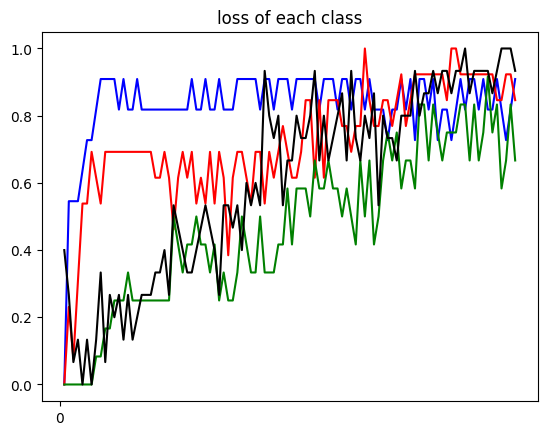

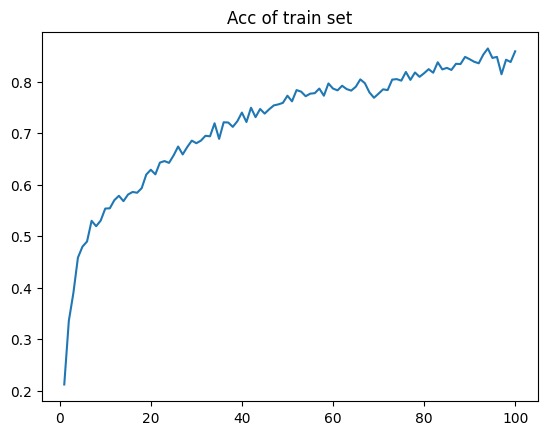

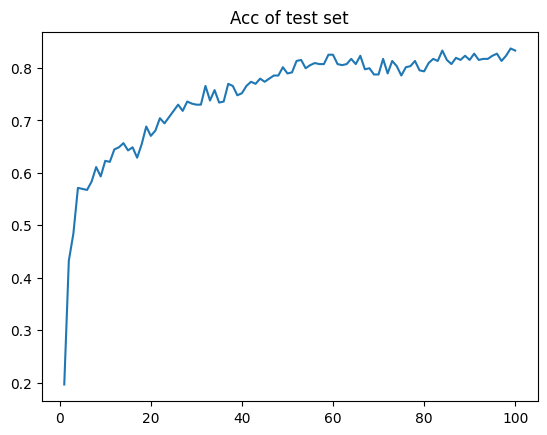

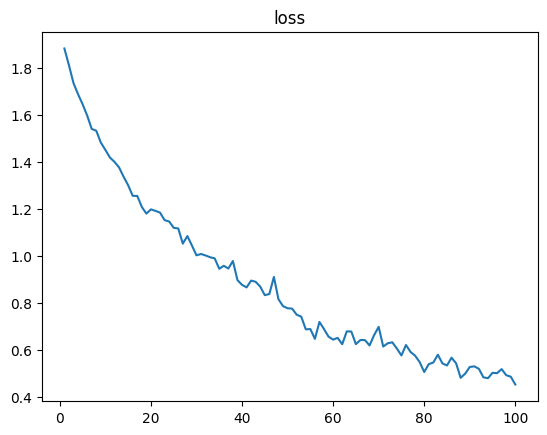

'Wed Feb 11 20:13:00 2026'

In [92]:
# training
#D_solver = tf.train.AdamOptimizer(1 * 1e-5).minimize(L_cls, var_list = update)
mb_size = 96
s0 = time.perf_counter()
#s1 = time.clock()
s1 = time.perf_counter()
inter = int(x_all.shape[0] / mb_size)
num = inter * 100
print('num:', num)
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_1_Quadratic_16_feature_map/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_2_Quadratic_16_channel/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_3_Quadratic_16_node/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_4_Quadratic_16/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_4_Quadratic_16_2/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_5_ReLU_16/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_5_ReLU_16_feature_map/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_6_ReLU_16_channel/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_7_ReLU_16_node/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_9_Taylor_16_2/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_10_Taylor_16_4/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_11_Taylor_16_6/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_12_Taylor_16_8/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_13_Taylor_16_01/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_14_Taylor_16_5/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_15_Taylor_16_7/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_16_Taylor_32_7/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_17_Taylor_32_5/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_18_Taylor_32_4/test'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/result_19_Taylor_32_3/test'
trainResultPath = 'D:/pythonworkspace/non-monotonic test/result2/test'
k = 0
#rate = 2 * 1e-5
for it in range(num):
    m1 = (N * mb_size) % (val[0])
    m2 = np.min([m1 + mb_size, val[0]])
    a1 = np.arange(m1, m2)
    m3 = 0
    m4 = np.max([m1 + mb_size - val[0], 0])
    a2 = np.arange(m3, m4)
    b1 = a1.tolist()
    b2 = a2.tolist()
    t_idx = b1 + b2
    #print(len(t_idx), m1, m2, m3, m4)
    N = N + 1
    X_mb = x_all[t_idx]
    y_mb = y_all[t_idx]
    
    #result1 = sess.run([D_solver, L_cls, M, scr, mea], feed_dict = {X: X_mb, Y: y_mb, keep_prob: 0.6}) # discriminator训练
    result1 = sess.run([D_solver, L_cls, Acc, Acc_1, Acc_2, Acc_3, Acc_4], feed_dict = {X: X_mb, Y: y_mb}) # discriminator训练
    #result1 = sess.run([L_cls, L_cls, M, scr], feed_dict = {X: X_mb, Y: y_mb, keep_prob:0.6}) # discriminator训练
    #result2 = sess.run([Acc, Acc_1, Acc_2, Acc_3, C, D_cls, Y], feed_dict = {X: X_mb, Y:y_mb, keep_prob:1}) # discriminator训练
    
    t = Acc_computation(x_train, y_train, 96, val[0])
    Acc_train = t[0]
    score_train = t[3]
    CM_train = F1_score_computation(t[1], t[2])

    #print('CM_train:', CM_train)
    t = Acc_computation(x_test_224, y_test, 72, val[0])
    Acc_test = t[0]
    score_test = t[3]
    CM_test = F1_score_computation(t[1], t[2])
    
    #t = Acc_computation(x_test_224new, y_testnew, 120, val[0])
    #Acc_test2 = t[0]
    #score_test2 = t[3]
    
    # residual record
    if N % inter == 0:
        if k == 0:
            r_w1 = np.array([result1[1]]) # Loss
            r_w2 = np.array([result1[2]]) # Acc
            r_w3 = np.array([result1[3]]) # Acc of class 1
            r_w4 = np.array([result1[4]]) # Acc of class 2
            r_w5 = np.array([result1[5]]) # Acc of class 3
            r_w6 = np.array([result1[6]]) # Acc of class 4
            r_w7 = np.array([Acc_train]) # Acc in train set
            r_w8 = np.array([Acc_test]) # Acc in test set
            r_w9 = CM_train[0] # Confuse matrix of train set
            r_w10 = CM_test[0] # Confuse matrix of test set
            r_w11 = score_train
            r_w12 = score_test
        if k > 0:
            r_w1 = np.concatenate((r_w1, np.array([result1[1]])), 0)
            r_w2 = np.concatenate((r_w2, np.array([result1[2]])), 0)
            r_w3 = np.concatenate((r_w3, np.array([result1[3]])), 0)
            r_w4 = np.concatenate((r_w4, np.array([result1[4]])), 0)
            r_w5 = np.concatenate((r_w5, np.array([result1[5]])), 0)
            r_w6 = np.concatenate((r_w6, np.array([result1[6]])), 0)
            r_w7 = np.concatenate((r_w7, np.array([Acc_train])), 0)
            r_w8 = np.concatenate((r_w8, np.array([Acc_test])), 0)
            r_w9 = np.concatenate((r_w9, CM_train[0]), 0)
            r_w10 = np.concatenate((r_w10, CM_test[0]), 0)
            r_w11 = np.concatenate((r_w11, score_train), 1)
            r_w12 = np.concatenate((r_w12, score_test), 1)
        k = k + 1

    #print('k:', k)
    #输出训练时的参数
    if N % inter == 0:
    #if N > 0:
        print('No. ', N)
        print('k. ', k)
        print('Iter: {}'.format(it + 1))
        print('size:', X_mb.shape[0])
        print('Interval:', m1, m2)
        print('L_cls: ', result1[1])
        print('Acc: ', result1[2])
        print('Acc_train: ', Acc_train)
        print('Acc_test: ', Acc_test)
        print('F1_test: ', CM_test[1])
        print('Acc_1: ', result1[3])
        print('Acc_2: ', result1[4])
        print('Acc_3: ', result1[5])
        print('Acc_4: ', result1[6])
        print('saving...')
        if k == 1:
            saver = tf.train.Saver(max_to_keep = 200)
            saver.save(sess, trainResultPath + str(k))
            ori = Acc_test
            f1 = CM_test[1]
            peak_num = k
        if k > 1:
            if Acc_test > ori:
                #saver.save(sess, trainResultPath + str(k), write_meta_graph = False)
                saver.save(sess, trainResultPath + str(k))
                ori = Acc_test
                f1 = CM_test[1]
                peak_num = k
        s2 = time.perf_counter()
        print('Time used:', s2 - s1)
        s1 = time.perf_counter()
s3 = time.perf_counter()
print('Time used(min):', (s3 - s0) / 60)
print('peak_num:', peak_num)
print('Peak acc of test set:', ori)
print('Peak F1 of test set:', f1)

rs = r_w1.shape
############################
#np.save('res2_vgg.npy', r_w1)
############################
print('r_w1:', rs)
# ploting
axis_x = np.arange(1, rs[0] + 1, 1)
axis_y = r_w3
plt.plot(axis_x, axis_y, c = 'b')
axis_y = r_w4
plt.plot(axis_x, axis_y, c = 'r')
axis_y = r_w5
plt.plot(axis_x, axis_y, c = 'g')
axis_y = r_w6
plt.plot(axis_x, axis_y, c = 'k')

x_major_locator = MultipleLocator(500)
ax = plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.title('loss of each class') #
plt.show()
axis_y = r_w7
plt.plot(axis_x, axis_y)
plt.title('Acc of train set') #
plt.show()
axis_y = r_w8
plt.plot(axis_x[0:200], axis_y[0:200])
plt.title('Acc of test set') #
plt.show()
axis_y = r_w1
plt.plot(axis_x, axis_y)
plt.title('loss') #
plt.show()
time.asctime()

In [93]:
# data save
print(max(r_w8))
print(type(r_w8))
print(r_w8.shape)
t = np.argmax(r_w8)
print(t)
#path = 'D:/pythonworkspace/non-monotonic test/Quadratic Unit_new'
#path = 'D:/pythonworkspace/non-monotonic test/Cubic Unit_new'
#path = 'D:/pythonworkspace/non-monotonic test/Mish_new'
#path = 'D:/pythonworkspace/non-monotonic test/Sinusoid_new'
path = 'D:/pythonworkspace/non-monotonic test/Gaussian_new'
#path = 'D:/pythonworkspace/non-monotonic test/GELU'
#path = 'D:/pythonworkspace/non-monotonic test/SiLU'
#path = 'D:/pythonworkspace/non-monotonic test/ReLU_new'

np.save(path + '/loss.npy', r_w1)
np.save(path + '/acc_train.npy', r_w7)
np.save(path + '/acc_test.npy', r_w8)
time.asctime()

0.8373015778405326
<class 'numpy.ndarray'>
(100,)
98


'Wed Feb 11 20:34:05 2026'

In [29]:
print(update)
saver = tf.train.Saver(max_to_keep = 200)
saver.save(sess, trainResultPath + str(k))

[<tf.Variable 'v0:0' shape=(3, 3, 3, 32) dtype=float32>, <tf.Variable 'v0_1:0' shape=(3, 3, 32, 32) dtype=float32>, <tf.Variable 'v0_2:0' shape=(3, 3, 32, 64) dtype=float32>, <tf.Variable 'v0_3:0' shape=(3, 3, 64, 64) dtype=float32>, <tf.Variable 'v0_4:0' shape=(3, 3, 64, 128) dtype=float32>, <tf.Variable 'v0_5:0' shape=(3, 3, 128, 128) dtype=float32>, <tf.Variable 'v0_6:0' shape=(3, 3, 128, 256) dtype=float32>, <tf.Variable 'v0_7:0' shape=(3, 3, 256, 256) dtype=float32>, <tf.Variable 'v0_8:0' shape=(7, 7, 256, 256) dtype=float32>, <tf.Variable 'v0_9:0' shape=(1, 1, 256, 256) dtype=float32>, <tf.Variable 'v0_10:0' shape=(1, 1, 256, 4) dtype=float32>, <tf.Variable 'v:0' shape=(8, 1, 1, 32) dtype=float32>, <tf.Variable 'v_1:0' shape=(8, 1, 1, 32) dtype=float32>, <tf.Variable 'v_2:0' shape=(8, 1, 1, 64) dtype=float32>, <tf.Variable 'v_3:0' shape=(8, 1, 1, 64) dtype=float32>, <tf.Variable 'v_4:0' shape=(8, 1, 1, 128) dtype=float32>, <tf.Variable 'v_5:0' shape=(8, 1, 1, 128) dtype=float32>,

'D:/pythonworkspace/non-monotonic test/result3/test10'

In [10]:
print(update)
saver = tf.train.Saver(update[0:11])
saver.save(sess, 'D:/pythonworkspace/non-monotonic test/result3/test_part')

[<tf.Variable 'v0:0' shape=(3, 3, 3, 32) dtype=float32>, <tf.Variable 'v0_1:0' shape=(3, 3, 32, 32) dtype=float32>, <tf.Variable 'v0_2:0' shape=(3, 3, 32, 64) dtype=float32>, <tf.Variable 'v0_3:0' shape=(3, 3, 64, 64) dtype=float32>, <tf.Variable 'v0_4:0' shape=(3, 3, 64, 128) dtype=float32>, <tf.Variable 'v0_5:0' shape=(3, 3, 128, 128) dtype=float32>, <tf.Variable 'v0_6:0' shape=(3, 3, 128, 256) dtype=float32>, <tf.Variable 'v0_7:0' shape=(3, 3, 256, 256) dtype=float32>, <tf.Variable 'v0_8:0' shape=(7, 7, 256, 256) dtype=float32>, <tf.Variable 'v0_9:0' shape=(1, 1, 256, 256) dtype=float32>, <tf.Variable 'v0_10:0' shape=(1, 1, 256, 4) dtype=float32>, <tf.Variable 'v:0' shape=(8, 1, 1, 32) dtype=float32>, <tf.Variable 'v_1:0' shape=(8, 1, 1, 32) dtype=float32>, <tf.Variable 'v_2:0' shape=(8, 1, 1, 64) dtype=float32>, <tf.Variable 'v_3:0' shape=(8, 1, 1, 64) dtype=float32>, <tf.Variable 'v_4:0' shape=(8, 1, 1, 128) dtype=float32>, <tf.Variable 'v_5:0' shape=(8, 1, 1, 128) dtype=float32>,

'D:/pythonworkspace/non-monotonic test/result3/test_part'

In [59]:
### 初始化 ###
sess = tf.Session()
saver = tf.train.Saver(max_to_keep = 200)
#sess.run(tf.initialize_all_variables())
sess.run(tf.global_variables_initializer())
print('\033[5;31;47m%s\033[0m '% 'Ready for training!')
time.asctime()

Ready for training! 


'Tue Feb 10 14:37:11 2026'

In [166]:
## 模型加载 1 ##
#sess = tf.Session()
#saver = tf.train.Saver(max_to_keep = 200)
saver = tf.train.Saver(update[0:10] + update[11:21])
#saver = tf.train.Saver(update)
trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_9_ReLU/test19'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result3/test_part'
saver.restore(sess, trainResultPath)# 加载到当前环境中


INFO:tensorflow:Restoring parameters from D:/pythonworkspace/non-monotonic test/result_9_ReLU/test19


In [81]:
result = sess.run(update)
print(len(result))
print(result[0].shape)
print('result[9].shape', result[9].shape)
print('result[10].shape', result[10].shape)
print('result[11].shape', result[11].shape)
print('result[12].shape', result[12].shape)
print('conv1\n', result[0][:, :, 0, 0] * 100)
print('conv2\n', result[1][:, :, 0, 0] * 100)
print('conv3\n', result[2][:, :, 0, 0] * 100)
print('conv4\n', result[3][:, :, 0, 0] * 100)
print('conv10\n', result[10][:, :, 0, :] * 1)
print(result[10].shape)
nn = 1
print('1', result[11][nn, 0:1, 0:1, :] * 100)
print('2', result[12][nn, 0:1, 0:1, :] * 100)
print('3', result[13][nn, 0:1, 0:1, :] * 100)
print('4', result[14][nn, 0:1, 0:1, :] * 100)
print('5', result[15][nn, 0:1, 0:1, :] * 100)
print('6', result[16][nn, 0:1, 0:1, :] * 100)
print('7', result[17][nn, 0:1, 0:1, :] * 100)
print('8', result[18][nn, 0:1, 0:1, :] * 100)
print('9', result[19][nn, 0:1, 0:1, :] * 100)
print('10', result[20][nn, 0:1, 0:1, :] * 100)

21
(3, 3, 3, 32)
result[9].shape (1, 1, 256, 256)
result[10].shape (1, 1, 256, 4)
result[11].shape (8, 1, 1, 32)
result[12].shape (8, 1, 1, 32)
conv1
 [[ 12.30271   -9.104545  -3.138768]
 [-19.357023   7.327081  10.9359  ]
 [-14.804734   4.215937 -14.836614]]
conv2
 [[ 12.656037  -13.001082   -9.682877 ]
 [ 15.834949    6.641751   -5.7735634]
 [-14.82355    -4.4762917 -15.2304735]]
conv3
 [[-17.664742    6.7024283   5.15715  ]
 [ -1.6814642 -13.840292   10.758976 ]
 [  9.865091   -3.922908   16.310986 ]]
conv4
 [[  0.61028     0.219521  -16.954918 ]
 [  3.0729969   5.7798667  -2.942794 ]
 [  8.687246    6.0715537   3.776286 ]]
conv10
 [[[ 0.03215591 -0.09356806 -0.10039387 -0.00637378]]]
(1, 1, 256, 4)
1 [[[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]]]
2 [[[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
   0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]]]
3 [[[0.1 0

In [74]:
result = sess.run(update)
print(len(result))
print(result[0].shape)
print('conv1\n', result[0][:, :, 0, 0] * 100)
print('conv2\n', result[1][:, :, 0, 0] * 100)
print('conv3\n', result[2][:, :, 0, 0] * 100)
print('conv4\n', result[3][:, :, 0, 0] * 100)

21
(3, 3, 3, 32)
conv1
 [[ -1.8686646  -10.2582445    3.2110512 ]
 [ -8.851847     0.05734971   6.202002  ]
 [ -3.2705061    0.04692763  11.694164  ]]
conv2
 [[ -3.8875155  11.025965    4.988123 ]
 [ -5.428006    1.0742663 -18.18195  ]
 [  1.0542288 -18.996614   -2.2482967]]
conv3
 [[  7.5406313  -2.2353082 -13.243316 ]
 [  8.605168    1.129261   -3.6458454]
 [ -3.5964818   1.5138252  -5.341168 ]]
conv4
 [[14.426105   5.6348095  3.1950262]
 [ 2.078854   6.8598466  0.7598343]
 [10.495646   6.0099363 -5.466196 ]]


In [ ]:
## cycle training for data recording 2026.01.31
for i in range(10):
    # initialization
    sess = tf.Session()
    saver = tf.train.Saver(max_to_keep = 200)
    sess.run(tf.global_variables_initializer())
    N = 0 # for counting
    k = 0
    print('\033[5;31;47m%s\033[0m '% 'Ready for training!')
    time.asctime()
    
    # training
    mb_size = 144
    s0 = time.perf_counter()
    s1 = time.perf_counter()
    inter = int(x_all.shape[0] / mb_size)
    num = inter * 100
    print('num:', num)
    trainResultPath = 'D:/pythonworkspace/frequence-test/test1/test'
    k = 0
    #rate = 2 * 1e-5
    for it in range(num):
        m1 = (N * mb_size) % (val[0])
        m2 = np.min([m1 + mb_size, val[0]])
        a1 = np.arange(m1, m2)
        m3 = 0
        m4 = np.max([m1 + mb_size - val[0], 0])
        a2 = np.arange(m3, m4)
        b1 = a1.tolist()
        b2 = a2.tolist()
        t_idx = b1 + b2
        #print(len(t_idx), m1, m2, m3, m4)
        N = N + 1
        X_mb = x_all[t_idx]
        y_mb = y_all[t_idx]
        
        result1 = sess.run([D_solver, L_cls, Acc, Acc_1, Acc_2, Acc_3, Acc_4], feed_dict = {X: X_mb, Y: y_mb}) # discriminator训练

        t = Acc_computation(x_train, y_train, 144, val[0])
        Acc_train = t[0]
        score_train = t[3]
        CM_train = F1_score_computation(t[1], t[2])

        #print('CM_train:', CM_train)
        t = Acc_computation(x_test, y_test, 72, val[0])
        Acc_test = t[0]
        score_test = t[3]
        CM_test = F1_score_computation(t[1], t[2])

        # residual record
        if N % inter == 0:
            k = k + 1 # counting
            if k == 1:
                saver = tf.train.Saver(max_to_keep = 200)
                #saver.save(sess, trainResultPath + str(k))
                ori = Acc_test
                f1 = CM_test[1]
                peak_num = k
                print('Peak acc:', ori)
                print('Peak f1:', f1)
                print('No:', k)
                s2 = time.perf_counter()
                print('Time used:', s2 - s1)
            if k > 1:
                if Acc_test > ori:
                    #saver.save(sess, trainResultPath + str(k), write_meta_graph = False)
                    #saver.save(sess, trainResultPath + str(k))
                    ori = Acc_test
                    f1 = CM_test[1]
                    peak_num = k
                    print('Peak acc:', ori)
                    print('Peak f1:', f1)
                    print('No:', k)
                    s2 = time.perf_counter()
                    print('Time used:', s2 - s1)
            s1 = time.perf_counter()
    s3 = time.perf_counter()
    print('Time used(min):', (s3 - s0) / 60)
    print('peak_num:', peak_num)
    print('Peak acc of test set:', ori)
    print('Peak F1 of test set:', f1)
    if i == 0:
        wb = Workbook()
        ws = wb.active
        ws['A1'] = 'Acc'
        ws['B1'] = 'F1'
    ws.append([ori, f1])
    print('\033[5;31;47m%s\033[0m '% 'Cycle:', i + 1)
wb.save('output.xlsx')

Ready for training! 
num: 1400
Peak acc: 0.14285714285714285
Peak f1: 0.03571428571428571
No: 1
Time used: 16.013436199998978
Peak acc: 0.22222221749169485
Peak f1: 0.09864258851134282
No: 2
Time used: 15.660088500000711
Peak acc: 0.38095238831426415
Peak f1: 0.33406091071156846
No: 4
Time used: 15.472694100000808
Peak acc: 0.515873022377491
Peak f1: 0.45989121770092745
No: 5
Time used: 15.456321699999535
Peak acc: 0.5634920618363789
Peak f1: 0.5267941502093304
No: 6
Time used: 15.35368279999966
Peak acc: 0.6428571439215115
Peak f1: 0.5845386819515007
No: 7
Time used: 15.319230900000548
Peak acc: 0.6865079360348838
Peak f1: 0.6460242079481225
No: 8
Time used: 15.603217500000028
Peak acc: 0.7083333368812289
Peak f1: 0.6810571199022678
No: 10
Time used: 15.622122199998557
Peak acc: 0.7400793773787362
Peak f1: 0.7310741958195305
No: 11
Time used: 15.644360700000107
Peak acc: 0.7678571428571429
Peak f1: 0.7589036249137272
No: 12
Time used: 15.62986219999948
Peak acc: 0.7857142857142857
Pea

Peak acc: 0.7876984051295689
Peak f1: 0.7878699853249407
No: 25
Time used: 11.341418500000145
Peak acc: 0.8075396844318935
Peak f1: 0.8058096303554708
No: 26
Time used: 11.471967400000722
Peak acc: 0.8174603240830558
Peak f1: 0.813463184604083
No: 31
Time used: 11.326253200000792
Peak acc: 0.8373015948704311
Peak f1: 0.8360366022943602
No: 55
Time used: 11.319603500000085


In [13]:
wb.save('output.xlsx')

In [14]:
import kagglehub
# Download latest version

Path = 'D:/pythonworkspace/wood-defect-20240902'
os.environ['KAGGLEHUB_CACHE'] = Path
path = kagglehub.dataset_download('qun1995/wood-defect-small')

print("Path to dataset files:", path)

100%|█████████████████████████████████████████████████████████████████████████████| 99.1M/99.1M [00:05<00:00, 18.2MB/s]

Extracting model files...


Path to dataset files: D:/pythonworkspace/wood-defect-20240902\datasets\qun1995\wood-defect-small\versions\1


In [19]:
## 模型加载（临时2025.07.19） ##
sess = tf.Session()
saver = tf.train.Saver(max_to_keep = 200)
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result/f_origin_4classes_16'
trainResultPath = 'D:/pythonworkspace/non-monotonic test/result2/test69'
#trainResultPath = 'E:/pythonworkspace/non-monotonic test/qq2/f1_origin_4classes_16'
#trainResultPath = 'E:/pythonworkspace/defect_recognition/activation_test/c1/test1'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_1_Taylor_16_2/test7'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_3_Taylor_16_4/test12'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_5_Taylor_16_6/test22'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_5_Taylor_16_6/test12'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_7_Taylor_16_8/test34'
#trainResultPath = 'D:/pythonworkspace/non-monotonic test/result_9_ReLU/test19'

saver.restore(sess, trainResultPath)# 加载到当前环境中
N = 0 # for counting
time.asctime()

INFO:tensorflow:Restoring parameters from D:/pythonworkspace/non-monotonic test/result2/test69


'Wed Jan 28 18:59:10 2026'

5
(60, 1, 1, 256)
(60, 1, 1, 256)
(60, 1, 1, 256)
(60, 1, 1, 256)
(60, 1, 1, 7)
2016
(1440, 1, 1, 256)
(1440, 1, 1, 256)
(1440,)
(1440,)


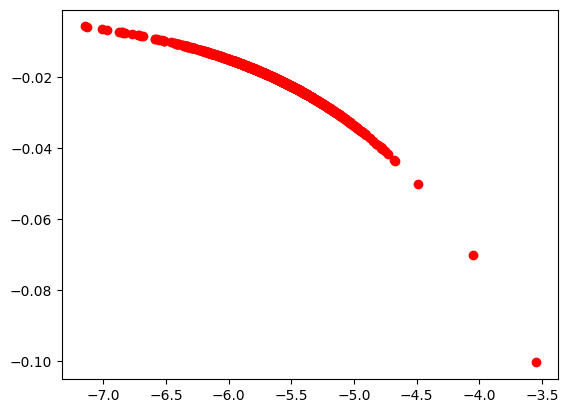

(1440,)
(1440,)


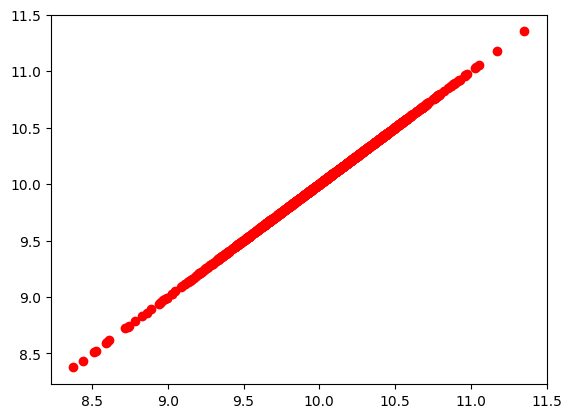

(1440,)
(1440,)


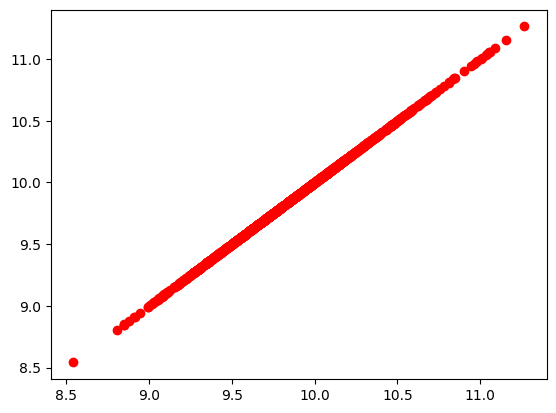

(1440,)
(1440,)


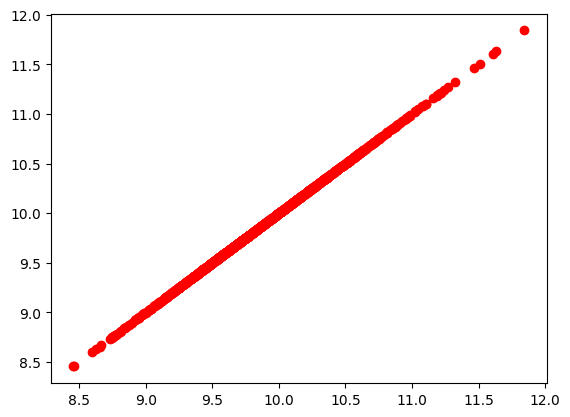

(1440,)
(1440,)


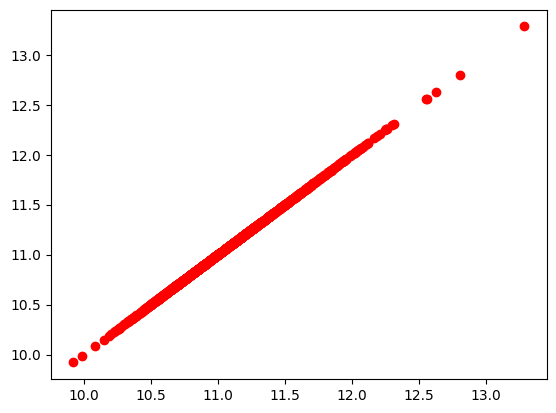

(1440,)
(1440,)


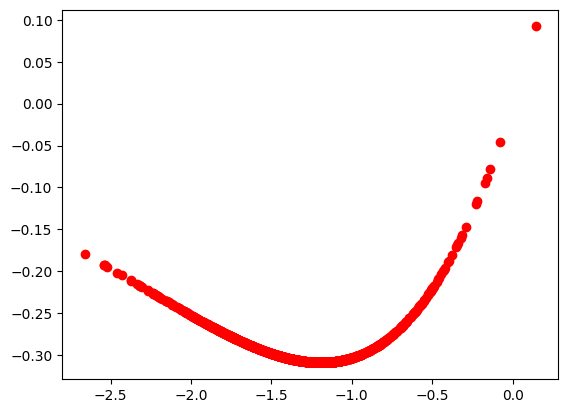

(1440,)
(1440,)


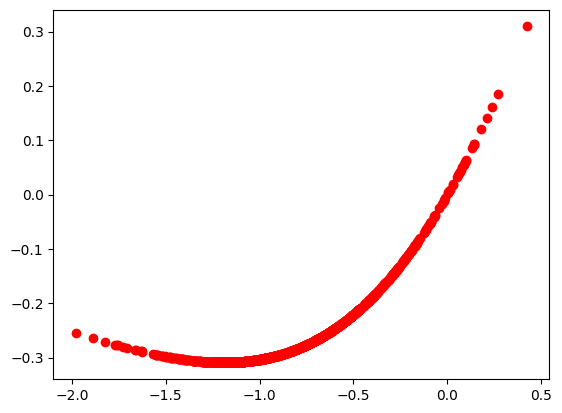

(1440,)
(1440,)


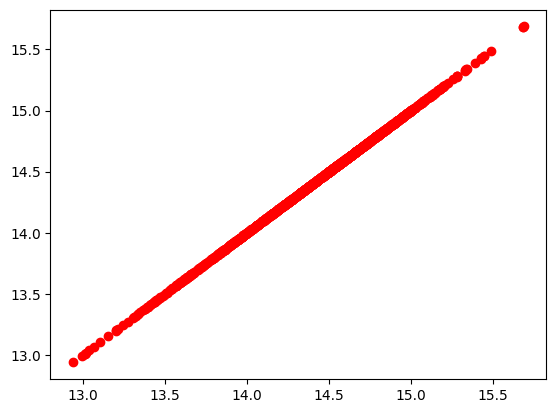

(1440,)
(1440,)


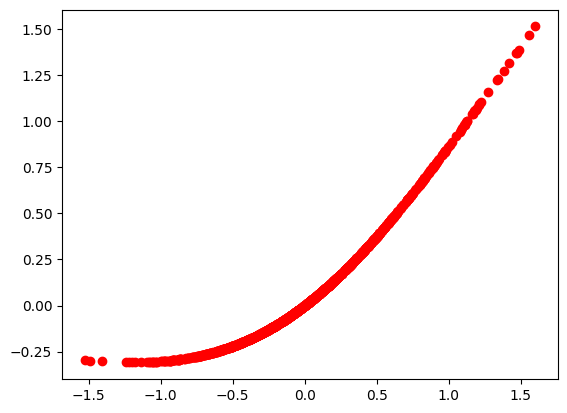

(1440,)
(1440,)


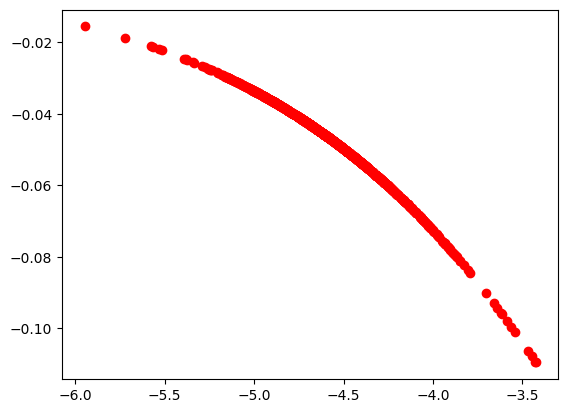

In [80]:
#result1 = sess.run(Test_1) # discriminator训练

#result = sess.run([Test_x1, Test_y1, Test_x2, Test_y2], feed_dict = {X: x_train[0:60], keep_prob:0.6}) # discriminator训练
result = sess.run([Test_x1, Test_y1, Test_x2, Test_y2, D_cls], feed_dict = {X: x_train[0:60], keep_prob:1.0}) # discriminator训练
print(len(result))
axis_x1 = result[0][:, 0, 0, 0]
axis_y1 = result[1][:, 0, 0, 0]
#axis_x2 = result[2][:, 0, 0, 0]
#axis_y2 = result[3][:, 0, 0, 0]
print(result[0].shape)
print(result[1].shape)
print(result[2].shape)
print(result[3].shape)
print(result[4].shape)
#print(result[2].shape)
#print(result[3].shape)

#x_Test = x_test_224
x_Test = x_train_224
#x_Test = x_train_224[0:120]
#x_Test = x_train_224[120:240]
#x_Test = x_train_224[240:360]

#y_Test = y_test
#y_Test = y_train[0:120]
#y_Test = y_train
VAL = x_Test.shape
print(VAL[0])
a1 = 0
interval = 10
a2 = a1 + interval
i = 0
nn = 0 # 特征序号
endn = 1440
while a2 < endn:
#while i < 1:
    a1 = i * interval # start point
    #a2 = np.min([a1 + interval, val[0]]) # end point
    a2 = np.min([a1 + interval, endn]) # end point
    #result = sess.run([Test_x1, Test_y1, Test_x2, Test_y2], feed_dict = {X: x_Test[a1:a2], keep_prob: 1.0}) # discriminator训练
    result = sess.run([Test_x1, Test_y1, Test_x2, Test_y2, yp], feed_dict = {X: x_Test[a1:a2], keep_prob: 1.0}) # discriminator训练
    if i == 0:
        axis_x1 = result[0]
        axis_y1 = result[1]
        axis_x2 = result[2]
        axis_y2 = result[3]
        cls = result[4]
    if i > 0:
        axis_x1 = np.concatenate((axis_x1, result[0]), 0)
        axis_y1 = np.concatenate((axis_y1, result[1]), 0)
        axis_x2 = np.concatenate((axis_x2, result[2]), 0)
        axis_y2 = np.concatenate((axis_y2, result[3]), 0)
        cls = np.concatenate((cls, result[4]), 0)
    i = i + 1
    #print('No.', i, 'Interval:', a1, a2)
print(axis_x1.shape)
print(axis_y1.shape)
#print(axis_x1[:, 0, 0, nn + i])
#print(axis_y1[:, 0, 0, nn + i])

for i in range(10):
    print(axis_x1[:, 0, 0, nn + i].shape)
    print(axis_y1[:, 0, 0, nn + i].shape)
    #print(cls[:, 0, 0, nn + i].shape)
    plt.scatter(axis_x1[:, 0, 0, nn + i], axis_y1[:, 0, 0, nn + i], c = 'r')
    #plt.scatter(axis_x1[:, 0, 0, nn + i], axis_x2[:, 0, 0, nn + i], c = 'g')
    #plt.scatter(axis_x1[:, 0, 0, nn + i], axis_y2[:, 0, 0, nn + i + 10], c = 'b')
    #plt.scatter(axis_x1[:, 0, 0, nn + i], cls[:, 0, 0, nn + i], c = 'r')
    #plt.scatter(axis_x1[nn, 0, 0, :], axis_y1[nn, 0, 0, :], c = 'r')
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1440, 1, 1, 128)
(1440, 1, 1, 128)
i: 19


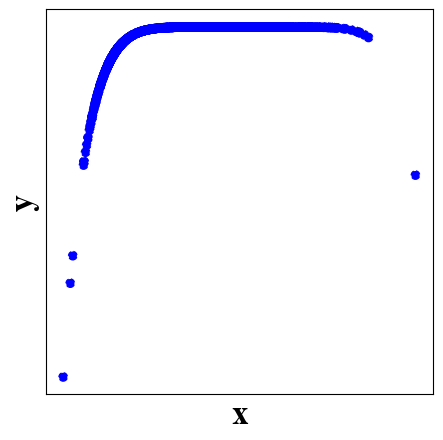

In [81]:
# Activation function plot 2025.05.03
print(axis_y1.shape)
print(axis_x1.shape)
#j = 0 # 0, 3, 4
#j = 3 # 0, 3, 4
#j = 4 # 0, 3, 4
j = 10 # 0, 3, 4
x = axis_x1[:, 0, 0, nn + j]
y = axis_y1[:, 0, 0, nn + j]
print('i:', i)

#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 24}
font2 = font_manager.FontProperties(fname = (r'C:\Windows\Fonts\simsun.ttc'), weight = 'bold', size = 20)
font3 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 16)
font4 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 18)

fig = plt.figure(figsize = (5, 5))

plt.scatter(x * 1, y, c = 'blue', linestyle = '--', marker = 'o')

Lg = plt.legend(prop = font4, frameon = False) # display lengend
#plt.legend()
#font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
plt.xlabel('x', fontdict = font1)
#plt.xlabel('训练周期Epoch', FontProperties = font3)
#plt.xlabel('Inference time(ms)', FontProperties = font1)
#plt.ylabel('Loss', fontsize = 14, fontdict = font)
#plt.ylabel('准确率Accuracy', FontProperties = font3)
#plt.ylabel('损失Loss', FontProperties = font3)
plt.ylabel('y', fontdict = font1)
#x_major_locator = MultipleLocator(10) # x axis interval setting
#y_major_locator = MultipleLocator(50) # y axis interval setting
ax = plt.gca()
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
#ax.xaxis.set_major_locator(x_major_locator)
#ax.yaxis.set_major_locator(y_major_locator)
plt.xticks(fontproperties = 'Times New Roman', size = 18)
plt.yticks(fontproperties = 'Times New Roman', size = 18)
#plt.axis('off')
plt.xticks([])
plt.yticks([])
#plt.ylim(-1, 1)
#plt.xlim(0, 100)
#y_values=list(range(11))

#plt.savefig('E:/工作/农业工程学报/loss示意图1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/农业工程学报/acc_train1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/仪器仪表学报/acc_train1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Acc vs time for AF.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Acc vs epoch for AF.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
plt.savefig('E:\工作\IEEE transaction on image processing\pictures\order8_4.jpg', bbox_inches = 'tight', dpi = 200) # 2025.06.16
plt.show()

In [134]:
# data save
print(max(r_w1))
print(type(r_w1))
print(r_w11.shape)

#path = 'D:/pythonworkspace/non-monotonic test/result_9_ReLU'
#path = 'D:/pythonworkspace/non-monotonic test/Quadratic Unit'
#path = 'D:/pythonworkspace/non-monotonic test/Cubic Unit'
#path = 'D:/pythonworkspace/non-monotonic test/Mish'
#path = 'D:/pythonworkspace/non-monotonic test/Gaussian'
path = 'D:/pythonworkspace/non-monotonic test/Sinusoid'

np.save(path + '/loss.npy', r_w5)
np.save(path + '/acc_train.npy', r_w6)
np.save(path + '/acc_test.npy', r_w7)
time.asctime()

1.2041589
<class 'numpy.ndarray'>
(1440, 100)


'Tue Sep 23 17:57:32 2025'

1.3653568
(100,)
(100,)
0.25931397
0.5411591
1.3811868
1.7627461
1.0961021


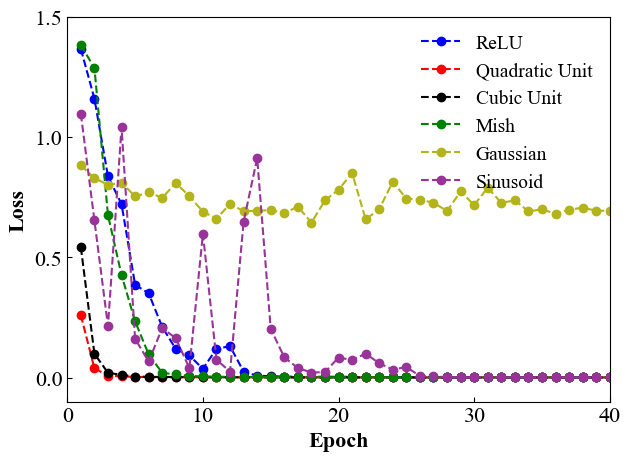

In [144]:
# Activation function
pre_path = 'D:/pythonworkspace/non-monotonic test'
#pos_path = '/acc_train.npy'
pos_path = '/loss.npy'
#pos_path = '/acc_test.npy'
axis_x = np.arange(1, 100 + 1, 1)
b = np.arange(0, 100, 1) # 从0开始间隔为10的等差数列
aa = np.load(pre_path + '/result_9_ReLU' + pos_path)
print(max(aa))
axis_y1 = aa[b]
print(axis_y1.shape)
print(axis_x.shape)
aa = np.load(pre_path + '/Quadratic Unit' + pos_path)
print(max(aa))
axis_y2 = aa[b]
aa = np.load(pre_path + '/Cubic Unit' + pos_path)
print(max(aa))
axis_y3 = aa[b]
aa = np.load(pre_path + '/Mish' + pos_path)
print(max(aa))
axis_y4 = aa[b]
aa = np.load(pre_path + '/Gaussian' + pos_path)
print(max(aa))
axis_y5 = aa[b]
aa = np.load(pre_path + '/Sinusoid' + pos_path)
print(max(aa))
axis_y6 = aa[b]

#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 16}
font2 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 14}
font3 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 14)
fig = plt.figure(figsize = (7, 5))

plt.plot(axis_x * 1, axis_y1, c = 'blue', linestyle = '--', marker = 'o', label = 'ReLU')
plt.plot(axis_x * 1, axis_y2, c = 'red', linestyle = '--', marker = 'o', label = 'Quadratic Unit')
plt.plot(axis_x * 1, axis_y3, c = 'black', linestyle = '--', marker = 'o', label = 'Cubic Unit')
plt.plot(axis_x * 1, axis_y4, c = 'green', linestyle = '--', marker = 'o', label = 'Mish') # 仪器仪表学报
plt.plot(axis_x * 1, axis_y5 / 2, c = (0.7, 0.7, 0.1), linestyle = '--', marker = 'o', label = 'Gaussian')
plt.plot(axis_x * 1, axis_y6 / 1, c = (0.6, 0.2, 0.6), linestyle = '--', marker = 'o', label = 'Sinusoid')

Lg = plt.legend(prop = font3, frameon = False) # display lengend
#plt.legend()
#font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
plt.xlabel('Epoch', fontdict = font1)
#plt.xlabel('训练周期Epoch', FontProperties = font3)
#plt.xlabel('Inference time(ms)', FontProperties = font1)
#plt.ylabel('Loss', fontsize = 14, fontdict = font)
#plt.ylabel('准确率Accuracy', FontProperties = font3)
#plt.ylabel('损失Loss', FontProperties = font3)
plt.ylabel('Loss', fontdict = font1)
x_major_locator = MultipleLocator(10) # x axis interval setting
y_major_locator = MultipleLocator(0.5) # y axis interval setting
ax = plt.gca()
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
plt.xticks(fontproperties = 'Times New Roman', size = 16)
plt.yticks(fontproperties = 'Times New Roman', size = 16)
plt.ylim(-.1, 1.5)
plt.xlim(0, 40)
#y_values=list(range(11))

plt.savefig('E:/工作/IEEE transaction on image processing/pictures/loss示意图.jpg', bbox_inches = 'tight', dpi = 200) # 2025.09.23

plt.show()

1.9799553
(100,)
(100,)
1.9330021
1.8316358
1.6535374
1.8845344
1.4999324
1.6898814
1.962176


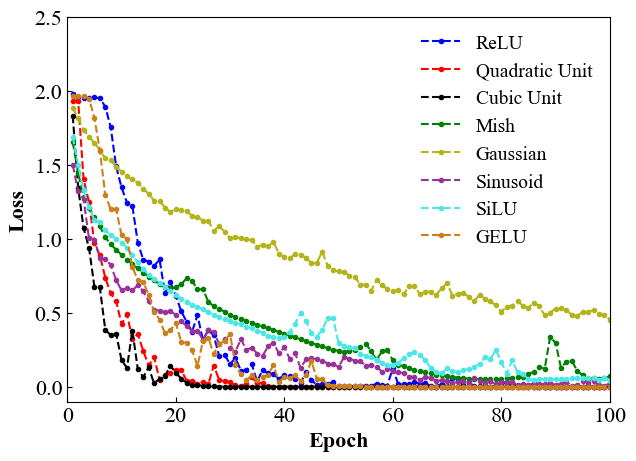

In [100]:
# Activation function new-2026.02.11
pre_path = 'D:/pythonworkspace/non-monotonic test'
#pos_path = '/acc_train.npy'
pos_path = '/loss.npy'
#pos_path = '/acc_test.npy'
axis_x = np.arange(1, 100 + 1, 1)
b = np.arange(0, 100, 1) # 从0开始间隔为10的等差数列
aa = np.load(pre_path + '/ReLU_new' + pos_path)
print(max(aa))
axis_y1 = aa[b]
print(axis_y1.shape)
print(axis_x.shape)
aa = np.load(pre_path + '/Quadratic Unit_new' + pos_path)
print(max(aa))
axis_y2 = aa[b]
aa = np.load(pre_path + '/Cubic Unit_new' + pos_path)
print(max(aa))
axis_y3 = aa[b]
aa = np.load(pre_path + '/Mish_new' + pos_path)
print(max(aa))
axis_y4 = aa[b]
aa = np.load(pre_path + '/Gaussian_new' + pos_path)
print(max(aa))
axis_y5 = aa[b]
aa = np.load(pre_path + '/Sinusoid_new' + pos_path)
print(max(aa))
axis_y6 = aa[b]
aa = np.load(pre_path + '/SiLU' + pos_path)
print(max(aa))
axis_y7 = aa[b]
aa = np.load(pre_path + '/GELU' + pos_path)
print(max(aa))
axis_y8 = aa[b]

#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 16}
font2 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 14}
font3 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 14)
fig = plt.figure(figsize = (7, 5))

plt.plot(axis_x * 1, axis_y1, c = 'blue', linestyle = '--', marker = '.', label = 'ReLU')
plt.plot(axis_x * 1, axis_y2, c = 'red', linestyle = '--', marker = '.', label = 'Quadratic Unit')
plt.plot(axis_x * 1, axis_y3, c = 'black', linestyle = '--', marker = '.', label = 'Cubic Unit')
plt.plot(axis_x * 1, axis_y4, c = 'green', linestyle = '--', marker = '.', label = 'Mish') #
plt.plot(axis_x * 1, axis_y5 / 1, c = (0.7, 0.7, 0.1), linestyle = '--', marker = '.', label = 'Gaussian')
plt.plot(axis_x * 1, axis_y6 / 1, c = (0.6, 0.2, 0.6), linestyle = '--', marker = '.', label = 'Sinusoid')
plt.plot(axis_x * 1, axis_y7 / 1, c = (0.3, 0.9, 0.9), linestyle = '--', marker = '.', label = 'SiLU')
plt.plot(axis_x * 1, axis_y8 / 1, c = (0.8, 0.5, 0.1), linestyle = '--', marker = '.', label = 'GELU')

Lg = plt.legend(prop = font3, frameon = False) # display lengend
#plt.legend()
#font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
plt.xlabel('Epoch', fontdict = font1)
#plt.xlabel('训练周期Epoch', FontProperties = font3)
#plt.xlabel('Inference time(ms)', FontProperties = font1)
#plt.ylabel('Loss', fontsize = 14, fontdict = font)
#plt.ylabel('准确率Accuracy', FontProperties = font3)
#plt.ylabel('损失Loss', FontProperties = font3)
plt.ylabel('Loss', fontdict = font1)
x_major_locator = MultipleLocator(20) # x axis interval setting
y_major_locator = MultipleLocator(0.5) # y axis interval setting
ax = plt.gca()
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
plt.xticks(fontproperties = 'Times New Roman', size = 16)
plt.yticks(fontproperties = 'Times New Roman', size = 16)
plt.ylim(-.1, 2.5)
plt.xlim(0, 100)
#y_values=list(range(11))

plt.savefig('E:/工作/European Journal of Wood and Wood Products/pictures/loss示意图.jpg', bbox_inches = 'tight', dpi = 300) # 2025.09.23

plt.show()

In [ ]:
# data save
print(max(r_w1))
print(type(r_w1))
print(r_w11.shape)

#path = 'E:/pythonworkspace/non-monotonic test/result_1_Quadratic_16_feature_map'
#path = 'E:/pythonworkspace/non-monotonic test/result_2_Quadratic_16_channel'
#path = 'E:/pythonworkspace/non-monotonic test/result_3_Quadratic_16_node'
#path = 'E:/pythonworkspace/non-monotonic test/result_4_Quadratic_16_2'
path = 'E:/pythonworkspace/non-monotonic test/'
np.save(path + '/loss.npy', r_w5)
np.save(path + '/acc_train.npy', r_w6)
np.save(path + '/acc_test.npy', r_w7)
time.asctime()

In [ ]:
# data save
print(max(r_w1))
print(type(r_w1))
print(r_w11.shape)

#path = 'E:/pythonworkspace/non-monotonic test/result_1_Quadratic_16_feature_map'
#path = 'E:/pythonworkspace/non-monotonic test/result_2_Quadratic_16_channel'
#path = 'E:/pythonworkspace/non-monotonic test/result_3_Quadratic_16_node'
#path = 'E:/pythonworkspace/non-monotonic test/result_4_Quadratic_16_2'
path = 'E:/pythonworkspace/non-monotonic test/result_4_Quadratic_16_2'
np.save(path + '/loss.npy', r_w5)
np.save(path + '/acc_train.npy', r_w6)
np.save(path + '/acc_test.npy', r_w7)
time.asctime()

In [ ]:
# data save
print(max(r_w1))
print(type(r_w1))
print(r_w11.shape)

#path = 'E:/pythonworkspace/non-monotonic test/result_1_Quadratic_16_feature_map'
#path = 'E:/pythonworkspace/non-monotonic test/result_2_Quadratic_16_channel'
#path = 'E:/pythonworkspace/non-monotonic test/result_3_Quadratic_16_node'
#path = 'E:/pythonworkspace/non-monotonic test/result_4_Quadratic_16_2'
path = 'E:/pythonworkspace/non-monotonic test/'
np.save(path + '/loss.npy', r_w5)
np.save(path + '/acc_train.npy', r_w6)
np.save(path + '/acc_test.npy', r_w7)
time.asctime()

D:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
D:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


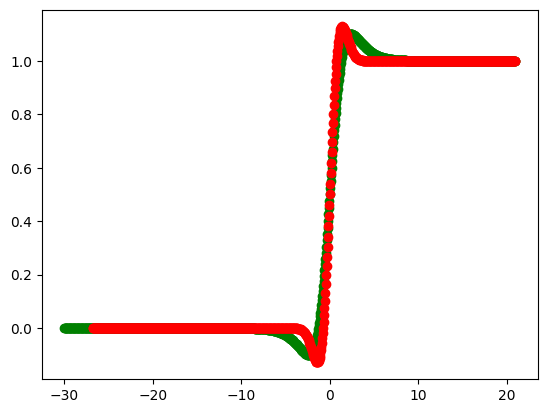

pi: 3.141592653589793
148.41315910257657
148.4131591025766
-0.0499999999998586
0.0


In [30]:
def tanh(x):
    y = (exp(x) - exp(-x)) / (exp(x) + exp(-x))
    return y
def mish(x):
    y = x * tanh(log(1 + exp(x)))
    return y
def sigmoid(x):
    y = 1 / (1 + np.exp(-x))
    return y
axis_x = np.arange(-30, 20 + 1, .05)
axis_x1 = np.arange(-10, 0, .05)
axis_x2 = np.arange(0, 10 + 1, .05)
axis_y1 = 1/2 * np.sin(axis_x) + np.sin(1/2 * axis_x) + np.sin(1/4 * axis_x) + np.sin(1/8 * axis_x) + np.sin(1/16 * axis_x) + np.sin(1/32 * axis_x)
axis_y2 = 2 * (exp(axis_x1) - 1)
axis_y3 = axis_x2
#axis_y2 = axis_x**20
#axis_y3 = 3**axis_x - 2
axis_y4 = axis_x * tanh(log(1 + exp(axis_x)))
axis_y5 = np.sin(axis_x) * sigmoid(axis_x)**2
axis_y6 = mish(mish(mish(axis_x * 0.2 - 0) * 0.2 - 0) * 0.2 - 0)
axis_y7 = axis_x / (1 + exp(-axis_x - 0)) # SiLU or swiwh
axis_y7 = axis_x * sigmoid(axis_x) # SiLU or swiwh
axis_y7_di = sigmoid(axis_x) + axis_x * sigmoid(axis_x) * (1 - sigmoid(axis_x))# SiLU or swiwh
axis_y8 = .5 * axis_x * (1 + tanh((2 / np.pi)**0.5 * (axis_x + .044745 * axis_x**3))) # GELU
axis_y8_di = .5 * (1 + tanh((2 / np.pi)**0.5 * (axis_x + .044745 * axis_x**3))) + axis_x / (2 * np.pi)**0.5 * np.exp(-axis_x**2 / 2)

#print(axis_x)
#print(axis_y)
#plt.scatter(axis_x, axis_y1, c = 'r')
#plt.scatter(axis_x1, axis_y2, c = 'b')
#plt.scatter(axis_x2, axis_y3, c = 'g')
plt.scatter(axis_x, axis_y7_di, c = 'g')
plt.scatter(axis_x, axis_y8_di, c = 'r')
#plt.ylim(-1.2, 10)
#plt.xlim(-20, 20)
plt.show()
print('pi:', np.pi)
print(math.e**5)
print(exp(5))
print(max(axis_x1))
print(min(axis_x2))

In [72]:
# data load
#path = 'E:/pythonworkspace/defect_recognition/results_3classes_360/ModifiedCE_batchsize40'
#path = 'E:/pythonworkspace/defect_recognition/results_3classes_360/ModifiedCE_Var_75_p'
path = 'E:/pythonworkspace/defect_recognition/results_3classes_360/ResNet'
Path = 'E:/pythonworkspace/defect_recognition/results_3classes_360/ResNet/'
r_w1 = np.load(path + '/loss_1.npy')
r_w2 = np.load(path + '/loss_2.npy')
r_w3 = np.load(path + '/loss_3.npy')
r_w6 = np.load(path + '/loss.npy')
r_w7 = np.load(path + '/var_1.npy')
r_w8 = np.load(path + '/var_0.npy')
r_w9 = np.load(path + '/acc_train.npy')
r_w10 = np.load(path + '/acc_test.npy')
r_w11 = np.load(path + '/CM_train.npy')
r_w12 = np.load(path + '/CM_test.npy')
r_w13 = np.load(path + '/score_train.npy')
r_w14 = np.load(path + '/score_test.npy')
print(r_w12.shape)
print(r_w14.shape)
N = 0
print(N)

FileNotFoundError: [Errno 2] No such file or directory: 'E:/pythonworkspace/defect_recognition/results_3classes_360/ResNet/loss_1.npy'

In [10]:
## 模型加载 ##
pre_path = 'E:/pythonworkspace/defect_recognition/activation_test/'
#pos_path = '/epoch_'
#mid_path = 'relu_16_4_3_whole_none/'
#mid_path = 'sin_16_4_3_whole_none/'
mid_path = 'sin_16_4_3_fc_none/'
#mid_path = 'sin_16_4_3_conv_none/'
#mid_path = 'mish_16_4_3_whole_none/'
#mid_path = 'mish_16_4_3_fc_none/'
#mid_path = 'mish_16_4_3_conv_none/'
#mid_path = 'quadratic_16_4_3_whole_none/'
#mid_path = 'quadratic_16_4_3_fc_none/'
#mid_path = 'quadratic_16_4_3_conv_none/'
#mid_path = 'cubic_16_4_3_whole_none/'
#mid_path = 'cubic_16_4_3_fc_none/'
#mid_path = 'cubic_16_4_3_conv_none/'
#mid_path = 'gaussian_16_4_3_whole_none/'
#mid_path = 'gaussian_16_4_3_fc_none/'
#mid_path = 'gaussian_16_4_3_conv_none/'

aa = np.load(pre_path + mid_path + 'acc_test.npy')
t = np.argmax(aa)
print(t)
print(aa[t])
trainResultPath = pre_path + mid_path + 'test' + str(t + 1)
saver.restore(sess, trainResultPath)# 加载到当前环境中
time.asctime()

84
0.8305555515819125
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/activation_test/sin_16_4_3_fc_none/test85


'Fri Nov  1 22:16:33 2024'

In [31]:
dif = np.zeros([75, 1], dtype = np.float32)
for i in range(75):
    t = abs(st3[i] - st1[i])
    dif[i] = np.mean(t)
    print(i + 1, t.shape, dif[i])
#print(dif)
rs = dif.shape
print('dif:', rs)
# ploting
axis_x = np.arange(0, rs[0] + 0, 1)
#print(axis_x)
print(axis_x.shape)
axis_y = dif[axis_x, 0]
print(axis_y.shape)

#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size':12}
font2 = font_manager.FontProperties(fname = (r'C:\Windows\Fonts\simsun.ttc'), weight = 'bold', size = 20)

fig, ax = plt.subplots(1, 1, figsize = (4, 5))

#plt.xlabel('Layer', fontsize = 14, fontdict = font)
plt.xlabel('层数', FontProperties = font2)
plt.ylabel('增量绝对值', FontProperties = font2)
x_major_locator = MultipleLocator(5) # x axis interval setting
y_major_locator = MultipleLocator(1 / 10**4) # y axis interval setting
ax = plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
#Lg = plt.legend(prop = font) # display lengend
#x_labels = ['500', '1000', '1500', '2000']
plt.xticks(fontproperties = 'Times New Roman', size = 16)
plt.yticks(fontproperties = 'Times New Roman', size = 16)
plt.ylim(0, 3 / 10**4)
plt.xlim(19.5, 50.5)
Width = 0.5
r1 = ax.bar(axis_x, axis_y, ec = 'k', color = 'white', width = Width, label = 'Single-13', hatch = '...')
plt.savefig('增量示意图GoogleNet.jpg', bbox_inches = 'tight', dpi = 200)
plt.show()

NameError: name 'st3' is not defined

In [37]:
# testing def
def compute_accuracy_single(v_xs, v_ys, interv, show_en, save_en):
    s_start = time.perf_counter()
    #y_pre = sess.run([Pre, p1, p2, p3, p4, Acc, D_cls], feed_dict = {X: v_xs, Y: v_ys, keep_prob:1}) # discriminator训练
    y_pre = sess.run([Pre, p, Acc, D_cls], feed_dict = {X: v_xs, Y: v_ys, keep_prob:1}) # discriminator训练
    s_end = time.perf_counter()
    #print('Time used per image(ms):', (s_end - s_start) / interv * 1000)
    rel = tf.argmax(v_ys, 3, output_type = tf.int32)
    correct_prediction = tf.equal(Pre, rel) # comparison between pre and real
    #print(correct_prediction)
    #print(y_pre[6])
    #scr = np.sum(y_pre[6] * v_ys, 3)
    scr = np.sum(y_pre[3] * v_ys, 3)

    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32)) # accuracy calculation
    #print('accuracy:', accuracy)
    nn = 1 # image No.
    No = 'ph1'
    ofd = 0 # feature No.
    #show_en = 0
    #save_en = 0
    if show_en == 1:
        print('OK')
        img = v_xs[nn, :, :, :]
        raw = v_xs[nn, :, :, :]
        #plt.imshow(img, cmap = 'Greys_r') # sample image display
        plt.imshow(img) # sample image display
        plt.axis('off') # 不显示坐标轴
        plt.show()
        #path = 'E:/pythonworkspace/defect_recognition/result_Var1_0.6_Var0_2/p2_'
        path = 'E:/pythonworkspace/defect_recognition/result_GoogleNet2/p2_'
        if save_en == 1:
            mpimg.imsave(path + No + '_%d.jpg'%(0), img, cmap = 'Greys_r')
        k = 0
        for i in range(1): # index for level of feature map
            sp = y_pre[1][0].shape # acquire dimension of feature map
            print('sp:', sp)
            for j in range(8): # index for type of feature map(4 types in this test)
                k = k + 1
                print('i:', i + 1, 'j:', j + 1)
                #img = y_pre[i + 1][nn, :, :, int(sp[3] / 4) * j + ofd]
                #img = y_pre[i + 2][nn, :, :, 1 * j + ofd]
                #img = y_pre[i + 1][nn, 1:223, 1:223, 2 * j + ofd]
                #img = y_pre[i + 1][nn, 2:110, 2:110, 1 * j + ofd]
                img = y_pre[1][2][nn, 3:53, 3:53, 1 * j + ofd]
                #img = y_pre[i + 3][nn, 4:24, 4:24, 1 * j + ofd]
                #img = y_pre[i + 5][nn, 2:12, 2:12, 4 * j + ofd]
 
                fea = y_pre[1][1][nn, 2:110, 2:110, :]
                #fea = y_pre[i + 2][nn, 3:53, 3:53, :]
                #fea = y_pre[i + 3][nn, 4:24, 4:24, :]
                #fea = y_pre[i + 4][nn, 5:9, 5:9, :]
                m = np.mean(fea, (0, 1))
                v = np.std(fea, (0, 1))
                print('m:', m.shape)
                print('v:', v.shape)
                fea2 = (fea - m) / (v + 1e-5)
                var = np.var(fea2)
                print('mean map:', np.std(fea, (0, 1)).shape)
                print('feature map:', fea2.shape)
                print('var:', var)
                
                I2 = Image.fromarray((img / np.max(img) * 255).astype('uint8'))
                S = [224, 224]
                I3 = I2.resize(S)
                I4 = np.array(I3, dtype = float32) / 255
                #plt.imshow(I4, cmap = 'Greys_r') # feature map display
                #plt.show()
                
                img = fea2[:, :, 1 * j + ofd] # 2025.02.25
                img_abs = img * (img > 0)
                img_abs2 = img * (img < 0)
                img_abs = np.abs(img)
                print(img.shape, img_abs.shape, img_abs.dtype)
                print('max:', np.max(img), 'min:', np.min(img))
                print('abs_max:', np.max(img_abs), 'abs_min:', np.min(img_abs))
                print('abs_max2:', np.max(img_abs2), 'abs_min2:', np.min(img_abs2))
                t = (img - np.min(img)) / (np.max(img) - np.min(img))
                print('max t:', np.max(t))
                print('min t:', np.min(t))
                t2 = t * (t > 0.5)
                plt.imshow(t2, cmap = 'Greys_r') # feature map display
                #plt.imshow(img) # feature map display
                #plt.axis('off') # 不显示坐标轴
                plt.show()
                #x, y = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1]))
                #fig = plt.figure()
                #ax = fig.add_subplot(111, projection = '3d')
                #ax.plot_surface(x, y, img, label = 'Red')  # Red channel
                
                plt.imshow(img_abs, cmap = 'Greys_r') # feature map display
                #plt.imshow(img_abs) # feature map display
                plt.show()
                #plt.imshow(img_abs2, cmap = 'Greys_r') # feature map display
                #plt.imshow(img_abs2) # feature map display
                #plt.show()
                if save_en == 1:
                    mpimg.imsave(path + No + '_%d.jpg'%(k), img, cmap = 'Greys_r')
    
    result = sess.run([accuracy, Pre, rel, Acc], feed_dict = {X: v_xs, Y: v_ys, keep_prob:1}) # discriminator训练
    #print('acc', result[0])
    #print('acc2', result[3])
    return result, scr

def compute_accuracy_single2(v_xs, interv, show_en, save_en):
    s_start = time.perf_counter()
    #Pre = tf.argmax(D_cls, 3)
    y_pre = sess.run([Pre], feed_dict = {X: v_xs, keep_prob:1}) # discriminator训练
    s_end = time.perf_counter()
    t_consumed = (s_end - s_start) / interv * 1000
    print('Time used per image(ms):', t_consumed)
    
    nn = 0 # image No.
    No = 'ph1'
    ofd = 0 # feature No.
    #show_en = 1
    #save_en = 0
    if show_en == 1:
        img = v_xs[nn, :, :, :]
        #plt.imshow(img, cmap = 'Greys_r') # sample image display
        plt.imshow(img) # sample image display
        plt.axis('off') # 不显示坐标轴
        plt.show()
        #path = 'E:/pythonworkspace/defect_recognition/result_Var1_0.6_Var0_2/p2_'
        path = 'E:/pythonworkspace/defect_recognition/result_GoogleNet2/p2_'
        if save_en == 1:
            mpimg.imsave(path + No + '_%d.jpg'%(0), img, cmap = 'Greys_r')
        k = 0
        for i in range(1): # index for level of feature map
            sp = y_pre[i + 1].shape # acquire dimension of feature map
            print('sp:', sp)
            for j in range(16): # index for type of feature map(4 types in this test)
                k = k + 1
                #img = y_pre[i + 1][nn, :, :, int(sp[3] / 4) * j + ofd]
                #img = y_pre[i + 1][nn, 2:110, 2:110, 2 * j + ofd]
                #img = y_pre[i + 2][nn, 2:52, 2:52, 1 * j + ofd]
                img = y_pre[i + 2][nn, 2:26, 2:26, 2 * j + ofd]
                #img = y_pre[i + 4][nn, 4:24, 4:24, 4 * j + ofd]
                #img = y_pre[i + 5][nn, 2:12, 2:12, 4 * j + ofd]
                plt.imshow(img, cmap = 'Greys_r') # feature map display
                #plt.imshow(img) # feature map display
                #plt.axis('off') # 不显示坐标轴
                plt.show()
                print('i:', i + 1, 'j:', j + 1)
                if save_en == 1:
                    mpimg.imsave(path + No + '_%d.jpg'%(k), img, cmap = 'Greys_r')
    return t_consumed

In [38]:
# testing
x_Test = x_test_224
#x_Test = x_All[600:800]
#x_Test = x_train_224
#x_Test = x_test_Larger
#x_Test = x_test_Smaller

y_Test = y_test
#y_Test = y_All[600:800]
#y_Test = y_train
#y_Test_b1 = y_test_b1
#y_Test_b2 = y_test_b2
#y_Test_b3 = y_test_b3
#y_Test = y_train

#x_total = x_Test[0:360]
#y_total = y_Test[0:360]

#x_total = x_Test[360:720]
#y_total = y_Test[360:720]

#x_total = x_Test[720:1080]
#y_total = y_Test[720:1080]

#x_total = x_Test[1080:1440]
#y_total = y_Test[1080:1440]

x_total = x_Test
y_total = y_Test

VAL = x_total.shape
#print(y_total[0:10])
a1 = 20
#a1 = 126
#a1 = 184
#a1 = 274
#a1 = 216
interv = 1
a2 = a1 + interv

Pre = tf.argmax(D_cls, 3, output_type = tf.int32)
#Pre = tf.argmax(D_cls, 3, dtype = tf.int64)
#Pre1 = tf.argmax(D_cls1, 3)
#Pre2 = tf.argmax(D_cls2, 3)
#Pre3 = tf.argmax(D_cls3, 3)
print('D_cls:', D_cls)
#print('D_cls1:', D_cls1)
#print('D_cls2:', D_cls2)
#print('D_cls3:', D_cls3)
print('Pre:', Pre)
#print('Pre1:', Pre1)
#print('Pre2:', Pre2)
#print('Pre3:', Pre3)
s1 = time.perf_counter()
acc = compute_accuracy_single2(x_total[a1:a2], interv, 0, 0)
acc = compute_accuracy_single2(x_total[a1:a2], interv, 0, 0)
acc = compute_accuracy_single2(x_total[a1:a2], interv, 0, 0)
acc = compute_accuracy_single2(x_total[a1:a2], interv, 0, 0)
acc = compute_accuracy_single(x_total[a1:a2], y_total[a1:a2], interv, 0, 0)
s2 = time.perf_counter()
print('Time used:', s2 - s1)
print('\033[1;31;46m%s\033[0m '% 'accuracy:', acc[0][0])
print('\033[1;31;46m%s\033[0m '% 'Pre:', acc[0][1].shape) # scores of each sample
print('\033[1;31;46m%s\033[0m '% 'Rel:', acc[0][2].shape) # scores of each sample
print('\033[1;31;46m%s\033[0m '% 'score:', acc[1].shape) # scores of each sample
#print('\033[1;31;46m%s\033[0m '% 'img:', acc[2].shape) # img
print('number of samples', VAL[0])
#print('shape of vector', np.max(acc[4]))
#print('shape of vector', np.max(acc[5]))
time.asctime()

D_cls: Tensor("cls0:0", shape=(None, 1, 1, 7), dtype=float32)
Pre: Tensor("ArgMax_2:0", shape=(None, 1, 1), dtype=int32)
Time used per image(ms): 173.4599999999773
Time used per image(ms): 7.606600000144681
Time used per image(ms): 7.447800000591087
Time used per image(ms): 7.349900000917842
Time used: 0.3932593999998062
accuracy:  1.0
Pre:  (1, 1, 1)
Rel:  (1, 1, 1)
score:  (1, 1, 1)
number of samples 504


'Tue Feb 10 22:52:30 2026'

[ 57. 117. 332. 249.  72.  73. 204. 130.  24. 189.] (360, 224, 224, 3) (360, 1, 1, 4)
D_cls: Tensor("cls0_1:0", shape=(None, 1, 1, 4), dtype=float32)
Pre: Tensor("ArgMax_14:0", shape=(None, 1, 1), dtype=int32)
Time used per image(ms): 5.805175000023155
Time used per image(ms): 7.600450000063574
Time used per image(ms): 3.6189949999425153
Time used per image(ms): 2.311825000015233
OK


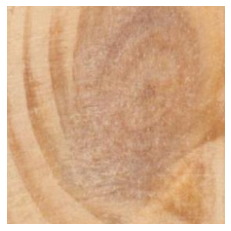

sp: (20, 112, 112, 32)
i: 1 j: 1
m: (32,)
v: (32,)
mean map: (32,)
feature map: (108, 108, 32)
var: 0.49883255
(108, 108) (108, 108) float32
max: 0.0 min: 0.0
abs_max: 0.0 abs_min: 0.0
abs_max2: 0.0 abs_min2: 0.0
max t: nan
min t: nan


D:\anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: invalid value encountered in true_divide


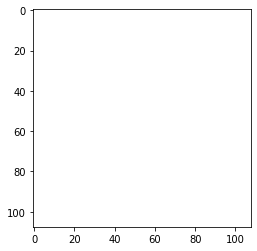

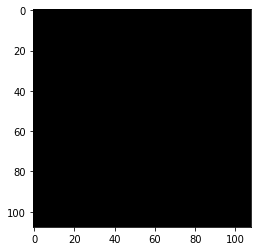

i: 1 j: 2
m: (32,)
v: (32,)
mean map: (32,)
feature map: (108, 108, 32)
var: 0.49883255
(108, 108) (108, 108) float32
max: 4.770485 min: -3.3372414
abs_max: 4.770485 abs_min: 0.00046139088
abs_max2: 0.0 abs_min2: -3.3372414
max t: 1.0
min t: 0.0


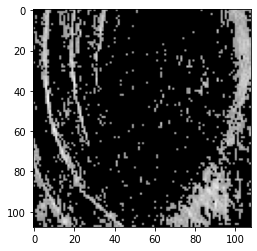

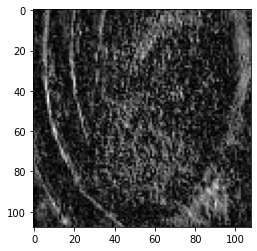

i: 1 j: 3
m: (32,)
v: (32,)
mean map: (32,)
feature map: (108, 108, 32)
var: 0.49883255
(108, 108) (108, 108) float32
max: 0.0 min: 0.0
abs_max: 0.0 abs_min: 0.0
abs_max2: 0.0 abs_min2: 0.0
max t: nan
min t: nan


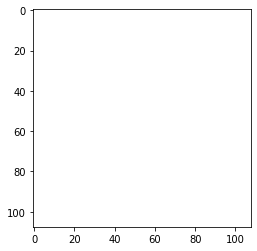

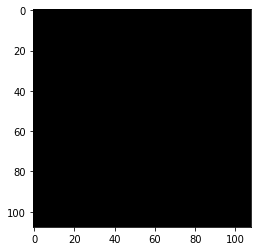

i: 1 j: 4
m: (32,)
v: (32,)
mean map: (32,)
feature map: (108, 108, 32)
var: 0.49883255
(108, 108) (108, 108) float32
max: 3.682424 min: -2.754531
abs_max: 3.682424 abs_min: 8.710901e-05
abs_max2: 0.0 abs_min2: -2.754531
max t: 1.0
min t: 0.0


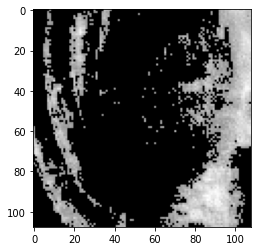

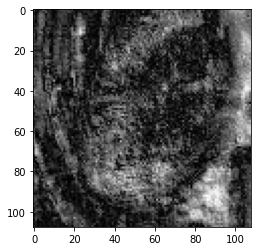

i: 1 j: 5
m: (32,)
v: (32,)
mean map: (32,)
feature map: (108, 108, 32)
var: 0.49883255
(108, 108) (108, 108) float32
max: 0.0 min: 0.0
abs_max: 0.0 abs_min: 0.0
abs_max2: 0.0 abs_min2: 0.0
max t: nan
min t: nan


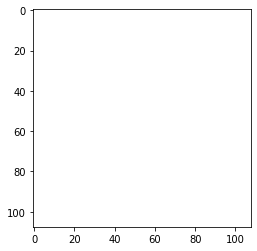

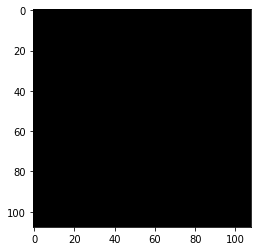

i: 1 j: 6
m: (32,)
v: (32,)
mean map: (32,)
feature map: (108, 108, 32)
var: 0.49883255
(108, 108) (108, 108) float32
max: 0.0 min: 0.0
abs_max: 0.0 abs_min: 0.0
abs_max2: 0.0 abs_min2: 0.0
max t: nan
min t: nan


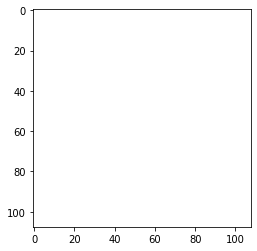

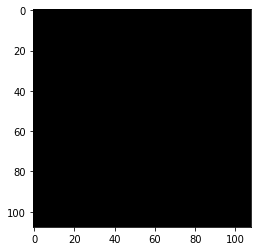

i: 1 j: 7
m: (32,)
v: (32,)
mean map: (32,)
feature map: (108, 108, 32)
var: 0.49883255
(108, 108) (108, 108) float32
max: 0.0 min: 0.0
abs_max: 0.0 abs_min: 0.0
abs_max2: 0.0 abs_min2: 0.0
max t: nan
min t: nan


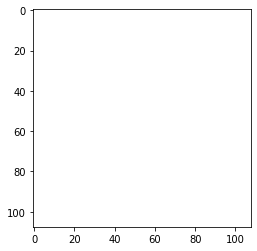

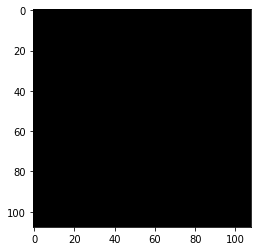

i: 1 j: 8
m: (32,)
v: (32,)
mean map: (32,)
feature map: (108, 108, 32)
var: 0.49883255
(108, 108) (108, 108) float32
max: 3.3146133 min: -3.4843535
abs_max: 3.4843535 abs_min: 8.9502784e-05
abs_max2: 0.0 abs_min2: -3.4843535
max t: 1.0
min t: 0.0


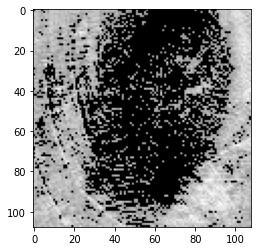

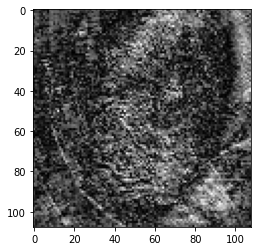

Time used: 2.0958824999997887
accuracy:  0.95
Pre:  (20, 1, 1)
Rel:  (20, 1, 1)
score:  (20, 1, 1)
number of samples 360


'Fri Apr 11 17:02:07 2025'

In [76]:
# testing 2
x_Test = x_test_224
#x_Test = x_All[600:800]
#x_Test = x_train_224
#x_Test = x_test_Larger
#x_Test = x_test_Smaller

y_Test = y_test
#y_Test = y_All[600:800]
#y_Test = y_train
#y_Test_b1 = y_test_b1
#y_Test_b2 = y_test_b2
#y_Test_b3 = y_test_b3
#y_Test = y_train
VAL = x_Test.shape
arr = rand_array(0, VAL[0] - 1, VAL[0]) # 生成随机数
print(arr[0, 0:10], x_Test.shape, y_Test.shape)

x_total = array_assign(x_Test, arr)
y_total = array_assign(y_Test, arr)
#y_total_b1 = array_assign(y_Test_b1, arr)
#y_total_b2 = array_assign(y_Test_b2, arr)
#y_total_b3 = array_assign(y_Test_b3, arr)

x_total = x_Test
y_total = y_Test

#print(y_total[0:10])
a1 = 200
#a1 = 216
interv = 20
a2 = a1 + interv

Pre = tf.argmax(D_cls, 3, output_type = tf.int32)
#Pre = tf.argmax(D_cls, 3, dtype = tf.int64)
#Pre1 = tf.argmax(D_cls1, 3)
#Pre2 = tf.argmax(D_cls2, 3)
#Pre3 = tf.argmax(D_cls3, 3)
print('D_cls:', D_cls)
#print('D_cls1:', D_cls1)
#print('D_cls2:', D_cls2)
#print('D_cls3:', D_cls3)
print('Pre:', Pre)
#print('Pre1:', Pre1)
#print('Pre2:', Pre2)
#print('Pre3:', Pre3)
s1 = time.clock()
acc = compute_accuracy_single2(x_total[a1:a2], interv, 0, 0)
acc = compute_accuracy_single2(x_total[a1:a2], interv, 0, 0)
acc = compute_accuracy_single2(x_total[a1:a2], interv, 0, 0)
acc = compute_accuracy_single2(x_total[a1:a2], interv, 0, 0)
acc = compute_accuracy_single(x_total[a1:a2], y_total[a1:a2], interv, 1, 0)
s2 = time.clock()
print('Time used:', s2 - s1)
print('\033[1;31;46m%s\033[0m '% 'accuracy:', acc[0][0])
print('\033[1;31;46m%s\033[0m '% 'Pre:', acc[0][1].shape) # scores of each sample
print('\033[1;31;46m%s\033[0m '% 'Rel:', acc[0][2].shape) # scores of each sample
print('\033[1;31;46m%s\033[0m '% 'score:', acc[1].shape) # scores of each sample
print('number of samples', VAL[0])
#print('shape of vector', np.max(acc[4]))
#print('shape of vector', np.max(acc[5]))
time.asctime()

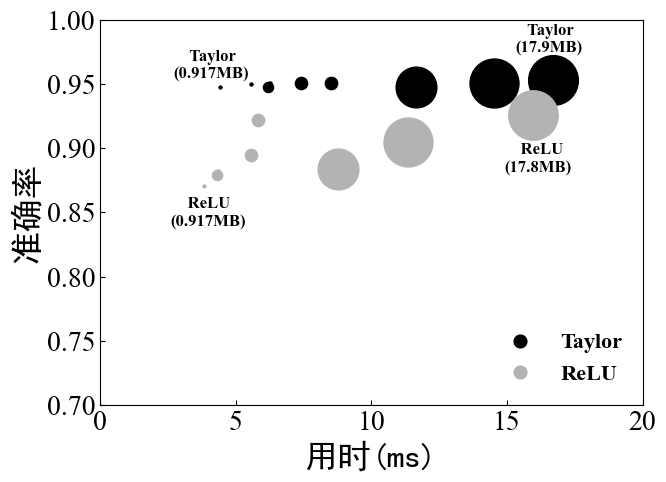

In [7]:
# 成功率VS速度 2025.06.21
from matplotlib.font_manager import FontProperties
# 3 Network scaling
#pre_path = 'E:/pythonworkspace/defect_recognition/results_3classes_360'
#pos_path = '/acc_train.npy'
pos_path = '/loss.npy'
#pos_path = '/acc_test.npy'
# Taylor
axis_x1 = np.array([4.41, 6.19, 11.64, 5.56, 7.41, 14.53, 6.28, 8.52, 16.70])
axis_y1 = np.array([0.948, 0.948, 0.948, 0.950, 0.951, 0.951, 0.951, 0.951, 0.953])
axis_z1 = np.array([0.917, 3.668, 14.663, 1.102, 4.406, 17.614, 1.114, 4.452, 17.899])
# ReLU
axis_x2 = np.array([3.85, 4.32, 8.78, 4.36, 5.57, 11.34, 474, 5.84, 15.98])
axis_y2 = np.array([0.871, 0.879, 0.884, 0.882, 0.895, 0.905, 0.910, 0.922, 0.926])
axis_z2 = np.array([0.917, 3.665, 14.659, 1.101, 4.403, 17.608, 1.113, 4.449, 17.793])
b = np.arange(0, 100, 5) # 从0开始间隔为10的等差数列

#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

plt.rcParams['font.sans-serif'] = 'SimHei' # 2025.09.25 用于木材大会ppt

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 12}
font4 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 16}
font2 = font_manager.FontProperties(fname = (r'C:\Windows\Fonts\simsun.ttc'), weight = 'bold', size = 20)
font3 = font_manager.FontProperties(fname = r'D:\pythonworkspace\times+simsun.ttf', weight = 'bold', size = 16)
font5 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 28)
#font5 = FontProperties(fname = 'D:\pythonworkspace\times+simsun.ttf')  

fig = plt.figure(figsize = (7, 5))
#[0 for i in range(15)]
plt.plot(axis_x1[0], axis_y1[0], c = (0, 0, 0), linestyle = '', marker = 'o', markersize = axis_z1[0] * 2, label = 'Taylor')
plt.plot(axis_x2[0], axis_y2[0], c = (0.7, 0.7, 0.7), linestyle = '', marker = 'o', markersize = axis_z2[0] * 2, label = 'ReLU')
for i in range(9):
    plt.plot(axis_x1[i], axis_y1[i], c = (0, 0, 0), linestyle = '', marker = 'o', markersize = axis_z1[i] * 2)
    plt.plot(axis_x2[i], axis_y2[i], c = (0.7, 0.7, 0.7), linestyle = '', marker = 'o', markersize = axis_z2[i] * 2)
plt.text(15.3, 0.975, '   Taylor\n(17.9MB)', fontdict = font1, color = 'k')
plt.text(2.7, 0.955, '    Taylor\n(0.917MB)', fontdict = font1, color = 'k')
plt.text(14.9, 0.882, '    ReLU\n(17.8MB)', fontdict = font1, color = 'k')
plt.text(2.6, 0.84, '    ReLU\n(0.917MB)', fontdict = font1, color = 'k')


Lg = plt.legend(prop = font4, frameon = False, loc = 'lower right', markerscale = 5) # display lengend
#plt.legend()
#font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
#plt.xlabel('Time per image (ms)', fontdict = font4)
plt.xlabel('用时(ms)', size = 24)
#plt.xlabel('Inference time(ms)', FontProperties = font1)
#plt.ylabel('Loss', fontsize = 14, fontdict = font)
plt.ylabel('准确率', size = 24)
#plt.ylabel('损失Loss', FontProperties = font3)
#plt.ylabel('Accuracy', fontdict = font4)
x_major_locator = MultipleLocator(5) # x axis interval setting
y_major_locator = MultipleLocator(0.05) # y axis interval setting
ax = plt.gca()
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
plt.xticks(fontproperties = 'Times New Roman', size = 20)
plt.yticks(fontproperties = 'Times New Roman', size = 20)
plt.ylim(0.7, 1.0)
plt.xlim(0, 20)
#y_values=list(range(11))

#plt.savefig('E:/工作/农业工程学报/loss示意图1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/农业工程学报/acc_train1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/仪器仪表学报/acc_train1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作\第四届木材科学大会/fig/Acc vs time for NS.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
plt.savefig('E:/工作/2024十四五/2025年终总结/pictures/Acc vs time for NS.jpg', bbox_inches = 'tight', dpi = 200) # 2025.11.03
#plt.grid(True)
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Acc vs time.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
plt.show()

###### I = x_Test[0, :, :, :]

I2 = Image.fromarray((I * 255).astype('uint8'))
S = [700, 300]
I3 = I2.resize(S)
I4 = np.array(I3, dtype = float32) / 255
plt.imshow(I4, cmap = 'Greys_r') # feature map display
plt.show()

In [39]:
# testing all
print(VAL[0])
a1 = 0
interval = 72
a2 = a1 + interval
i = 0
s1 = time.perf_counter()
while a2 < VAL[0]:
    a1 = i * interval # start point
    a2 = np.min([a1 + interval, val[0]]) # end point
    #acc = compute_accuracy_single(x_total[a1:a2], y_total[a1:a2], y_total_b1[a1:a2], y_total_b2[a1:a2], y_total_b3[a1:a2], interv, 0, 0)
    acc = compute_accuracy_single(x_total[a1:a2], y_total[a1:a2], interv, 0, 0)
    if i == 0:
        count = acc[0][0] * (a2 - a1) # number of correct results
        y_pre = acc[0][1] # predict vector
        y_real = acc[0][2] # real vector
        pre_s = acc[1] # real scores
    if i > 0:
        count = count + acc[0][0] * (a2 - a1)
        y_pre = np.concatenate((y_pre, acc[0][1]), 0)
        y_real = np.concatenate((y_real, acc[0][2]), 0)
        pre_s = np.concatenate((pre_s, acc[1]), 0)
    i = i + 1
    print('No.', i, 'Interval:', a1, a2, acc[0][0])
acc_t = count / VAL[0]
s2 = time.perf_counter()
print('Time used:', s2 - s1)
print('\033[1;31;46m%s\033[0m '% 'accuracy:{:.7}'.format(acc_t))
print('\033[1;31;46m%s\033[0m '% 'accuracy:', acc_t)
#print('L_cls: {:.4}'.format(result1[1]))
print('number of samples', VAL[0])
print('max of vector', np.max(y_pre))
print('max of vector', np.max(y_real))
pre_s2 = np.reshape(pre_s, [-1])
print('All scores', pre_s2.shape)
print('All scores', pre_s2)
#print('y_total', y_total)
re3 = pre_s2
time.asctime()

504
No. 1 Interval: 0 72 0.9305556
No. 2 Interval: 72 144 0.8611111
No. 3 Interval: 144 216 0.8472222
No. 4 Interval: 216 288 0.6527778
No. 5 Interval: 288 360 0.7638889
No. 6 Interval: 360 432 0.9027778
No. 7 Interval: 432 504 0.9583333
Time used: 1.366939800000182
accuracy:0.8452381 
accuracy:  0.8452380980764117
number of samples 504
max of vector 6
max of vector 6
All scores (504,)
All scores [9.99413610e-01 9.99733388e-01 9.99890447e-01 9.99958038e-01
 9.99948025e-01 9.98119056e-01 9.99981761e-01 9.99958396e-01
 9.81291056e-01 1.12691696e-05 9.99931216e-01 9.99679089e-01
 9.99970317e-01 9.99948740e-01 9.99959350e-01 9.99853969e-01
 9.99971867e-01 9.99804676e-01 9.99689579e-01 9.99956131e-01
 9.99971509e-01 9.99975443e-01 9.99968767e-01 9.84203219e-01
 9.99249279e-01 9.99974370e-01 9.99959826e-01 9.99834418e-01
 9.99958634e-01 9.99970317e-01 9.99952078e-01 9.99955058e-01
 9.99935031e-01 3.28129972e-03 9.99985099e-01 9.99981642e-01
 9.99889493e-01 9.99918818e-01 9.99951839e-01 9.998

'Tue Feb 10 22:52:56 2026'

In [170]:
## All sample predict values for each single epoch ##
pre_path = 'E:/pythonworkspace/defect_recognition/results-3classes'
pos_path = '/epoch_'
mid_path = '/result_GoogleNet2'
for j in range(100):
    trainResultPath = pre_path + mid_path + pos_path + str(j + 1)
    saver.restore(sess, trainResultPath)# 加载到当前环境中
    VAL = x_Test.shape
    a1 = 0
    interval = 20
    a2 = a1 + interval
    i = 0
    print('j:', j)
    s1 = time.clock()
    while a2 < VAL[0]:
        a1 = i * interval # start point
        a2 = np.min([a1 + interval, val[0]]) # end point
        acc = compute_accuracy_single(x_total[a1:a2], y_total[a1:a2], interv, 0, 0)
        if i == 0:
            count = acc[0][0] * (a2 - a1) # number of correct results
            y_pre = acc[0][1] # predict vector
            y_real = acc[0][2] # real vector
            pre_s = acc[1] # real scores
        if i > 0:
            count = count + acc[0][0] * (a2 - a1)
            y_pre = np.concatenate((y_pre, acc[0][1]), 0)
            y_real = np.concatenate((y_real, acc[0][2]), 0)
            pre_s = np.concatenate((pre_s, acc[1]), 0)
        i = i + 1
        #print('No.', i, 'Interval:', a1, a2, acc[0][0])
    acc_t = count / VAL[0]
    if j == 0:
        r = pre_s.reshape(-1, 1)
    if j > 0:
        r = np.concatenate((r, pre_s.reshape(-1, 1)), 1)
    s2 = time.clock()
    print('Time used:', s2 - s1)
    print('\033[1;31;46m%s\033[0m '% 'accuracy:{:.4}'.format(acc_t))
    print('All scores', r.shape)
time.asctime()
print('r:', r.shape)

INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_1
j: 0
Time used: 9.216792800001713
accuracy:0.3333 
All scores (360, 1)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_2
j: 1
Time used: 9.17183870000008
accuracy:0.3333 
All scores (360, 2)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_3
j: 2
Time used: 9.164689900000667
accuracy:0.3333 
All scores (360, 3)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_4
j: 3
Time used: 9.182870000000548
accuracy:0.3333 
All scores (360, 4)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_5
j: 4
Time used: 9.186275700001715
accuracy:0.3333 
All scores (360, 5)
INFO:tensorflow:Restoring param

j: 39
Time used: 12.018996999999217
accuracy:0.5389 
All scores (360, 40)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_41
j: 40
Time used: 11.866154200000892
accuracy:0.4972 
All scores (360, 41)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_42
j: 41
Time used: 12.62675870000021
accuracy:0.5361 
All scores (360, 42)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_43
j: 42
Time used: 12.839567499999248
accuracy:0.4861 
All scores (360, 43)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_44
j: 43
Time used: 12.04439480000292
accuracy:0.5 
All scores (360, 44)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_45
j: 44
Time used

j: 78
Time used: 16.1697972999973
accuracy:0.6111 
All scores (360, 79)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_80
j: 79
Time used: 16.016113400000904
accuracy:0.6194 
All scores (360, 80)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_81
j: 80
Time used: 15.43237930000032
accuracy:0.675 
All scores (360, 81)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_82
j: 81
Time used: 16.45768809999936
accuracy:0.5889 
All scores (360, 82)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_83
j: 82
Time used: 14.74610390000089
accuracy:0.5528 
All scores (360, 83)
INFO:tensorflow:Restoring parameters from E:/pythonworkspace/defect_recognition/results-3classes/result_GoogleNet2/epoch_84
j: 83
Time used:

In [40]:
# F1-mean calculation
y_pre = y_pre.reshape(y_pre.shape[0])
y_real = y_real.reshape(y_real.shape[0])
print(type(y_real), y_real.dtype, y_real.shape, y_pre.shape, np.max(y_real))
cm = confusion_matrix(y_real, y_pre)
#np.save('cm_inceptin', cm)
#np.save('y_pre_inceptin', y_pre)
#np.save('y_real_inceptin', y_real)
cm1 = np.sum(cm, axis = 0) # TP + FP
cm2 = np.sum(cm, axis = 1) # TP + FN
np.set_printoptions(precision = 2)
cm_normalized = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
#cm_normalized = cm
dia = np.diagonal(cm)
#print(cm, cm1, cm2)
print('dia', dia)
print('precision', dia / cm1)
print('precision_mean', np.mean(dia / cm1))
print('recall', dia / cm2)
print('recall_mean', np.mean(dia / cm2))
print('F1', dia * 2 / (cm1 + cm2))
print('F1_mean', np.mean(dia * 2 / (cm1 + cm2)))
print(cm)
print(cm.shape)

<class 'numpy.ndarray'> int32 (504,) (504,) 6
dia [67 62 61 47 55 65 69]
precision [0.89 0.76 0.82 0.85 0.75 0.96 0.9 ]
precision_mean 0.8476730828225774
recall [0.93 0.86 0.85 0.65 0.76 0.9  0.96]
recall_mean 0.8452380952380951
F1 [0.91 0.81 0.84 0.74 0.76 0.93 0.93]
F1_mean 0.8436999949410238
[[67  1  4  0  0  0  0]
 [ 0 62  2  5  3  0  0]
 [ 3  1 61  1  0  3  3]
 [ 2  5  2 47 14  0  2]
 [ 1 13  1  2 55  0  0]
 [ 2  0  1  0  1 65  3]
 [ 0  0  3  0  0  0 69]]
(7, 7)


In [17]:
# F1-mean justing new model
cm = np.zeros([4, 4])
#cm[0, :] = np.array([100, 20, 0]) # modify
#cm[1, :] = np.array([16, 85, 19]) # modify
#cm[2, :] = np.array([0, 0, 120]) # modify
# ReLU
#cm[0, :] = np.array([305, 6, 55, 0]) # modify
#cm[1, :] = np.array([43, 309, 8, 0]) # modify
#cm[2, :] = np.array([0, 0, 291, 69]) # modify
#cm[3, :] = np.array([0, 0, 12, 348]) # modify
# Taylor 2
#cm[0, :] = np.array([325, 0, 35, 0]) # modify
#cm[1, :] = np.array([36, 321, 3, 0]) # modify
#cm[2, :] = np.array([0, 0, 360, 0]) # modify
#cm[3, :] = np.array([0, 0, 0, 360]) # modify
# Taylor 6
cm[0, :] = np.array([353, 7, 0, 0]) # modify
cm[1, :] = np.array([24, 322, 14, 0]) # modify
cm[2, :] = np.array([0, 0, 360, 0]) # modify
cm[3, :] = np.array([0, 0, 0, 360]) # modify

#np.save('cm_inceptin', cm)
#np.save('y_pre_inceptin', y_pre)
#np.save('y_real_inceptin', y_real)
cm1 = np.sum(cm, axis = 0) # TP + FP
cm2 = np.sum(cm, axis = 1) # TP + FN
np.set_printoptions(precision = 2)
cm_normalized = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
#cm_normalized = cm
dia = np.diagonal(cm)
#print(cm, cm1, cm2)
print('dia', dia)
print('precision', dia / cm1)
print('precision_mean', np.mean(dia / cm1))
print('recall', dia / cm2)
print('recall_mean', np.mean(dia / cm2))
print('F1', dia * 2 / (cm1 + cm2))
print('F1_mean', np.mean(dia * 2 / (cm1 + cm2)))
print(cm)
print(cm.shape)

dia [353. 322. 360. 360.]
precision [0.94 0.98 0.96 1.  ]
precision_mean 0.9694074429303811
recall [0.98 0.89 1.   1.  ]
recall_mean 0.96875
F1 [0.96 0.93 0.98 1.  ]
F1_mean 0.9683879922192113
[[353.   7.   0.   0.]
 [ 24. 322.  14.   0.]
 [  0.   0. 360.   0.]
 [  0.   0.   0. 360.]]
(4, 4)


precision [0.94 0.98 0.96 1.  ]
recall [0.98 0.89 1.   1.  ]
F1 [0.96 0.93 0.98 1.  ]
F1_mean 0.9683879922192113


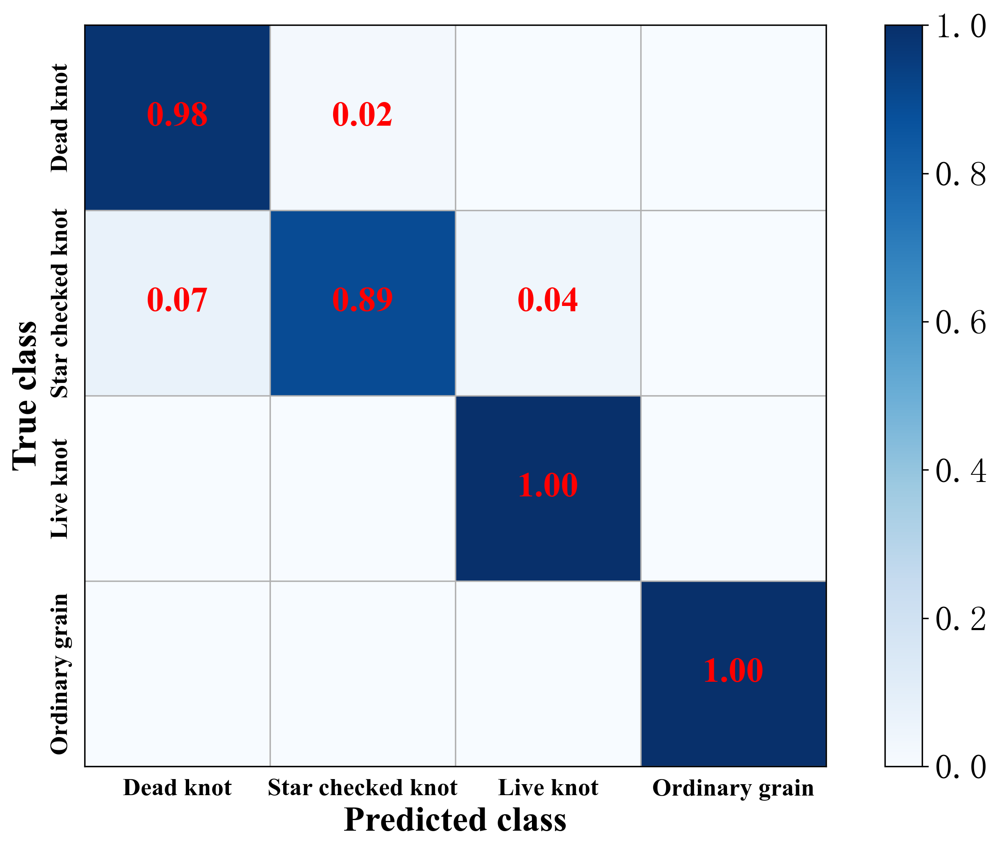

In [18]:
# confusion_matrix (Species level)
# func: matrix plotting
def plot_confusion_matrix(x, labels, title = 'Confusion Matrix'):
    plt.imshow(x, interpolation = 'nearest', cmap = 'Blues')
    #plt.imshow(x, interpolation = 'nearest', cmap = 'YlOrBr')
    #plt.title(title)
    #plt.rcParams['font.family'] = 'Times New Roman'
    plt.rcParams['font.size'] = 20
    plt.rcParams['font.sans-serif'] = 'SimSun' # 2025.09.25 用于木材大会ppt
    plt.colorbar()
    
    xlocations = np.array(range(len(labels)))
    plt.xticks(xlocations, labels, rotation = 0)
    plt.yticks(xlocations, labels, rotation = 90, va = 'center', ha = 'right')
    font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
    #plt.ylabel('真实类别', fontproperties = 'SimHei', fontsize = 28)
    plt.ylabel('True class', fontsize = 20, fontdict = font)
    plt.xlabel('Predicted class', fontsize = 20, fontdict = font)
    #plt.xlabel('预测类别', fontproperties = 'SimHei', fontsize = 28)
    plt.xticks(fontproperties = font1)
    plt.yticks(fontproperties = font1)
    #plt.xticks(fontproperties = 'Times New Roman', size = 14)
    #plt.xticks(fontproperties = 'SimHei', size = 24)
    #plt.yticks(fontproperties = 'Times New Roman', size = 14)
    #plt.yticks(fontproperties = 'SimHei', size = 24)
## func end
L1 = 'Dead knot'
L2 = 'Star checked knot'
L3 = 'Live knot'
L4 = 'Ordinary grain'
#L1 = '死结'
#L2 = '星裂节'
#L3 = '活结'
#L4 = '无缺陷'
label = [L1, L2, L3, L4]

plt.rcParams['font.sans-serif'] = 'SimHei' # 2025.09.25 用于木材大会ppt

tick_marks = np.array(range(len(label))) + 0.5
#y_true = acc[2]
#y_pred = acc[1]
#y_pre = y_pre.reshape(y_pre.shape[0])
#y_real = y_real.reshape(y_real.shape[0])
#print(type(y_real), y_real.dtype, y_real.shape, y_pre.shape, np.max(y_real))
#cm = confusion_matrix(y_real, y_pre)
#np.save('cm_inceptin', cm)
#np.save('y_pre_inceptin', y_pre)
#np.save('y_real_inceptin', y_real)
#cm1 = np.sum(cm, axis = 0) # TP + FP
#cm2 = np.sum(cm, axis = 1) # TP + FN
np.set_printoptions(precision = 2)
cm_normalized = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
#cm_normalized = cm
dia = np.diagonal(cm)
#print(cm, cm1, cm2)
print('precision', dia / cm1)
print('recall', dia / cm2)
print('F1', dia * 2 / (cm1 + cm2))
print('F1_mean', np.mean(dia * 2 / (cm1 + cm2)))

#print('recall', t2)
#F1 = 1 / t1
#print(np.sum(cm, axis = 0))


plt.figure(figsize = (12, 8), dpi = 300)

ind_array = np.arange(len(label))
x, y = np.meshgrid(ind_array, ind_array)
#print(x.shape, y)
font1 = {'family': 'Times New Roman', 'weight':'bold', 'size': 14}
font2 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 20)
for x_val, y_val in zip(x.flatten(), y.flatten()):
    #print(x_val, y_val)
    c = cm_normalized[y_val][x_val]
    if c > 0.0:
        plt.text(x_val, y_val, "%0.2f" % (c,), color = 'red', font_properties = font, fontsize = 20, va = 'center', ha = 'center')

# offset the tick
plt.gca().set_xticks(tick_marks, minor = True)
plt.gca().set_yticks(tick_marks, minor = True)
plt.gca().xaxis.set_ticks_position('none')
plt.gca().yaxis.set_ticks_position('none')
plt.grid(True, which = 'minor', linestyle = '-')
plt.gcf().subplots_adjust(bottom = 0.15)

plot_confusion_matrix(cm_normalized, label, title = 'Normalized confusion matrix')
#plt.savefig('Loss_plot.jpg', bbox_inches = 'tight')
#plt.savefig('E:/工作/农业工程学报/confusion_matrix_oldmodel.jpg', format = 'jpg', bbox_inches = 'tight')
#plt.savefig('E:/工作/IEEE Transactions on Neural Networks and Learning Systems/pictures/confusion_matrix_Taylor2.jpg', format = 'jpg', bbox_inches = 'tight')
#plt.savefig('E:/工作\院基金2022/项目验收/confusion_matrix_2.jpg', format = 'jpg', bbox_inches = 'tight') # 2025.04.11
#plt.savefig('E:/工作/第四届木材科学大会/fig/confusion_matrix_2.jpg', format = 'jpg', bbox_inches = 'tight') # 2025.04.11
#plt.savefig('E:/工作/2024十四五/2025年终总结/pictures/confusion_matrix_1.jpg', bbox_inches = 'tight', dpi = 200) # 2025.11.03
#plt.savefig('E://工作/Advanced Engineering Informatics/pictures/confusion_matrix_3.jpg', bbox_inches = 'tight', dpi = 200) # 2025.12.01
plt.show()

precision [0.89 0.76 0.82 0.85 0.75 0.96 0.9 ]
recall [0.93 0.86 0.85 0.65 0.76 0.9  0.96]
F1 [0.91 0.81 0.84 0.74 0.76 0.93 0.93]
F1_mean 0.8436999949410238


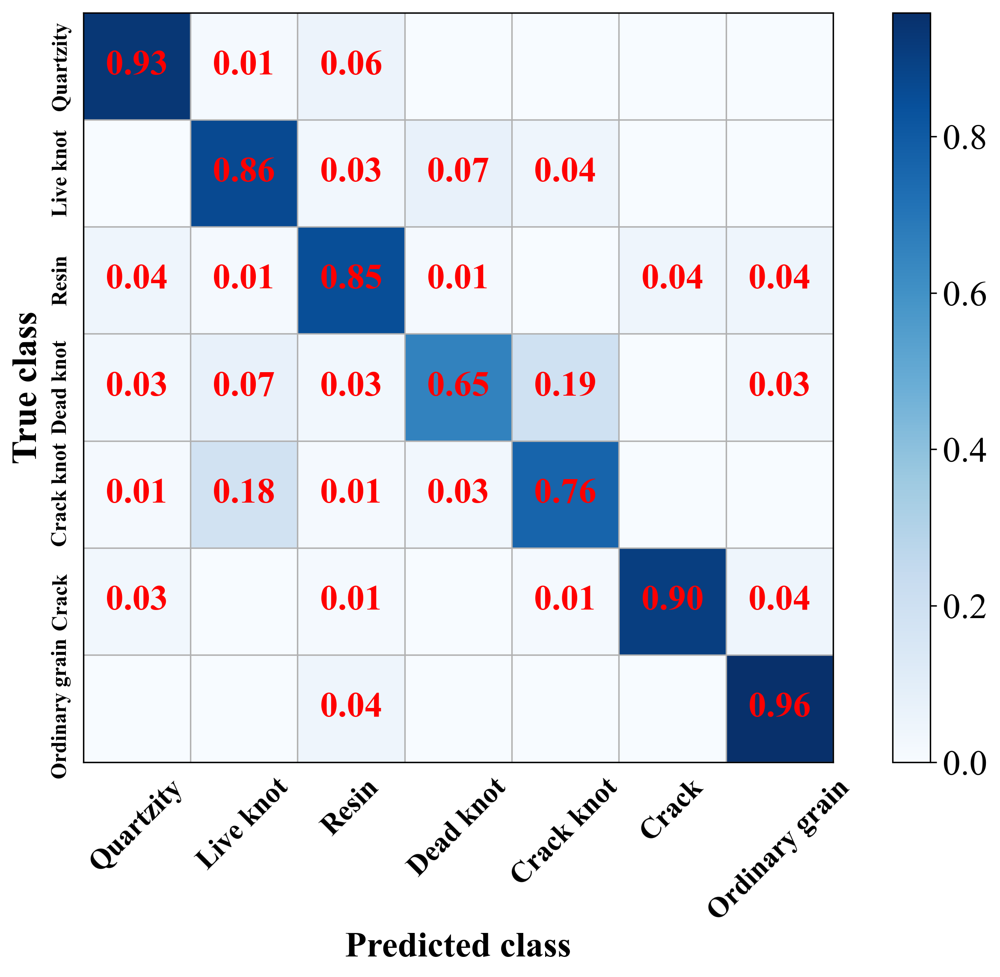

In [58]:
# confusion_matrix (7 classes)
# func: matrix plotting
def plot_confusion_matrix(x, labels, title = 'Confusion Matrix'):
    plt.imshow(x, interpolation = 'nearest', cmap = 'Blues')
    #plt.imshow(x, interpolation = 'nearest', cmap = 'YlOrBr')
    #plt.title(title)
    #plt.rcParams['font.family'] = 'Times New Roman'
    plt.rcParams['font.size'] = 20
    plt.rcParams['font.sans-serif'] = 'Times New Roman' # 2025.09.25 用于木材大会ppt
    plt.colorbar()
    
    xlocations = np.array(range(len(labels)))
    plt.xticks(xlocations, labels, rotation = 0)
    plt.yticks(xlocations, labels, rotation = 90, va = 'center', ha = 'right')
    font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
    #plt.ylabel('真实类别', fontproperties = 'SimHei', fontsize = 28)
    plt.ylabel('True class', fontsize = 20, fontdict = font)
    plt.xlabel('Predicted class', fontsize = 20, fontdict = font)
    #plt.xlabel('预测类别', fontproperties = 'SimHei', fontsize = 28)
    plt.xticks(fontproperties = font2)
    plt.yticks(fontproperties = font3)
    plt.xticks(rotation = 45)
    #plt.yticks(rotation = 45)
    #plt.xticks(fontproperties = 'Times New Roman', size = 14)
    #plt.xticks(fontproperties = 'SimHei', size = 24)
    #plt.yticks(fontproperties = 'Times New Roman', size = 14)
    #plt.yticks(fontproperties = 'SimHei', size = 24)
## func end
L1 = 'Quartzity'
L2 = 'Live knot'
L3 = 'Resin'
L4 = 'Dead knot'
L5 = 'Crack knot'
L6 = 'Crack'
L7 = 'Ordinary grain'

label = [L1, L2, L3, L4, L5, L6, L7]

plt.rcParams['font.sans-serif'] = 'SimHei' # 2025.09.25 用于木材大会ppt

tick_marks = np.array(range(len(label))) + 0.5
#y_true = acc[2]
#y_pred = acc[1]
#y_pre = y_pre.reshape(y_pre.shape[0])
#y_real = y_real.reshape(y_real.shape[0])
#print(type(y_real), y_real.dtype, y_real.shape, y_pre.shape, np.max(y_real))
#cm = confusion_matrix(y_real, y_pre)
#np.save('cm_inceptin', cm)
#np.save('y_pre_inceptin', y_pre)
#np.save('y_real_inceptin', y_real)
#cm1 = np.sum(cm, axis = 0) # TP + FP
#cm2 = np.sum(cm, axis = 1) # TP + FN
np.set_printoptions(precision = 2)
cm_normalized = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
#cm_normalized = cm
dia = np.diagonal(cm)
#print(cm, cm1, cm2)
print('precision', dia / cm1)
print('recall', dia / cm2)
print('F1', dia * 2 / (cm1 + cm2))
print('F1_mean', np.mean(dia * 2 / (cm1 + cm2)))

#print('recall', t2)
#F1 = 1 / t1
#print(np.sum(cm, axis = 0))


plt.figure(figsize = (12, 8), dpi = 300)

ind_array = np.arange(len(label))
x, y = np.meshgrid(ind_array, ind_array)
#print(x.shape, y)
font1 = {'family': 'Times New Roman', 'weight':'bold', 'size': 14}
font2 = {'family': 'Times New Roman', 'weight':'bold', 'size': 16}
font3 = {'family': 'Times New Roman', 'weight':'bold', 'size': 12}
#font2 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 20)
for x_val, y_val in zip(x.flatten(), y.flatten()):
    #print(x_val, y_val)
    c = cm_normalized[y_val][x_val]
    if c > 0.0:
        plt.text(x_val, y_val, "%0.2f" % (c,), color = 'red', font_properties = font2, fontsize = 20, va = 'center', ha = 'center')

# offset the tick
plt.gca().set_xticks(tick_marks, minor = True)
plt.gca().set_yticks(tick_marks, minor = True)
plt.gca().xaxis.set_ticks_position('none')
plt.gca().yaxis.set_ticks_position('none')
plt.grid(True, which = 'minor', linestyle = '-')
plt.gcf().subplots_adjust(bottom = 0.15)

plot_confusion_matrix(cm_normalized, label, title = 'Normalized confusion matrix')
#plt.savefig('Loss_plot.jpg', bbox_inches = 'tight')
#plt.savefig('E:/工作/农业工程学报/confusion_matrix_oldmodel.jpg', format = 'jpg', bbox_inches = 'tight')
#plt.savefig('E:/工作/IEEE Transactions on Neural Networks and Learning Systems/pictures/confusion_matrix_Taylor2.jpg', format = 'jpg', bbox_inches = 'tight')
#plt.savefig('E:/工作\院基金2022/项目验收/confusion_matrix_2.jpg', format = 'jpg', bbox_inches = 'tight') # 2025.04.11
#plt.savefig('E:/工作/第四届木材科学大会/fig/confusion_matrix_2.jpg', format = 'jpg', bbox_inches = 'tight') # 2025.04.11
#plt.savefig('E:/工作/2024十四五/2025年终总结/pictures/confusion_matrix_1.jpg', bbox_inches = 'tight', dpi = 200) # 2025.11.03
plt.savefig('E:/工作/European Journal of Wood and Wood Products/pictures/confusion_matrix_7class.jpg', bbox_inches = 'tight', dpi = 300) # 2026.02.10
plt.show()

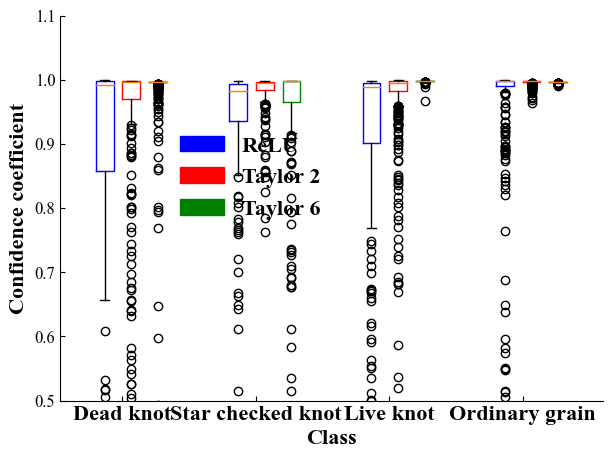

In [30]:
# box creation
axis_x = np.arange(1, 3 + 1, 1)

data1 = re1[0: 360]
data2 = re1[360: 720]
data3 = re1[720: 1080]
data4 = re1[1080: 1440]

data5 = re2[0: 360]
data6 = re2[360: 720]
data7 = re2[720: 1080]
data8 = re2[1080: 1440]

data9 = re3[0: 360]
data10 = re3[360: 720]
data11 = re3[720: 1080]
data12 = re3[1080: 1440]

#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 12}
font2 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 16}

fig = plt.figure(figsize = (7, 5))
#plt.boxplot(pre_s3[:, 0], pre_s3[:, 1], positions = [0, 0.2, 0.4, 0.7, 0.8, 1])
plt.boxplot([data1, data2, data3, data4], positions = [0, 1.5, 3, 4.5], widths = 0.2, boxprops = {'color':'blue'})
plt.boxplot([data5, data6, data7, data8], positions = [0.3, 1.8, 3.3, 4.8], widths = 0.2, boxprops = {'color':'red'})
plt.boxplot([data9, data10, data11, data12], positions = [0.6, 2.1, 3.6, 5.1], widths = 0.2, boxprops = {'color':'green'})

#bp1, = plt.plot(data4, label='Line 1')
#bp2, = plt.plot(data1, label='Line 2')

plt.xlabel('Class', fontdict = font2)
#plt.xlabel('Class', FontProperties = font3)
#plt.ylabel('Loss', fontsize = 14, fontdict = font)
plt.ylabel('Confidence coefficient', fontdict = font2)
x_major_locator = MultipleLocator(20) # x axis interval setting
y_major_locator = MultipleLocator(0.1) # y axis interval setting
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
ax.set_xticks([0.2, 1.7, 3.2, 4.7])
ax.set_xticklabels(['Dead knot', 'Star checked knot', 'Live knot', 'Ordinary grain'], fontdict = font2)
#ax.set_xticklabels(['一', '二', '三', '四', '五', '六'], FontProperties = font3)

blue_patch = mpatches.Patch(color = 'blue', label = 'ReLU')
red_patch = mpatches.Patch(color = 'red', label = 'Taylor 2')
green_patch = mpatches.Patch(color = 'green', label = 'Taylor 6')
plt.legend(handles = [blue_patch, red_patch, green_patch], prop = font2, frameon = False, bbox_to_anchor = (0.35, 0.74))
#plt.legend(handles = [bp1, bp2], prop = font3)

plt.yticks(fontproperties = 'Times New Roman', size = 12)
plt.ylim(0.5, 1.1)
#plt.xlim(0, 4000)

#plt.savefig('E:/工作/农业工程学报/箱型图2.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/计算机工程与应用/pictures/箱型图2.jpg', bbox_inches = 'tight', dpi = 200)
plt.show()

(4, 360)
[0.8451238 0.8747918 0.8417707 0.9546705]
[0.9010211 0.9048657 0.9695613 0.9961303]
[0.969217  0.8483871 0.9976666 0.9955932]
[0.28106433 0.27313548 0.29211745 0.12967633]
[0.21975026 0.2614175  0.06949104 0.00381335]
[0.1322301  0.32514763 0.00176522 0.00114549]


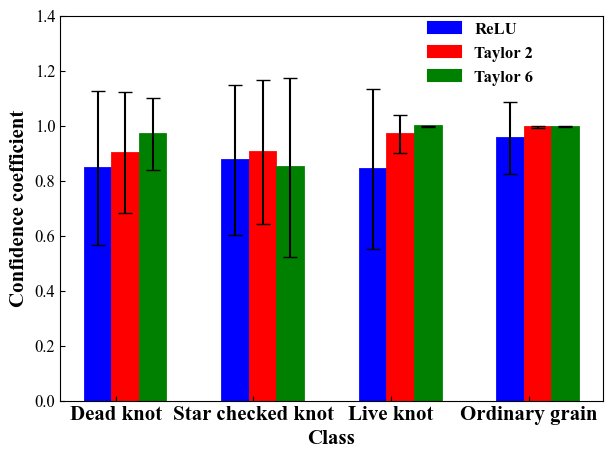

In [78]:
heights = ['A', 'B', 'C', 'D']
R1 = np.reshape(re1, [4, -1])
R2 = np.reshape(re2, [4, -1])
R3 = np.reshape(re3, [4, -1])
print(R1.shape)
m1 = np.mean(R1, 1)
m2 = np.mean(R2, 1)
m3 = np.mean(R3, 1)
s1 = np.std(R1, 1)
s2 = np.std(R2, 1)
s3 = np.std(R3, 1)
print(m1)
print(m2)
print(m3)
print(s1)
print(s2)
print(s3)

data1 = re1[0: 360]
data2 = re1[360: 720]
data3 = re1[720: 1080]
data4 = re1[1080: 1440]
#print(R1[0] - data1)

data5 = re2[0: 360]
data6 = re2[360: 720]
data7 = re2[720: 1080]
data8 = re2[1080: 1440]

data9 = re3[0: 360]
data10 = re3[360: 720]
data11 = re3[720: 1080]
data12 = re3[1080: 1440]

x1 = [0, 1.5, 3, 4.5]
x2 = [0.3, 1.8, 3.3, 4.8]
x3 = [0.6, 2.1, 3.6, 5.1]

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 15}
font2 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 12}

fig = plt.figure(figsize = (7, 5))
plt.bar(x1, m1, yerr = s1, width = 0.28, edgecolor = 'b', color = 'b', linewidth = 2.0, capsize = 5)
plt.bar(x2, m2, yerr = s2, width = 0.28, edgecolor = 'r', color = 'r', linewidth = 2.0, capsize = 5)
plt.bar(x3, m3, yerr = s3, width = 0.28, edgecolor = 'g', color = 'g', linewidth = 2.0, capsize = 5)

plt.xlabel('Class', fontdict = font1)
plt.ylabel('Confidence coefficient', fontdict = font1)
x_major_locator = MultipleLocator(20) # x axis interval setting
y_major_locator = MultipleLocator(0.2) # y axis interval setting
ax = plt.gca()
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
#ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
ax.set_xticks([0.2, 1.7, 3.2, 4.7])
ax.set_xticklabels(['Dead knot', 'Star checked knot', 'Live knot', 'Ordinary grain'], fontdict = font1)


blue_patch = mpatches.Patch(edgecolor = 'blue', facecolor = 'b', linewidth = 1.5, label = 'ReLU')
red_patch = mpatches.Patch(edgecolor = 'red', facecolor = 'r', linewidth = 1.5, label = 'Taylor 2')
green_patch = mpatches.Patch(edgecolor = 'green', facecolor = 'g', linewidth = 1.5, label = 'Taylor 6')
plt.legend(handles = [blue_patch, red_patch, green_patch], prop = font2, frameon = False, bbox_to_anchor = (0.65, 0.78))
#plt.legend(handles = [bp1, bp2], prop = font3)

plt.yticks(fontproperties = 'Times New Roman', size = 12)
plt.ylim(0, 1.4)
#plt.xlim(0, 4000)
plt.savefig('E:\工作\IEEE transaction on image processing\Confidence coefficient.jpg', bbox_inches = 'tight', dpi = 200) # 2025.07.12
plt.show()

4.77035
(20,)
(20,)
2.727037
2.9822516
2.6183496
3.0461993
6.1807866
2.9777102
6.4092803


D:\anaconda3\envs\tensorflow3\lib\site-packages\ipykernel_launcher.py:61: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later


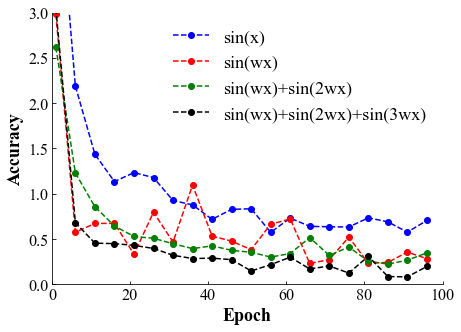

In [20]:
# Activation function
pre_path = 'E:/pythonworkspace/defect_recognition/results_3classes_360'
#pos_path = '/acc_train.npy'
pos_path = '/loss.npy'
#pos_path = '/acc_test.npy'
axis_x = np.arange(1, 100 + 1, 5)
b = np.arange(0, 100, 5) # 从0开始间隔为10的等差数列
aa = np.load(pre_path + '/CE_batchsize40' + pos_path)
print(max(aa))
axis_y1 = aa[b]
print(axis_y1.shape)
print(axis_x.shape)
aa = np.load(pre_path + '/CE_batchsize20' + pos_path)
print(max(aa))
axis_y2 = aa[b]
aa = np.load(pre_path + '/CE_batchsize10' + pos_path)
print(max(aa))
axis_y3 = aa[b]
aa = np.load(pre_path + '/ModifiedCE_batchsize40' + pos_path)
print(max(aa))
axis_y4 = aa[b]
aa = np.load(pre_path + '/ModifiedCE_batchsize10' + pos_path)
print(max(aa))
axis_y5 = aa[b]
aa = np.load(pre_path + '/FocalLoss_batchsize40' + pos_path)
print(max(aa))
axis_y6 = aa[b]
aa = np.load(pre_path + '/FocalLoss_batchsize10' + pos_path)
print(max(aa))
axis_y7 = aa[b]
aa = np.load(pre_path + '/Var_25_p' + pos_path)
print(max(aa))
axis_y8 = aa[b]

#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 18}
font2 = font_manager.FontProperties(fname = (r'C:\Windows\Fonts\simsun.ttc'), weight = 'bold', size = 20)
font3 = font_manager.FontProperties(fname = (r'E:\工作\农业工程学报\times+simsun.ttf'), weight = 'bold', size = 16)
font4 = font_manager.FontProperties(fname = (r'E:\工作\农业工程学报\times+simsun.ttf'), weight = 'bold', size = 18)

fig = plt.figure(figsize = (7, 5))

plt.plot(axis_x * 1, axis_y1, c = 'blue', linestyle = '--', marker = 'o', label = 'sin(x)')
plt.plot(axis_x * 1, axis_y3, c = 'red', linestyle = '--', marker = 'o', label = 'sin(wx)')
#plt.plot(axis_x * 1, axis_y4, c = 'black', linestyle = '--', label = 'Modified Cross Entropy(batchsize = 40)')
plt.plot(axis_x * 1, axis_y4, c = 'green', linestyle = '--', marker = 'o', label = 'sin(wx)+sin(2wx)') # 仪器仪表学报
plt.plot(axis_x * 1, axis_y5, c = 'black', linestyle = '--', marker = 'o', label = 'sin(wx)+sin(2wx)+sin(3wx)')

Lg = plt.legend(prop = font4, frameon = False) # display lengend
#plt.legend()
#font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
plt.xlabel('Epoch', fontsize = 18, fontdict = font1)
#plt.xlabel('训练周期Epoch', FontProperties = font3)
#plt.xlabel('Inference time(ms)', FontProperties = font1)
#plt.ylabel('Loss', fontsize = 14, fontdict = font)
#plt.ylabel('准确率Accuracy', FontProperties = font3)
#plt.ylabel('损失Loss', FontProperties = font3)
plt.ylabel('Accuracy', FontProperties = font1)
x_major_locator = MultipleLocator(20) # x axis interval setting
y_major_locator = MultipleLocator(0.5) # y axis interval setting
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
plt.xticks(fontproperties = 'Times New Roman', size = 16)
plt.yticks(fontproperties = 'Times New Roman', size = 16)
plt.ylim(0, 3)
plt.xlim(0, 100)
#y_values=list(range(11))

#plt.savefig('E:/工作/农业工程学报/loss示意图1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/农业工程学报/acc_train1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/仪器仪表学报/acc_train1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Acc vs time for AF.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Acc vs epoch for AF.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
plt.show()

4.77035
(20,)
(20,)
2.727037
2.9822516
2.6183496
3.0461993
6.1807866
2.9777102
6.4092803


D:\anaconda3\envs\tensorflow3\lib\site-packages\ipykernel_launcher.py:61: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later


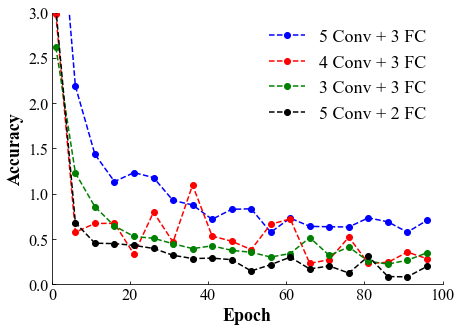

In [19]:
# 3 Network scaling
pre_path = 'E:/pythonworkspace/defect_recognition/results_3classes_360'
#pos_path = '/acc_train.npy'
pos_path = '/loss.npy'
#pos_path = '/acc_test.npy'
axis_x = np.arange(1, 100 + 1, 5)
b = np.arange(0, 100, 5) # 从0开始间隔为10的等差数列
aa = np.load(pre_path + '/CE_batchsize40' + pos_path)
print(max(aa))
axis_y1 = aa[b]
print(axis_y1.shape)
print(axis_x.shape)
aa = np.load(pre_path + '/CE_batchsize20' + pos_path)
print(max(aa))
axis_y2 = aa[b]
aa = np.load(pre_path + '/CE_batchsize10' + pos_path)
print(max(aa))
axis_y3 = aa[b]
aa = np.load(pre_path + '/ModifiedCE_batchsize40' + pos_path)
print(max(aa))
axis_y4 = aa[b]
aa = np.load(pre_path + '/ModifiedCE_batchsize10' + pos_path)
print(max(aa))
axis_y5 = aa[b]
aa = np.load(pre_path + '/FocalLoss_batchsize40' + pos_path)
print(max(aa))
axis_y6 = aa[b]
aa = np.load(pre_path + '/FocalLoss_batchsize10' + pos_path)
print(max(aa))
axis_y7 = aa[b]
aa = np.load(pre_path + '/Var_25_p' + pos_path)
print(max(aa))
axis_y8 = aa[b]

#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 18}
font2 = font_manager.FontProperties(fname = (r'C:\Windows\Fonts\simsun.ttc'), weight = 'bold', size = 20)
font3 = font_manager.FontProperties(fname = (r'E:\工作\农业工程学报\times+simsun.ttf'), weight = 'bold', size = 16)
font4 = font_manager.FontProperties(fname = (r'E:\工作\农业工程学报\times+simsun.ttf'), weight = 'bold', size = 18)

fig = plt.figure(figsize = (7, 5))

plt.plot(axis_x * 1, axis_y1, c = 'blue', linestyle = '--', marker = 'o', label = '5 Conv + 3 FC')
plt.plot(axis_x * 1, axis_y3, c = 'red', linestyle = '--', marker = 'o', label = '4 Conv + 3 FC')
#plt.plot(axis_x * 1, axis_y4, c = 'black', linestyle = '--', label = 'Modified Cross Entropy(batchsize = 40)')
plt.plot(axis_x * 1, axis_y4, c = 'green', linestyle = '--', marker = 'o', label = '3 Conv + 3 FC') # 仪器仪表学报
plt.plot(axis_x * 1, axis_y5, c = 'black', linestyle = '--', marker = 'o', label = '5 Conv + 2 FC')

Lg = plt.legend(prop = font4, frameon = False) # display lengend
#plt.legend()
#font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
plt.xlabel('Epoch', fontsize = 18, fontdict = font1)
#plt.xlabel('训练周期Epoch', FontProperties = font3)
#plt.xlabel('Inference time(ms)', FontProperties = font1)
#plt.ylabel('Loss', fontsize = 14, fontdict = font)
#plt.ylabel('准确率Accuracy', FontProperties = font3)
#plt.ylabel('损失Loss', FontProperties = font3)
plt.ylabel('Accuracy', FontProperties = font1)
x_major_locator = MultipleLocator(20) # x axis interval setting
y_major_locator = MultipleLocator(0.5) # y axis interval setting
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
plt.xticks(fontproperties = 'Times New Roman', size = 16)
plt.yticks(fontproperties = 'Times New Roman', size = 16)
plt.ylim(0, 3)
plt.xlim(0, 100)
#y_values=list(range(11))

#plt.savefig('E:/工作/农业工程学报/loss示意图1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/农业工程学报/acc_train1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:/工作/仪器仪表学报/acc_train1.jpg', bbox_inches = 'tight', dpi = 200)
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Acc vs time for NS.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Acc vs epoch for NS.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
plt.show()

max: 95
[[40.  0.  0.]
 [ 0. 37.  3.]
 [ 0.  3. 37.]] [40. 40. 40.] [40. 40. 40.]
precision [1.   0.93 0.93]
recall [1.   0.93 0.93]
F1_mean 0.9500000000000001


D:\program\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
D:\program\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:18: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
D:\program\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
D:\program\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:20: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later


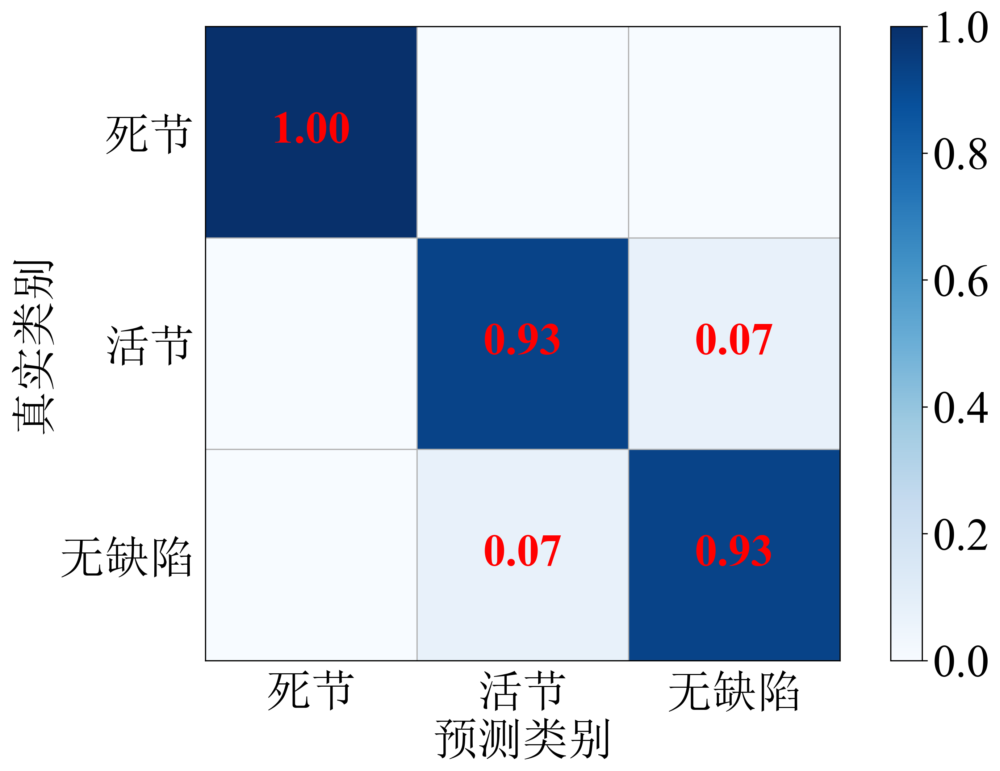

In [7]:
# confusion_matrix (Species level)
# func: matrix plotting
def plot_confusion_matrix(x, labels, title = 'Confusion Matrix'):
    plt.imshow(x, interpolation = 'nearest', cmap = 'Blues')
    #plt.title(title)
    plt.rcParams['font.family'] = 'Times New Roman'
    plt.rcParams['font.size'] = 30
    plt.colorbar()
    
    font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
    font2 = font_manager.FontProperties(fname = (r'C:\Windows\Fonts\simsun.ttc'), weight = 'bold', size = 30)
    
    xlocations = np.array(range(len(labels)))
    plt.xticks(xlocations, labels)
    plt.yticks(xlocations, labels)
    
    plt.ylabel('真实类别', fontsize = 30, FontProperties = font2)
    plt.xlabel('预测类别', fontsize = 30, FontProperties = font2)
    plt.xticks(FontProperties = font2, size = 30)
    plt.yticks(FontProperties = font2, size = 30)
## func end
L1 = '死节'
L2 = '活节'
L3 = '无缺陷'
label = [L1, L2, L3]

pre_path = 'E:/pythonworkspace/defect_recognition'
#pos_path = '/acc_train.npy'
mid_path = '/result_GoogleNet2'
#mid_path = '/result_FocalLoss'
#mid_path = '/result_Var1_0.6'
#mid_path = '/result_Var0_2'
#mid_path = '/result_Var1_0.3_Var0_1'
#mid_path = '/result_FocalLoss'

axis_x = np.arange(1, 100 + 1, 1)
b = np.arange(0, 100, 1) # 从0开始间隔为10的等差数列
aa = np.load(pre_path + mid_path + '/acc_train.npy')
t = np.max(aa)
t = np.argmax(aa)
print('max:', t)
aa = np.load(pre_path + mid_path + '/CM_train.npy')
cm = aa[t]
cm = np.zeros([3, 3])
cm[0, :] = np.array([40, 0, 0]) # modify
cm[1, :] = np.array([0, 37, 3]) # modify
cm[2, :] = np.array([0, 3, 37]) # modify

tick_marks = np.array(range(len(label))) + 0.5
#y_true = acc[2]
#y_pred = acc[1]
#y_pre = y_pre.reshape(y_pre.shape[0])
#y_real = y_real.reshape(y_real.shape[0])
#print(type(y_real), y_real.dtype, y_real.shape, y_pre.shape, np.max(y_real))
#cm = confusion_matrix(y_real, y_pre)
#np.save('cm_inceptin', cm)
#np.save('y_pre_inceptin', y_pre)
#np.save('y_real_inceptin', y_real)
cm1 = np.sum(cm, axis = 0) # TP + FP
cm2 = np.sum(cm, axis = 1) # TP + FN
dia = np.diagonal(cm)
F1_mean = np.mean(dia * 2 / (cm1 + cm2))
np.set_printoptions(precision = 2)
cm_normalized = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
#cm_normalized = cm

print(cm, cm1, cm2)
print('precision', dia / cm1)
print('recall', dia / cm2)
#print('F1', dia * 2 / (cm1 + cm2))
print('F1_mean', F1_mean)

#print('recall', t2)
#F1 = 1 / t1
#print(np.sum(cm, axis = 0))

plt.figure(figsize = (12, 8), dpi = 300)

ind_array = np.arange(len(label))
x, y = np.meshgrid(ind_array, ind_array)
#print(x.shape, y)
font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger'}
for x_val, y_val in zip(x.flatten(), y.flatten()):
    #print(x_val, y_val)
    c = cm_normalized[y_val][x_val]
    if c > 0.0:
        plt.text(x_val, y_val, "%0.2f" % (c,), color = 'red', font_properties = font, fontsize = 30, va = 'center', ha = 'center')

# offset the tick
plt.gca().set_xticks(tick_marks, minor = True)
plt.gca().set_yticks(tick_marks, minor = True)
plt.gca().xaxis.set_ticks_position('none')
plt.gca().yaxis.set_ticks_position('none')
plt.grid(True, which = 'minor', linestyle = '-')
plt.gcf().subplots_adjust(bottom = 0.15)

plot_confusion_matrix(cm_normalized, label, title = 'Normalized confusion matrix')
#plt.savefig('Loss_plot.jpg', bbox_inches = 'tight')
plt.savefig('confusion_matrix_Var1_0.3_Var0_2.jpg', format = 'jpg', bbox_inches = 'tight')
plt.show()

(0.0, 1.0)

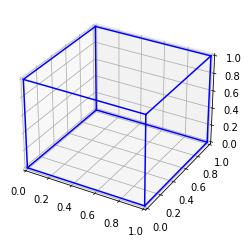

In [35]:
# 立方体（透明）
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')
vertices = [[0, 0, 0], [1, 0, 0], [1, 1, 0], [0, 1, 0], [0, 0, 1], [1, 0, 1], [1, 1, 1], [0, 1, 1]]
edges = [(0, 1), (1, 2), (2, 3), (3, 0),
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6), (3, 7)]
i = 0
for edge in edges:
    i = i + 1
    #print(i)
    start, end = edge
    #print(start, end)
    start_vertex = vertices[start]    
    end_vertex = vertices[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
plt.axis('on')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_zlim(0, 1)

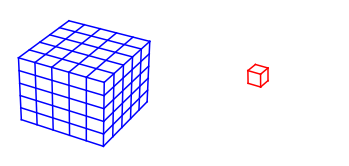

In [119]:
# 立方体（实心） feature map
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
fig = plt.figure()
ax = fig.add_subplot(121, projection = '3d')
# 外边
vertices = [[0, 0, 0], [1, 0, 0], [1, 1, 0], [0, 1, 0], [0, 0, 1], [1, 0, 1], [1, 1, 1], [0, 1, 1]]
edges = [(0, 1), (1, 2), 
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6)]
# 平行边
vertices2 = [[0.2, 0, 0], [0.4, 0, 0], [0.6, 0, 0], [0.8, 0, 0], 
             [1, 0.2, 0], [1, 0.4, 0], [1, 0.6, 0], [1, 0.8, 0],
             [0.2, 0, 1], [0.4, 0, 1], [0.6, 0, 1], [0.8, 0, 1],
             [1, 0.2, 1], [1, 0.4, 1], [1, 0.6, 1], [1, 0.8, 1],
             [0, 0.2, 1], [0, 0.4, 1], [0, 0.6, 1], [0, 0.8, 1],
             [0.2, 1, 1], [0.4, 1, 1], [0.6, 1, 1], [0.8, 1, 1]]
edges2 = [(0, 8), (1, 9), (2, 10), (3, 11),
        (4, 12), (5, 13), (6, 14), (7, 15),
        (8, 20), (9, 21), (10, 22), (11, 23),
        (12, 16), (13, 17), (14, 18), (15, 19)]
# 垂直边
vertices3 = [[0, 0, 0.2], [0, 0, 0.4], [0, 0, 0.6], [0, 0, 0.8], 
             [1, 0, 0.2], [1, 0, 0.4], [1, 0, 0.6], [1, 0, 0.8],
             [1, 1, 0.2], [1, 1, 0.4], [1, 1, 0.6], [1, 1, 0.8]]
edges3 = [(0, 4), (1, 5), (2, 6), (3, 7),
         (4, 8), (5, 9), (6, 10), (7, 11)]
i = 0
for edge in edges:
    i = i + 1
    #print(i)
    start, end = edge
    #print(start, end)
    start_vertex = vertices[start]    
    end_vertex = vertices[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
    
for edge in edges2:
    i = i + 1
    start, end = edge
    start_vertex = vertices2[start]    
    end_vertex = vertices2[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
    
for edge in edges3:
    i = i + 1
    start, end = edge
    start_vertex = vertices3[start]    
    end_vertex = vertices3[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
plt.axis('off')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_zlim(0, 1)
# 卷积核
ax = fig.add_subplot(122, projection = '3d')
L = 0.2
vertices4 = [[0, 0, 0.5], [L, 0, 0.5], [L, L, 0.5], [0, L, 0.5], [0, 0, L + 0.5], [L, 0, L + 0.5], [L, L, L + 0.5], [0, L, L+ 0.5]]
edges4 = [(0, 1), (1, 2), 
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6)]
for edge in edges4:
    i = i + 1
    start, end = edge
    start_vertex = vertices4[start]
    end_vertex = vertices4[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'r')
plt.axis('off')
ax.set_xlim(0, 0.4)
ax.set_ylim(0, 0.4)
ax.set_zlim(-0.5, 1.5)
ax.set_box_aspect([0.2, 0.2, 1])
plt.savefig('E:\工作\IEEE transaction on image processing\pictures\示意图1.jpg', bbox_inches = 'tight', dpi = 200) # 2024.04.09
plt.show()

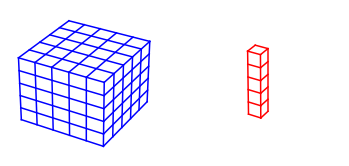

In [126]:
# 立方体（实心） feature channel
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
fig = plt.figure()
ax = fig.add_subplot(121, projection = '3d')
# 外边
vertices = [[0, 0, 0], [1, 0, 0], [1, 1, 0], [0, 1, 0], [0, 0, 1], [1, 0, 1], [1, 1, 1], [0, 1, 1]]
edges = [(0, 1), (1, 2), 
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6)]
# 平行边
vertices2 = [[0.2, 0, 0], [0.4, 0, 0], [0.6, 0, 0], [0.8, 0, 0], 
             [1, 0.2, 0], [1, 0.4, 0], [1, 0.6, 0], [1, 0.8, 0],
             [0.2, 0, 1], [0.4, 0, 1], [0.6, 0, 1], [0.8, 0, 1],
             [1, 0.2, 1], [1, 0.4, 1], [1, 0.6, 1], [1, 0.8, 1],
             [0, 0.2, 1], [0, 0.4, 1], [0, 0.6, 1], [0, 0.8, 1],
             [0.2, 1, 1], [0.4, 1, 1], [0.6, 1, 1], [0.8, 1, 1]]
edges2 = [(0, 8), (1, 9), (2, 10), (3, 11),
        (4, 12), (5, 13), (6, 14), (7, 15),
        (8, 20), (9, 21), (10, 22), (11, 23),
        (12, 16), (13, 17), (14, 18), (15, 19)]
# 垂直边
vertices3 = [[0, 0, 0.2], [0, 0, 0.4], [0, 0, 0.6], [0, 0, 0.8], 
             [1, 0, 0.2], [1, 0, 0.4], [1, 0, 0.6], [1, 0, 0.8],
             [1, 1, 0.2], [1, 1, 0.4], [1, 1, 0.6], [1, 1, 0.8]]
edges3 = [(0, 4), (1, 5), (2, 6), (3, 7),
         (4, 8), (5, 9), (6, 10), (7, 11)]
i = 0
for edge in edges:
    i = i + 1
    #print(i)
    start, end = edge
    #print(start, end)
    start_vertex = vertices[start]    
    end_vertex = vertices[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
    
for edge in edges2:
    i = i + 1
    start, end = edge
    start_vertex = vertices2[start]    
    end_vertex = vertices2[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
    
for edge in edges3:
    i = i + 1
    start, end = edge
    start_vertex = vertices3[start]    
    end_vertex = vertices3[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
plt.axis('off')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_zlim(0, 1)
# 卷积核
ax = fig.add_subplot(122, projection = '3d')
L = 1
vertices4 = [[0, 0, 0], [.2, 0, 0], [.2, .2, 0], [0, .2, 0], [0, 0, L], [.2, 0, L], [.2, .2, L], [0, .2, L]]
edges4 = [(0, 1), (1, 2), 
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6)]
for edge in edges4:
    i = i + 1
    start, end = edge
    start_vertex = vertices4[start]
    end_vertex = vertices4[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'r')
vertices5 = [[0, 0, 0.2], [0, 0, 0.4], [0, 0, 0.6], [0, 0, 0.8], 
             [0.2, 0, 0.2], [0.2, 0, 0.4], [0.2, 0, 0.6], [0.2, 0, 0.8],
             [0.2, 0.2, 0.2], [0.2, 0.2, 0.4], [0.2, 0.2, 0.6], [0.2, 0.2, 0.8]]
edges5 = [(0, 4), (1, 5), (2, 6), (3, 7),
         (4, 8), (5, 9), (6, 10), (7, 11)]
for edge in edges5:
    i = i + 1
    start, end = edge
    start_vertex = vertices5[start]    
    end_vertex = vertices5[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'r')
plt.axis('off')
plt.axis('off')
ax.set_xlim(0, 0.4)
ax.set_ylim(0, 0.4)
ax.set_zlim(-0.5, 1.5)
ax.set_box_aspect([0.2, 0.2, 1])
plt.savefig('E:\工作\IEEE transaction on image processing\pictures\示意图2.jpg', bbox_inches = 'tight', dpi = 200) # 2025.05.05
plt.show()

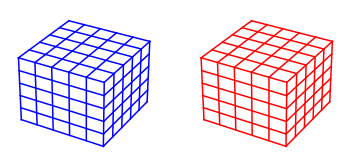

In [128]:
# 立方体（实心） feature node
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
fig = plt.figure()
ax = fig.add_subplot(121, projection = '3d')
# 外边
vertices = [[0, 0, 0], [1, 0, 0], [1, 1, 0], [0, 1, 0], [0, 0, 1], [1, 0, 1], [1, 1, 1], [0, 1, 1]]
edges = [(0, 1), (1, 2), 
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6)]
# 平行边
vertices2 = [[0.2, 0, 0], [0.4, 0, 0], [0.6, 0, 0], [0.8, 0, 0], 
             [1, 0.2, 0], [1, 0.4, 0], [1, 0.6, 0], [1, 0.8, 0],
             [0.2, 0, 1], [0.4, 0, 1], [0.6, 0, 1], [0.8, 0, 1],
             [1, 0.2, 1], [1, 0.4, 1], [1, 0.6, 1], [1, 0.8, 1],
             [0, 0.2, 1], [0, 0.4, 1], [0, 0.6, 1], [0, 0.8, 1],
             [0.2, 1, 1], [0.4, 1, 1], [0.6, 1, 1], [0.8, 1, 1]]
edges2 = [(0, 8), (1, 9), (2, 10), (3, 11),
        (4, 12), (5, 13), (6, 14), (7, 15),
        (8, 20), (9, 21), (10, 22), (11, 23),
        (12, 16), (13, 17), (14, 18), (15, 19)]
# 垂直边
vertices3 = [[0, 0, 0.2], [0, 0, 0.4], [0, 0, 0.6], [0, 0, 0.8], 
             [1, 0, 0.2], [1, 0, 0.4], [1, 0, 0.6], [1, 0, 0.8],
             [1, 1, 0.2], [1, 1, 0.4], [1, 1, 0.6], [1, 1, 0.8]]
edges3 = [(0, 4), (1, 5), (2, 6), (3, 7),
         (4, 8), (5, 9), (6, 10), (7, 11)]
i = 0
for edge in edges:
    i = i + 1
    #print(i)
    start, end = edge
    #print(start, end)
    start_vertex = vertices[start]    
    end_vertex = vertices[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
    
for edge in edges2:
    i = i + 1
    start, end = edge
    start_vertex = vertices2[start]    
    end_vertex = vertices2[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
    
for edge in edges3:
    i = i + 1
    start, end = edge
    start_vertex = vertices3[start]    
    end_vertex = vertices3[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'b')
plt.axis('off')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_zlim(0, 1)
# 卷积核
ax = fig.add_subplot(122, projection = '3d')
# 外边
vertices = [[0, 0, 0], [1, 0, 0], [1, 1, 0], [0, 1, 0], [0, 0, 1], [1, 0, 1], [1, 1, 1], [0, 1, 1]]
edges = [(0, 1), (1, 2), 
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6)]
# 平行边
vertices2 = [[0.2, 0, 0], [0.4, 0, 0], [0.6, 0, 0], [0.8, 0, 0], 
             [1, 0.2, 0], [1, 0.4, 0], [1, 0.6, 0], [1, 0.8, 0],
             [0.2, 0, 1], [0.4, 0, 1], [0.6, 0, 1], [0.8, 0, 1],
             [1, 0.2, 1], [1, 0.4, 1], [1, 0.6, 1], [1, 0.8, 1],
             [0, 0.2, 1], [0, 0.4, 1], [0, 0.6, 1], [0, 0.8, 1],
             [0.2, 1, 1], [0.4, 1, 1], [0.6, 1, 1], [0.8, 1, 1]]
edges2 = [(0, 8), (1, 9), (2, 10), (3, 11),
        (4, 12), (5, 13), (6, 14), (7, 15),
        (8, 20), (9, 21), (10, 22), (11, 23),
        (12, 16), (13, 17), (14, 18), (15, 19)]
# 垂直边
vertices3 = [[0, 0, 0.2], [0, 0, 0.4], [0, 0, 0.6], [0, 0, 0.8], 
             [1, 0, 0.2], [1, 0, 0.4], [1, 0, 0.6], [1, 0, 0.8],
             [1, 1, 0.2], [1, 1, 0.4], [1, 1, 0.6], [1, 1, 0.8]]
edges3 = [(0, 4), (1, 5), (2, 6), (3, 7),
         (4, 8), (5, 9), (6, 10), (7, 11)]
i = 0
for edge in edges:
    i = i + 1
    #print(i)
    start, end = edge
    #print(start, end)
    start_vertex = vertices[start]    
    end_vertex = vertices[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'r')
    
for edge in edges2:
    i = i + 1
    start, end = edge
    start_vertex = vertices2[start]    
    end_vertex = vertices2[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'r')
    
for edge in edges3:
    i = i + 1
    start, end = edge
    start_vertex = vertices3[start]    
    end_vertex = vertices3[end]
    ax.plot([start_vertex[0], end_vertex[0]], [start_vertex[1], end_vertex[1]], [start_vertex[2], end_vertex[2]], color = 'r')
plt.axis('off')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_zlim(0, 1)
plt.savefig('E:\工作\IEEE transaction on image processing\pictures\示意图3.jpg', bbox_inches = 'tight', dpi = 200) # 2025.05.05
plt.show()

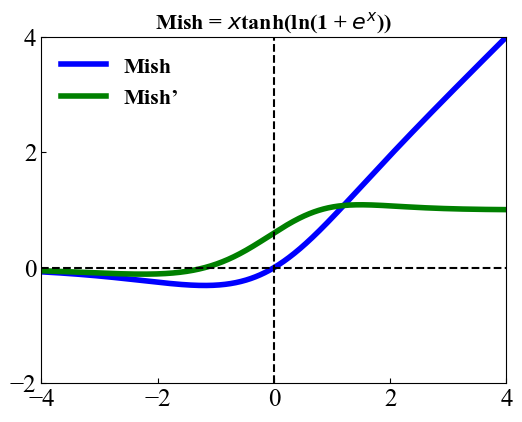

In [98]:
# Activation function plot 2025.07.17
def relu(x):
    y = x * (x > 0)
    return y
def d_relu(x):
    y = (x > 0)
    return y

def sigmoid(x):
    y = 1 / (1 + np.exp(-x))
    return y
def tanh(x):
    y = (np.exp(x) - np.exp(-x)) / (np.exp(x) + np.exp(-x))
    return y
axis_x = np.arange(-20, 10 + 1, .01)
axis_y1 = relu(axis_x)
axis_y2 = d_relu(axis_x)
axis_y3 = axis_x * tanh(np.log(1 + np.exp(axis_x)))
#axis_y4 = tanh(np.log(1 + np.exp(axis_x))) + axis_x * (1 - tanh(np.log(1 + np.exp(axis_x)))**2) / (1 +  np.exp(axis_x)) *  np.exp(axis_x) * axis_x
axis_y4 = np.exp(axis_x) * (4 * np.exp(axis_x * 2) + np.exp(axis_x * 3) + 4 * (1 + axis_x) + np.exp(axis_x) * (6 + 4 * axis_x)) / (2 + 2 * np.exp(axis_x) + np.exp(axis_x * 2))**2
axis_y5 = np.sin(axis_x)
axis_y6 = np.cos(axis_x)
axis_y7 = axis_x**2 + axis_x
axis_y8 = 2 * axis_x + 1
axis_y9 = axis_x - axis_x**3
axis_y10 = 1 - 3 * axis_x**2
axis_y11 = np.exp(-axis_x**2)
axis_y12 = -2 * axis_x * np.exp(-axis_x**2)
axis_y13 = .5 * axis_x * (1 + tanh((2 / np.pi)**0.5 * (axis_x + .044745 * axis_x**3))) # GELU
axis_y14 = .5 * (1 + tanh((2 / np.pi)**0.5 * (axis_x + .044745 * axis_x**3))) + axis_x / (2 * np.pi)**0.5 * np.exp(-axis_x**2 / 2)
axis_y15 = axis_x * sigmoid(axis_x) # SiLU or swiwh
axis_y16 = sigmoid(axis_x) + axis_x * sigmoid(axis_x) * (1 - sigmoid(axis_x))# SiLU or swiwh


#print(axis_x.shape, axis_y.shape)
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

font1 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 24}
font2 = {'family':'Times New Roman', 'weight':'bold', 'style':'normal', 'size': 16}
font3 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 16)
font4 = font_manager.FontProperties(fname = (r'D:\pythonworkspace\times+simsun.ttf'), weight = 'bold', size = 18)

fig = plt.figure(figsize = (6, 4.5))

#plt.plot(axis_x * 1, axis_y1, c = 'b', linestyle = '-', linewidth = '3', label = 'ReLU')
#plt.plot(axis_x * 1, axis_y2, c = 'g', linestyle = '-', linewidth = '3', label = 'ReLU’')
plt.plot(axis_x * 1, axis_y3, c = 'b', linestyle = '-', linewidth = '4', label = 'Mish')
plt.plot(axis_x * 1, axis_y4, c = 'g', linestyle = '-', linewidth = '4', label = 'Mish’')
#plt.plot(axis_x * 1, axis_y5, c = 'b', linestyle = '-', linewidth = '2', label = 'Sinusoid')
#plt.plot(axis_x * 1, axis_y6, c = 'g', linestyle = '-', linewidth = '2', label = 'Sinusoid’')
#plt.plot(axis_x * 1, axis_y7, c = 'b', linestyle = '-', linewidth = '2', label = 'Quadratic Unit')
#plt.plot(axis_x * 1, axis_y8, c = 'g', linestyle = '-', linewidth = '2', label = 'Quadratic Unit’')
#plt.plot(axis_x * 1, axis_y9, c = 'b', linestyle = '-', linewidth = '2', label = 'Cubic Unit')
#plt.plot(axis_x * 1, axis_y10, c = 'g', linestyle = '-', linewidth = '2', label = 'Cubic Unit’')
#plt.plot(axis_x * 1, axis_y11, c = 'b', linestyle = '-', linewidth = '2', label = 'Gaussian')
#plt.plot(axis_x * 1, axis_y12, c = 'g', linestyle = '-', linewidth = '2', label = 'Gaussian’')
#plt.plot(axis_x * 1, axis_y13, c = 'b', linestyle = '-', linewidth = '4', label = 'GELU')
#plt.plot(axis_x * 1, axis_y14, c = 'g', linestyle = '-', linewidth = '4', label = 'GELU’')
#plt.plot(axis_x * 1, axis_y15, c = 'b', linestyle = '-', linewidth = '4', label = 'SiLU')
#plt.plot(axis_x * 1, axis_y16, c = 'g', linestyle = '-', linewidth = '4', label = 'SiLU’')
#plt.scatter(axis_x * 1, axis_y5, c = 'r', linestyle = '--', marker = '.')

Lg = plt.legend(prop = font2, frameon = False) # display lengend
#plt.legend()
#font = {'family':'Times New Roman', 'weight':'bold', 'size':'larger', 'color':'black'}
#plt.xlabel('x', fontdict = font1)
#plt.ylabel('y', fontdict = font1)
x_major_locator = MultipleLocator(2) # x axis interval setting
y_major_locator = MultipleLocator(2) # y axis interval setting
ax = plt.gca()
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)
plt.xticks(fontproperties = 'Times New Roman', size = 18)
plt.yticks(fontproperties = 'Times New Roman', size = 18)
plt.axvline(x = 0, color = 'black', linestyle = '--')
plt.axhline(y = 0, color = 'k', linestyle = '--')
#plt.title(r'Mish$x\rm{/mm}$')
#plt.title(r'ReLU = max($x\rm$, 0)', fontdict = font2, color = 'k')
plt.title(r'Mish = $x\rm$tanh(ln(1 + $e^x$))', fontdict = font2, color = 'k')
#plt.title(r'Sinusoid = sin($x\rm$)', fontdict = font2, color = 'k')
#plt.title(r'Quadratic = $x\rm$$^2$ + $x\rm$', fontdict = font2, color = 'k')
#plt.title(r'Cubic = $x\rm$ - $x\rm$$^3$', fontdict = font2, color = 'k')
#plt.title(r'Gaussian = $e\rm^{-x\rm^2}$', fontdict = font2, color = 'k')
#plt.title(r'GELU = $\frac{x}{2}$[1+erf($\frac{x}{√2}$)]', fontdict = font2, color = 'k')
#plt.title(r'SiLU = $\frac{x\rm}{1 + e^{-x\rm}}$', fontdict = font2, color = 'k')

#plt.text(2.6, 0.85, 'Mish = xtanh(ln(1 + ex))', fontdict = font2, color = 'k')
#plt.axis('off')
#plt.xticks([])
#plt.yticks([])
#plt.grid(True)
#plt.axis('on')
plt.ylim(-2, 4)
plt.xlim(-4, 4)
#y_values=list(range(11))

plt.savefig('E:\工作\European Journal of Wood and Wood Products\pictures\Mish.jpg', bbox_inches = 'tight', dpi = 300) # 2026.01.31
#plt.savefig('E:\工作\European Journal of Wood and Wood Products\pictures\ReLU2.jpg', bbox_inches = 'tight', dpi = 300) # 2026.01.31
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Sinusoid.jpg', bbox_inches = 'tight', dpi = 200) # 2025.07.18
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Quadratic.jpg', bbox_inches = 'tight', dpi = 200) # 2025.07.18
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Cubic.jpg', bbox_inches = 'tight', dpi = 200) # 2025.07.18
#plt.savefig('E:\工作\IEEE transaction on image processing\pictures\Gaussian.jpg', bbox_inches = 'tight', dpi = 200) # 2025.07.18
#plt.savefig('E:\工作\European Journal of Wood and Wood Products\pictures\GELU.jpg', bbox_inches = 'tight', dpi = 300) # 2026.01.31
#plt.savefig('E:\工作\European Journal of Wood and Wood Products\pictures\SiLU.jpg', bbox_inches = 'tight', dpi = 300) # 2026.01.31
plt.show()

In [47]:
from fractions import Fraction

numerator = 1
denominator = 2

fraction = Fraction(numerator, denominator)
print(fraction)  # 输出: 1/2

1/2


In [62]:
from IPython.display import Math

Math(r'\frac{分子}{分母}')

\frac{分子}{分母}


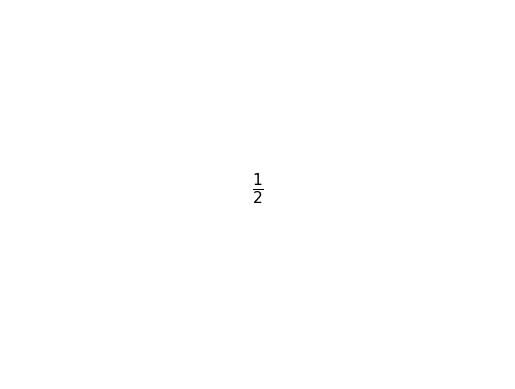

In [63]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.text(0.5, 0.5, r'$\frac{1}{2}$', fontsize=16, ha='center')
plt.axis('off')  # 关闭坐标轴
plt.show()

In [1]:
import torch
print(torch.cuda.is_available())
print(torch.__version__)

ModuleNotFoundError: No module named 'torch'